In [43]:
import numpy as np
import pandas as pd
import csv
import os
import matplotlib
import matplotlib.pyplot as plt
import math
import torch
import spinup
import multiprocessing as mp

from torch.autograd import Variable
from sklearn.linear_model import LinearRegression
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from spinup.algos.pytorch.ddpg.core import MLPActorCritic

%matplotlib notebook

In [44]:
from src import *
from src.constants import DT, MAX_X, MAX_Y, BALL_ERROR_SCALING, BALL_D_ERROR_SCALING, BALL_INTEGRAL_ERROR_SCALING

In [45]:
train = False

In [46]:
with open('src/data/benchmark_trajectory.json') as json_file:
    benchmark_data = json.load(json_file)

In [47]:
t = np.array(benchmark_data['t'])
test_trajectory = np.array(benchmark_data['target'])
benchmark_trajectory = np.array(benchmark_data['trajectory'])
benchmark_angle = np.array(benchmark_data['angle'])
benchmark_u = np.array(benchmark_data['u'])

# Exploration

In [48]:
epoch = 500

In [49]:
root = 'src/data/black_box_controller_no_integral/exploratory_penality'

In [57]:
def train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=False):
    if train:
        spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=activation), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
    trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
    evaluator_ddpg = env()
    history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg = evaluator_ddpg.simulate(trained_ac, test_trajectory)

    w = trained_ac.pi.state_dict()

    saved_weights = {}
    for key, value in w.items():
        saved_weights[key] = value.detach().numpy().tolist()

    with open('{}/{}/pyt_save/model.json'.format(root, name), 'w') as json_file:
        json.dump(saved_weights, json_file, indent=1)
    
    print("MSE :", loss_ddpg)

    log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
    fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
    axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
    axs[0].set_ylabel('AvergeEpRet')
    axs[0].legend()
    axs[2].set_xlabel('Epoch')

    axs[1].plot(log['LossPi'])
    axs[1].set_ylabel('Actor loss')
    axs[2].set_xlabel('Epoch')

    axs[2].plot(log['LossQ'])
    axs[2].set_ylabel('Critic loss')
    axs[2].set_xlabel('Epoch')

    fig, axs = plt.subplots(5, 1, sharex=True, figsize=(10, 10))

    axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
    axs[0].plot(t, test_trajectory[0, :], label='target')
    if show_benchmark:
        axs[0].plot(t, benchmark_trajectory[0, :], label='x_benchmark')
    axs[0].set_ylabel('Ball position x [m]')
    axs[0].set_ylim([-MAX_X, MAX_X])
    axs[0].legend()

    axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
    axs[1].plot(t, test_trajectory[1, :], label='target')
    if show_benchmark:
        axs[1].plot(t, benchmark_trajectory[1, :], label='y_benchmark')
    axs[1].set_ylabel('Ball position y [m]')
    axs[1].set_ylim([-MAX_X, MAX_X])
    axs[1].legend()

    axs[2].plot(t, error_ddpg[0, :], label='x')
    axs[2].plot(t, error_ddpg[1, :], label='y')
    if show_benchmark:
        axs[2].plot(t, benchmark_trajectory[0, :] - test_trajectory[0, :], label='benchmark x')
        axs[2].plot(t, benchmark_trajectory[1, :] - test_trajectory[1, :], label='benchmark y')
    axs[2].set_ylabel('Ball error [m]')
    axs[2].set_ylim([-MAX_X, MAX_X])
    axs[2].legend()

    axs[3].plot(t, angle_ddpg[0, :], label='angle_ddpg')
    axs[3].plot(t, u_ddpg[0, :], label='u_ddpg')
    if show_benchmark:
        axs[3].plot(t, benchmark_u[0, :], label='u benchmark')
    axs[3].set_ylabel('Motor x angle [deg]')
    axs[3].legend()

    axs[4].plot(t, angle_ddpg[1, :], label='angle_ddpg')
    axs[4].plot(t, u_ddpg[1, :], label='u_ddpg')
    if show_benchmark:
        axs[4].plot(t, benchmark_u[1, :], label='u benchmark')
    axs[4].set_xlabel('Time [s]')
    axs[4].set_ylabel('Motor y angle [deg]')
    axs[4].legend()

    plt.show()
    
    w = trained_ac.pi.state_dict()

    saved_weights = {}
    for key, value in w.items():
        saved_weights[key] = value.detach().numpy().tolist()

    with open('{}/{}/pyt_save/model.json'.format(root, name), 'w') as json_file:
        json.dump(saved_weights, json_file, indent=1)
        
    if show_benchmark:
        print("MSE ddpg", loss_ddpg)
        print("MSE benchmark", 0.0001483028)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -1818660233.9044542


<IPython.core.display.Javascript object>


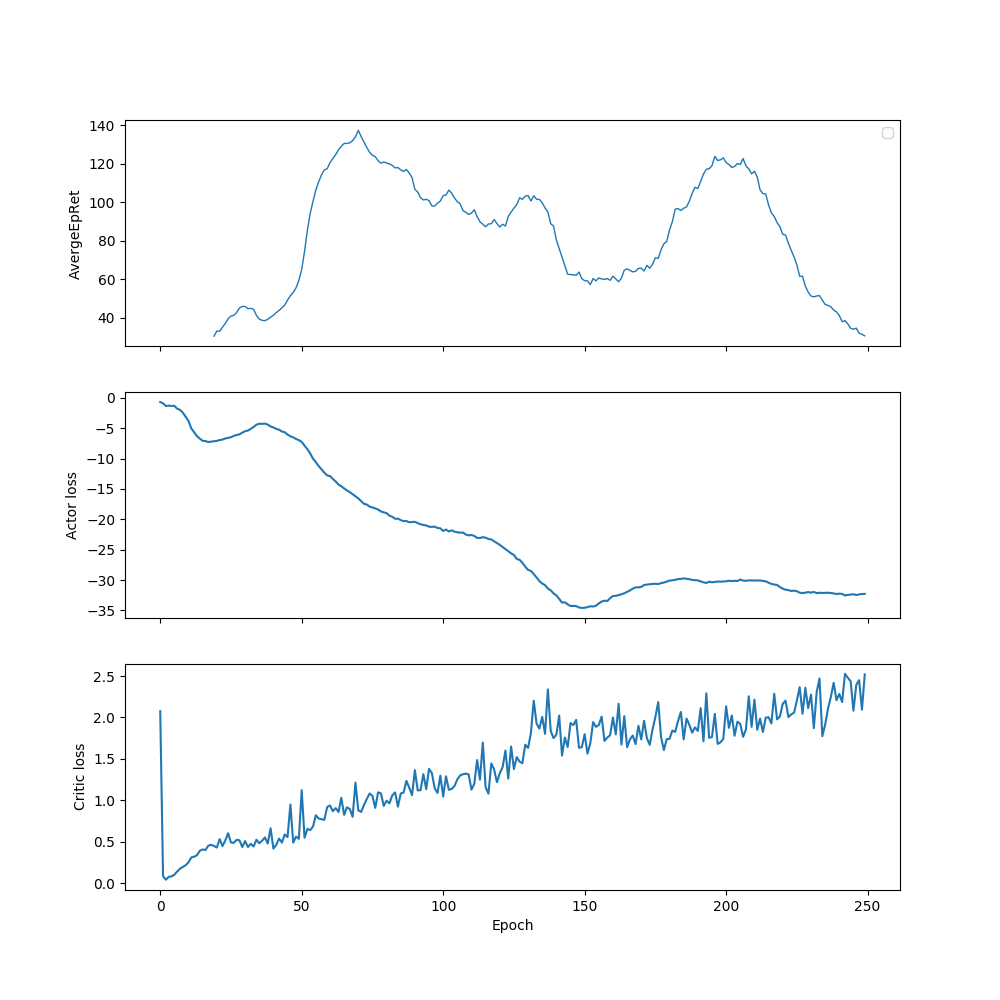

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


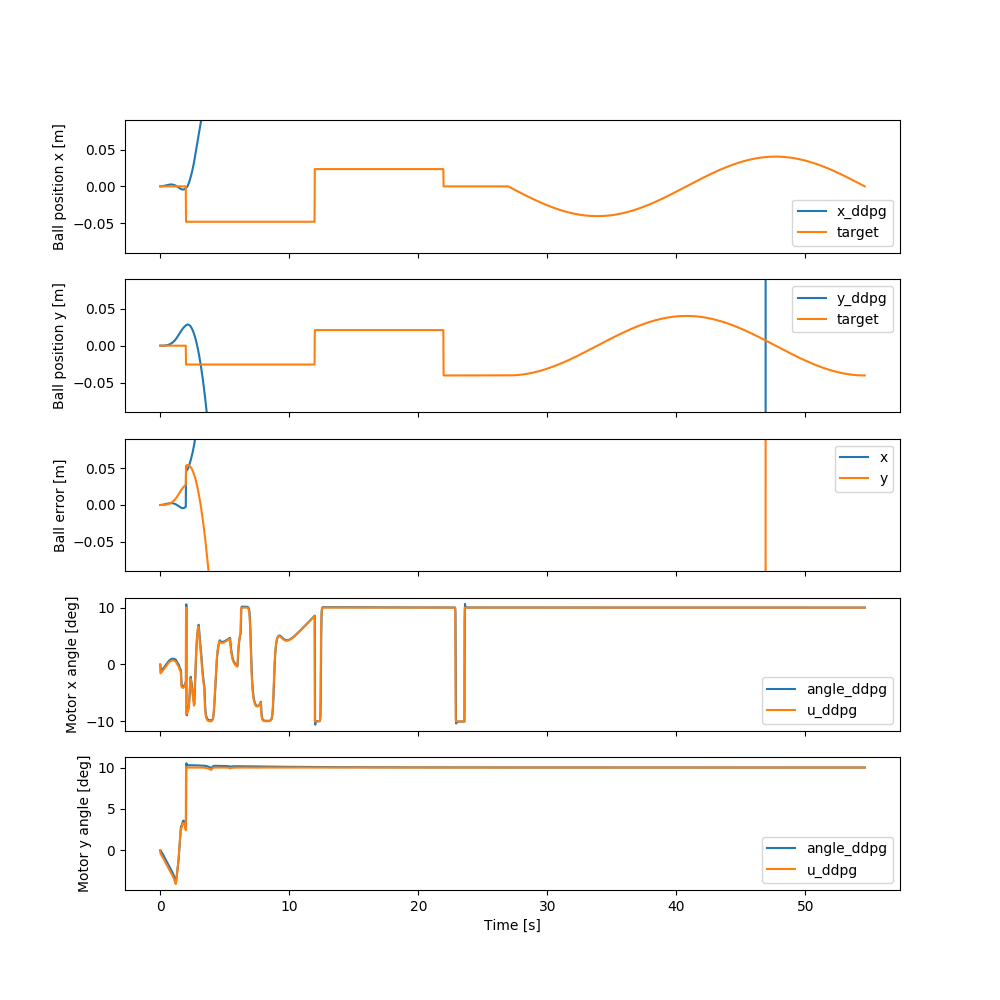

In [29]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [50]
activation = torch.nn.ReLU
name='lep_0.6_[50]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -2726056091.934216


<IPython.core.display.Javascript object>


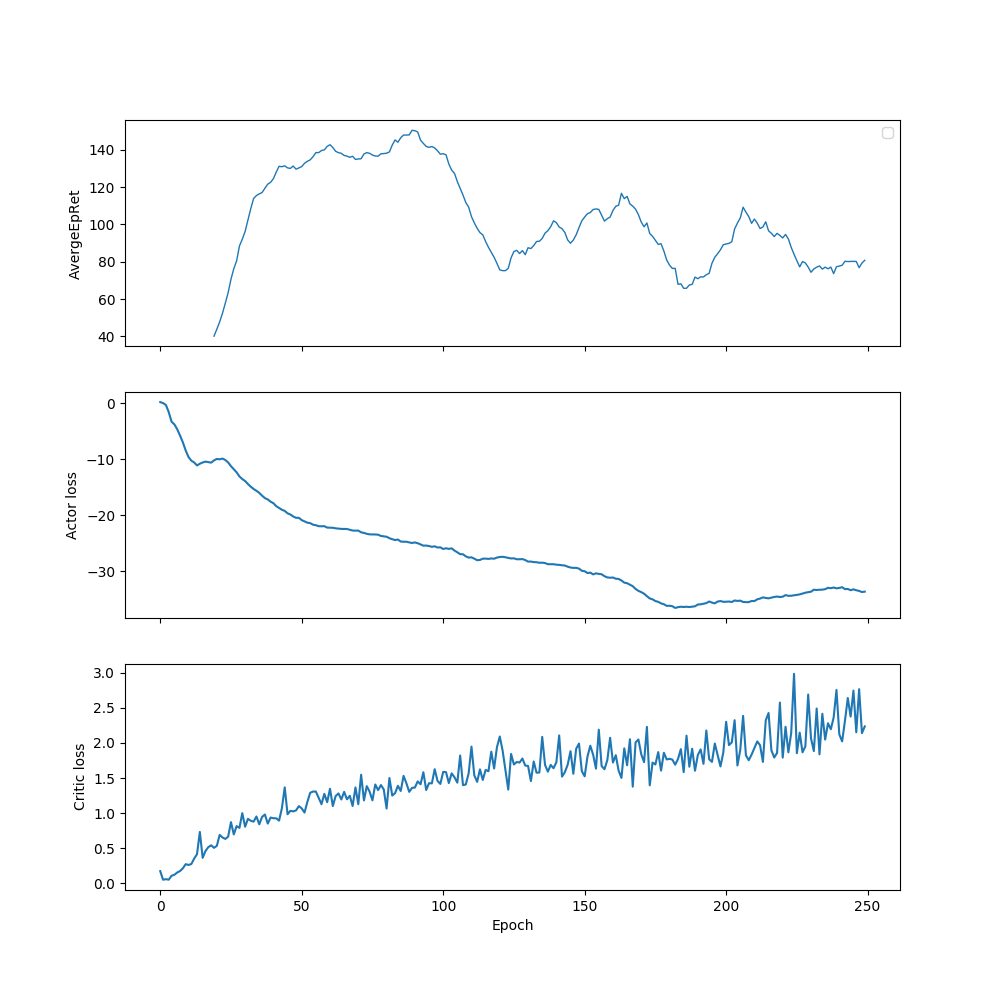

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


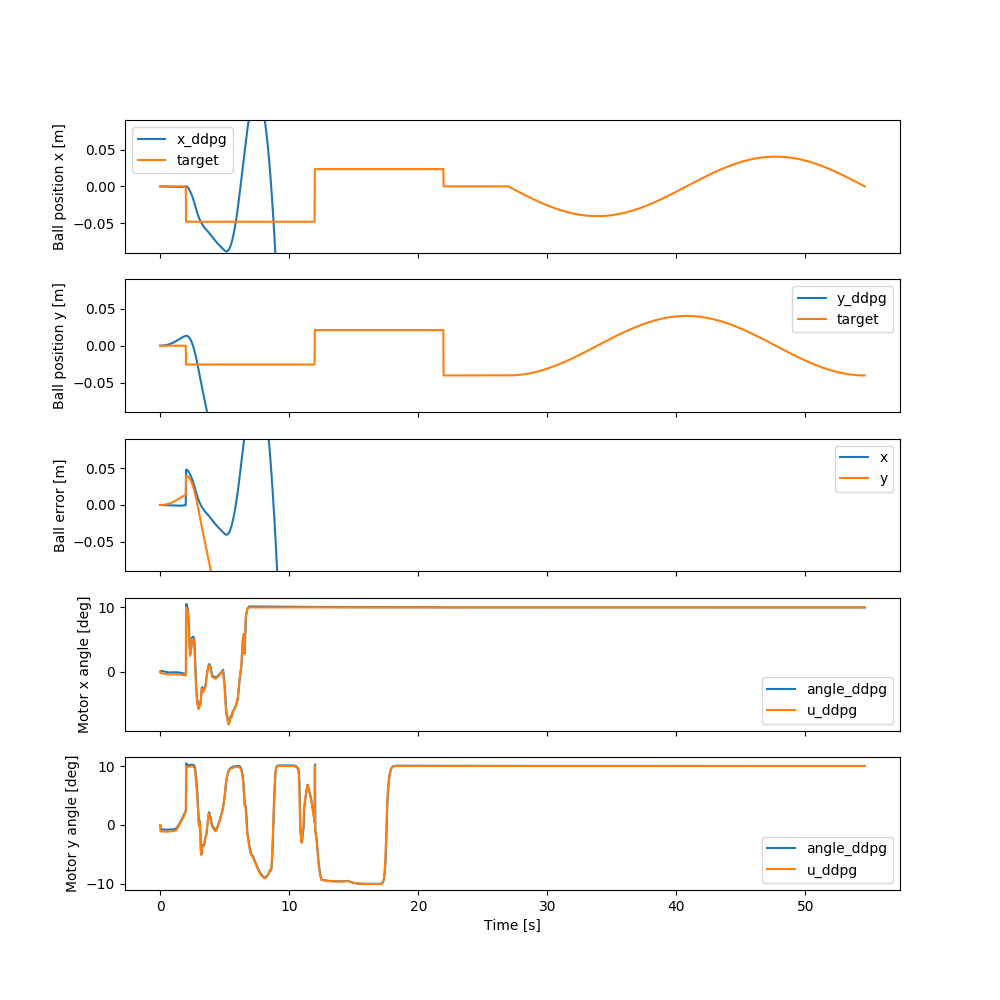

In [30]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100]
activation = torch.nn.ReLU
name='lep_0.6_[100]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.05108842, -0.05755054], dtype=float32), array([-0.00658219,  0.04378048], dtype=float32), array([-0.00155424, -0.00180118], dtype=float32))
MSE : -240744952.13184804


<IPython.core.display.Javascript object>


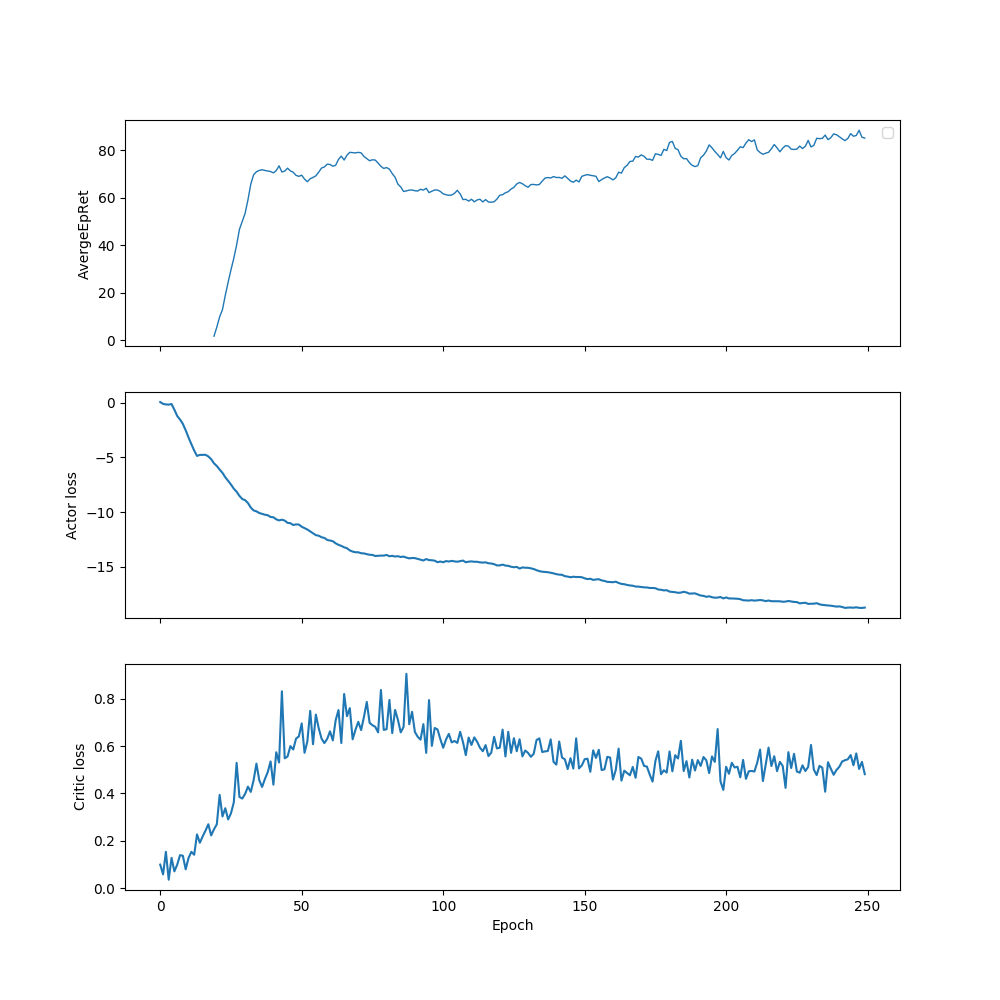

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


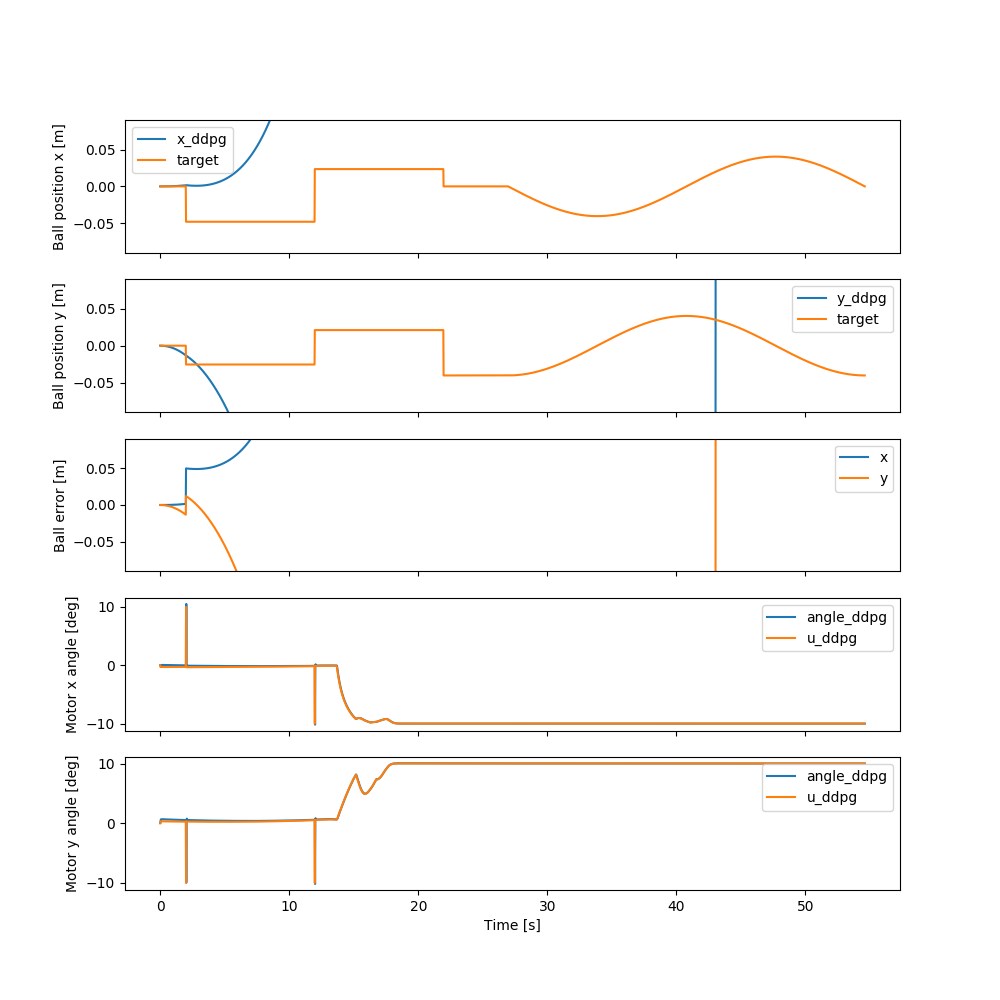

In [51]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200]
activation = torch.nn.ReLU
name='lep_0.6_[200]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_relu/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            400
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd4603c88d0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_relu",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_relu/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
    

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -22.2 |
|          StdEpRet |            5.46 |
|          MaxEpRet |           -18.2 |
|          MinEpRet |           -29.9 |
|  AverageTestEpRet |            62.1 |
|      StdTestEpRet |            33.6 |
|      MaxTestEpRet |             115 |
|      MinTestEpRet |           -34.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.83 |
|          StdQVals |            4.29 |
|          MaxQVals |            23.5 |
|          MinQVals |           -13.5 |
|            LossPi |           -3.05 |
|             LossQ |          0.0977 |
|              Time |            71.5 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            6.51 |
|          StdEpRet |            30.4 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            67.8 |
|          StdEpRet |            21.8 |
|          MaxEpRet |            89.5 |
|          MinEpRet |              46 |
|  AverageTestEpRet |            74.1 |
|      StdTestEpRet |            20.9 |
|      MaxTestEpRet |             109 |
|      MinTestEpRet |            20.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            7.25 |
|          StdQVals |            8.92 |
|          MaxQVals |            39.2 |
|          MinQVals |           -39.3 |
|            LossPi |           -7.45 |
|             LossQ |           0.228 |
|              Time |             210 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            47.7 |
|          StdEpRet |            17.4 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            91.4 |
|          StdEpRet |            10.2 |
|          MaxEpRet |             103 |
|          MinEpRet |            78.2 |
|  AverageTestEpRet |            88.5 |
|      StdTestEpRet |            47.9 |
|      MaxTestEpRet |             167 |
|      MinTestEpRet |           -27.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            11.8 |
|          StdQVals |            10.7 |
|          MaxQVals |            71.8 |
|          MinQVals |           -39.4 |
|            LossPi |           -11.9 |
|             LossQ |           0.457 |
|              Time |             337 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |              68 |
|          StdEpRet |            17.1 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            58.4 |
|          StdEpRet |           0.873 |
|          MaxEpRet |            59.3 |
|          MinEpRet |            57.5 |
|  AverageTestEpRet |            74.9 |
|      StdTestEpRet |            43.4 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |            19.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            13.1 |
|          StdQVals |            12.3 |
|          MaxQVals |            51.2 |
|          MinQVals |             -43 |
|            LossPi |           -13.2 |
|             LossQ |           0.586 |
|              Time |             469 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            77.9 |
|          StdEpRet |            29.6 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |           -30.4 |
|          StdEpRet |            26.1 |
|          MaxEpRet |           -4.87 |
|          MinEpRet |           -66.4 |
|  AverageTestEpRet |            11.5 |
|      StdTestEpRet |            36.1 |
|      MaxTestEpRet |             108 |
|      MinTestEpRet |           -58.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            13.2 |
|          StdQVals |            15.8 |
|          MaxQVals |             136 |
|          MinQVals |            -126 |
|            LossPi |           -13.3 |
|             LossQ |           0.996 |
|              Time |             585 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            18.3 |
|          StdEpRet |            41.1 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            46.4 |
|          StdEpRet |            23.5 |
|          MaxEpRet |            69.9 |
|          MinEpRet |            22.9 |
|  AverageTestEpRet |            61.7 |
|      StdTestEpRet |            40.5 |
|      MaxTestEpRet |             154 |
|      MinTestEpRet |           -7.51 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            12.3 |
|          StdQVals |            17.5 |
|          MaxQVals |              80 |
|          MinQVals |            -124 |
|            LossPi |           -12.4 |
|             LossQ |           0.891 |
|              Time |             711 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            49.5 |
|          StdEpRet |            49.5 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            18.9 |
|          StdEpRet |            15.4 |
|          MaxEpRet |            31.9 |
|          MinEpRet |           -2.79 |
|  AverageTestEpRet |            54.4 |
|      StdTestEpRet |            41.4 |
|      MaxTestEpRet |             154 |
|      MinTestEpRet |           0.117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            11.7 |
|          StdQVals |            17.2 |
|          MaxQVals |            87.6 |
|          MinQVals |            -135 |
|            LossPi |           -11.8 |
|             LossQ |           0.979 |
|              Time |             849 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |              59 |
|          StdEpRet |            51.8 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            38.8 |
|          StdEpRet |            34.6 |
|          MaxEpRet |            73.5 |
|          MinEpRet |            4.21 |
|  AverageTestEpRet |            46.6 |
|      StdTestEpRet |            33.6 |
|      MaxTestEpRet |             120 |
|      MinTestEpRet |           -14.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            11.6 |
|          StdQVals |            16.5 |
|          MaxQVals |            93.7 |
|          MinQVals |            -138 |
|            LossPi |           -11.7 |
|             LossQ |            1.03 |
|              Time |             971 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            9.64 |
|          StdEpRet |            18.3 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |            36.7 |
|          StdEpRet |            41.8 |
|          MaxEpRet |            95.8 |
|          MinEpRet |            3.92 |
|  AverageTestEpRet |            38.2 |
|      StdTestEpRet |            49.5 |
|      MaxTestEpRet |             142 |
|      MinTestEpRet |           -40.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            11.5 |
|          StdQVals |              16 |
|          MaxQVals |            71.4 |
|          MinQVals |            -136 |
|            LossPi |           -11.6 |
|             LossQ |            1.03 |
|              Time |        1.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |              27 |
|          StdEpRet |            28.6 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |              82 |
|          StdEpRet |           0.605 |
|          MaxEpRet |            82.6 |
|          MinEpRet |            81.4 |
|  AverageTestEpRet |            47.4 |
|      StdTestEpRet |            37.7 |
|      MaxTestEpRet |             135 |
|      MinTestEpRet |            1.24 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            11.7 |
|          StdQVals |            15.1 |
|          MaxQVals |            87.2 |
|          MinQVals |            -131 |
|            LossPi |           -11.8 |
|             LossQ |           0.922 |
|              Time |        1.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            37.1 |
|          StdEpRet |            18.7 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |            25.2 |
|          StdEpRet |            17.7 |
|          MaxEpRet |            43.3 |
|          MinEpRet |             1.2 |
|  AverageTestEpRet |            41.2 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             104 |
|      MinTestEpRet |           -20.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            11.9 |
|          StdQVals |            14.3 |
|          MaxQVals |             138 |
|          MinQVals |            -122 |
|            LossPi |           -11.9 |
|             LossQ |           0.961 |
|              Time |        1.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |            47.1 |
|          StdEpRet |            21.4 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |            7.27 |
|          StdEpRet |            21.3 |
|          MaxEpRet |            28.6 |
|          MinEpRet |             -14 |
|  AverageTestEpRet |            48.9 |
|      StdTestEpRet |              38 |
|      MaxTestEpRet |             162 |
|      MinTestEpRet |           -6.28 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            12.1 |
|          StdQVals |            13.6 |
|          MaxQVals |            85.8 |
|          MinQVals |            -116 |
|            LossPi |           -12.2 |
|             LossQ |           0.868 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            49.6 |
|          StdEpRet |            56.6 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            67.2 |
|          StdEpRet |            34.7 |
|          MaxEpRet |            99.3 |
|          MinEpRet |            18.9 |
|  AverageTestEpRet |            51.2 |
|      StdTestEpRet |            28.7 |
|      MaxTestEpRet |             124 |
|      MinTestEpRet |            17.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            12.4 |
|          StdQVals |            13.2 |
|          MaxQVals |            85.1 |
|          MinQVals |            -109 |
|            LossPi |           -12.5 |
|             LossQ |           0.829 |
|              Time |        1.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |              52 |
|          StdEpRet |            18.7 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            46.7 |
|          StdEpRet |            13.1 |
|          MaxEpRet |            59.8 |
|          MinEpRet |            33.7 |
|  AverageTestEpRet |            32.9 |
|      StdTestEpRet |            44.2 |
|      MaxTestEpRet |             108 |
|      MinTestEpRet |           -47.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            12.7 |
|          StdQVals |            12.5 |
|          MaxQVals |              70 |
|          MinQVals |           -95.7 |
|            LossPi |           -12.8 |
|             LossQ |           0.777 |
|              Time |        1.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            42.9 |
|          StdEpRet |            18.2 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |            46.4 |
|          StdEpRet |            11.3 |
|          MaxEpRet |            54.9 |
|          MinEpRet |            30.5 |
|  AverageTestEpRet |              64 |
|      StdTestEpRet |            21.6 |
|      MaxTestEpRet |             113 |
|      MinTestEpRet |            23.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            13.1 |
|          StdQVals |            11.9 |
|          MaxQVals |             108 |
|          MinQVals |           -92.6 |
|            LossPi |           -13.2 |
|             LossQ |           0.937 |
|              Time |        1.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            59.3 |
|          StdEpRet |            8.01 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            50.8 |
|          StdEpRet |            19.4 |
|          MaxEpRet |            70.2 |
|          MinEpRet |            31.4 |
|  AverageTestEpRet |            59.5 |
|      StdTestEpRet |            32.3 |
|      MaxTestEpRet |             118 |
|      MinTestEpRet |            8.37 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            13.6 |
|          StdQVals |            11.3 |
|          MaxQVals |              70 |
|          MinQVals |           -78.1 |
|            LossPi |           -13.7 |
|             LossQ |           0.812 |
|              Time |        1.84e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |              48 |
|          StdEpRet |            32.1 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |              56 |
|          StdEpRet |            19.3 |
|          MaxEpRet |            80.2 |
|          MinEpRet |            32.8 |
|  AverageTestEpRet |            62.9 |
|      StdTestEpRet |            37.1 |
|      MaxTestEpRet |             124 |
|      MinTestEpRet |            1.56 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            13.9 |
|          StdQVals |            10.9 |
|          MaxQVals |            74.2 |
|          MinQVals |           -70.1 |
|            LossPi |             -14 |
|             LossQ |           0.713 |
|              Time |        1.96e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |            60.6 |
|          StdEpRet |            31.9 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |            21.2 |
|          StdEpRet |            6.57 |
|          MaxEpRet |            27.8 |
|          MinEpRet |            14.7 |
|  AverageTestEpRet |            59.6 |
|      StdTestEpRet |            22.9 |
|      MaxTestEpRet |             106 |
|      MinTestEpRet |            24.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            14.3 |
|          StdQVals |            10.8 |
|          MaxQVals |            70.7 |
|          MinQVals |           -69.7 |
|            LossPi |           -14.4 |
|             LossQ |           0.692 |
|              Time |        2.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            38.1 |
|          StdEpRet |             6.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            34.5 |
|          StdEpRet |            8.73 |
|          MaxEpRet |            44.4 |
|          MinEpRet |            23.2 |
|  AverageTestEpRet |              72 |
|      StdTestEpRet |            22.2 |
|      MaxTestEpRet |             129 |
|      MinTestEpRet |            37.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            14.6 |
|          StdQVals |            10.5 |
|          MaxQVals |              75 |
|          MinQVals |           -67.6 |
|            LossPi |           -14.7 |
|             LossQ |           0.746 |
|              Time |        2.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            77.1 |
|          StdEpRet |            40.8 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |            49.5 |
|          StdEpRet |            27.7 |
|          MaxEpRet |            77.2 |
|          MinEpRet |            21.8 |
|  AverageTestEpRet |            61.2 |
|      StdTestEpRet |            22.3 |
|      MaxTestEpRet |             122 |
|      MinTestEpRet |            13.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            14.9 |
|          StdQVals |            10.2 |
|          MaxQVals |            98.8 |
|          MinQVals |            -116 |
|            LossPi |             -15 |
|             LossQ |            0.89 |
|              Time |        2.24e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |              53 |
|          StdEpRet |            42.2 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             105 |
|          StdEpRet |            34.8 |
|          MaxEpRet |             152 |
|          MinEpRet |            69.2 |
|  AverageTestEpRet |            70.8 |
|      StdTestEpRet |            26.7 |
|      MaxTestEpRet |             133 |
|      MinTestEpRet |            18.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |              15 |
|          StdQVals |            10.1 |
|          MaxQVals |            62.2 |
|          MinQVals |           -64.2 |
|            LossPi |           -15.1 |
|             LossQ |           0.727 |
|              Time |        2.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            62.5 |
|          StdEpRet |            5.62 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |            53.3 |
|          StdEpRet |            3.77 |
|          MaxEpRet |            57.1 |
|          MinEpRet |            49.5 |
|  AverageTestEpRet |            70.9 |
|      StdTestEpRet |            24.8 |
|      MaxTestEpRet |             125 |
|      MinTestEpRet |            38.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            15.2 |
|          StdQVals |            9.97 |
|          MaxQVals |             109 |
|          MinQVals |           -63.8 |
|            LossPi |           -15.3 |
|             LossQ |           0.805 |
|              Time |        2.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |            47.1 |
|          StdEpRet |              13 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |            58.1 |
|          StdEpRet |            24.6 |
|          MaxEpRet |            88.3 |
|          MinEpRet |            27.9 |
|  AverageTestEpRet |            75.4 |
|      StdTestEpRet |            32.1 |
|      MaxTestEpRet |             148 |
|      MinTestEpRet |            17.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            15.5 |
|          StdQVals |            9.87 |
|          MaxQVals |            80.7 |
|          MinQVals |           -66.1 |
|            LossPi |           -15.6 |
|             LossQ |           0.656 |
|              Time |        2.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            58.1 |
|          StdEpRet |            10.1 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            53.7 |
|          StdEpRet |            10.4 |
|          MaxEpRet |            64.1 |
|          MinEpRet |            43.3 |
|  AverageTestEpRet |            76.9 |
|      StdTestEpRet |            26.6 |
|      MaxTestEpRet |             116 |
|      MinTestEpRet |            21.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            15.7 |
|          StdQVals |            9.83 |
|          MaxQVals |             172 |
|          MinQVals |           -86.2 |
|            LossPi |           -15.7 |
|             LossQ |           0.829 |
|              Time |        2.81e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |            59.8 |
|          StdEpRet |            10.3 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            60.7 |
|          StdEpRet |            10.9 |
|          MaxEpRet |              74 |
|          MinEpRet |            47.3 |
|  AverageTestEpRet |            79.5 |
|      StdTestEpRet |              36 |
|      MaxTestEpRet |             170 |
|      MinTestEpRet |            17.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            15.8 |
|          StdQVals |            9.76 |
|          MaxQVals |            79.1 |
|          MinQVals |           -65.3 |
|            LossPi |           -15.9 |
|             LossQ |           0.677 |
|              Time |        2.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            57.7 |
|          StdEpRet |            7.82 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -329908.2385854769


<IPython.core.display.Javascript object>


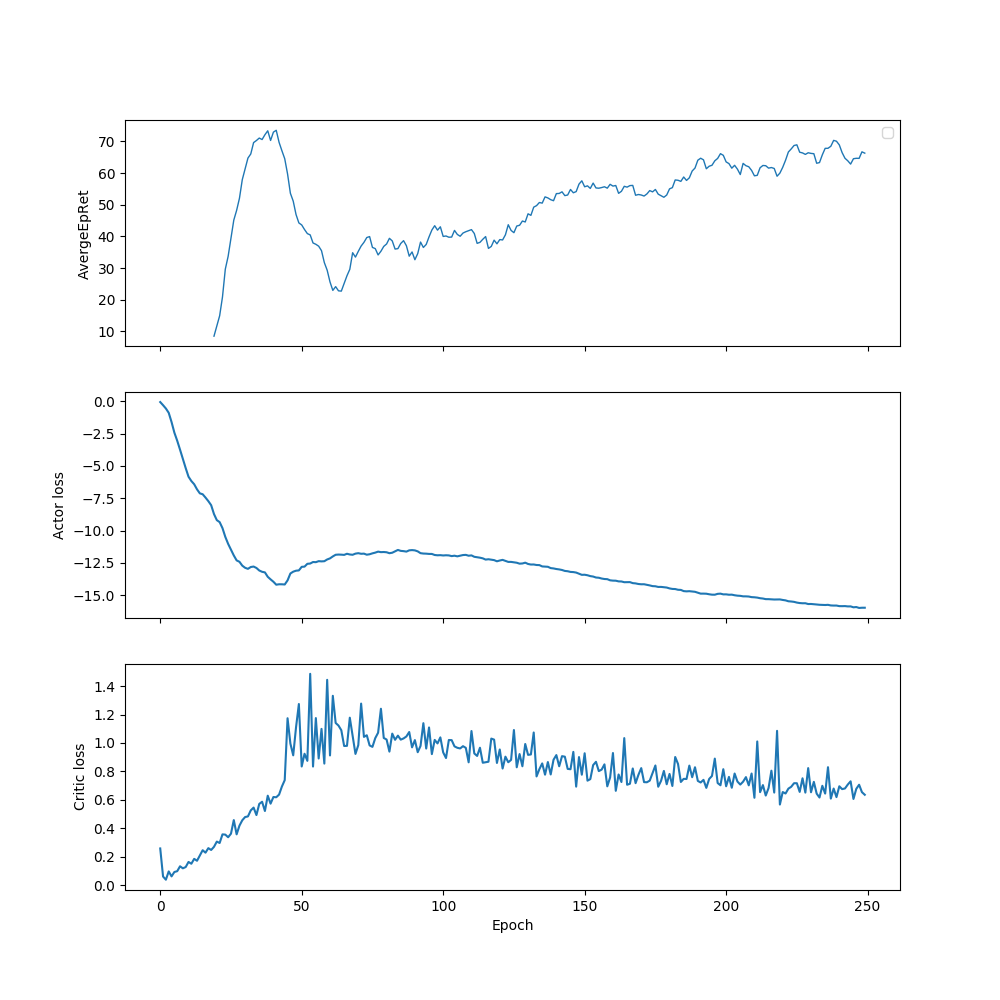

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


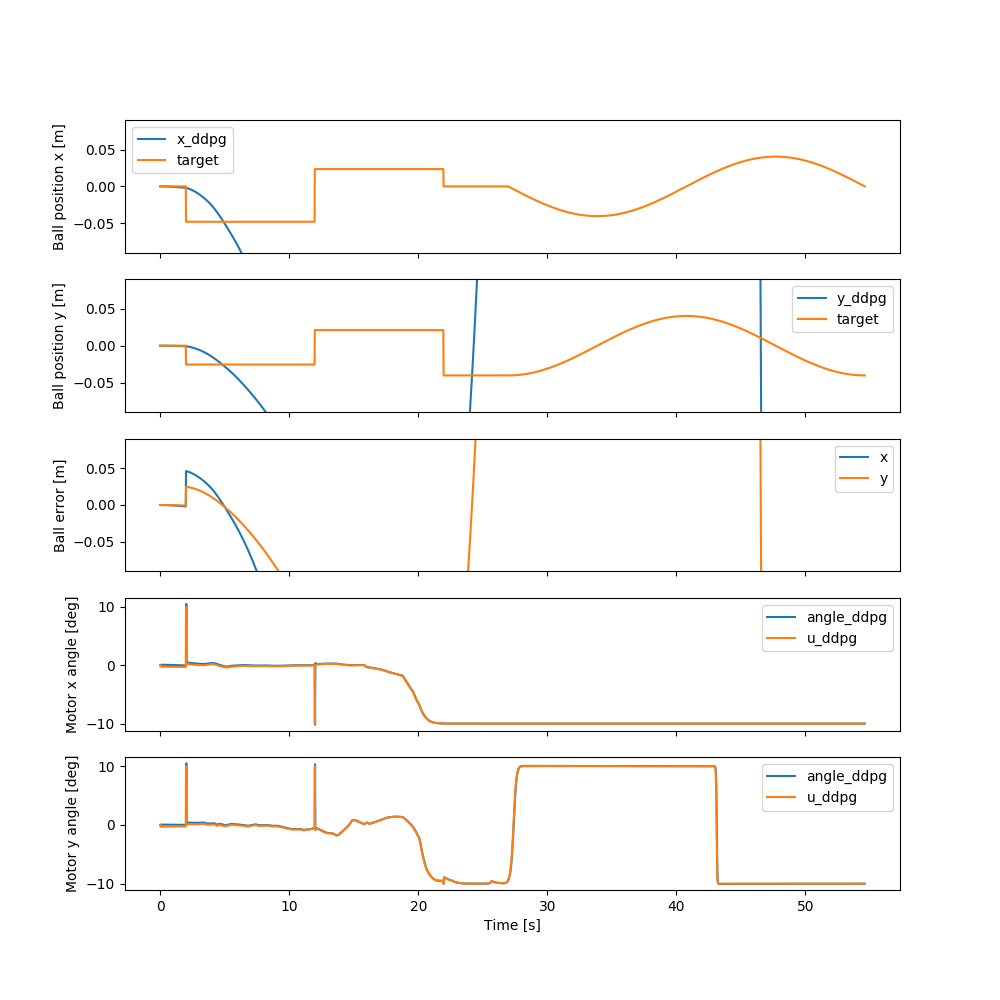

In [31]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400]
activation = torch.nn.ReLU
name='lep_0.6_[400]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            400
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd472b4b7b8>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mod

/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


---------------------------------------
|             Epoch |               1 |
|      AverageEpRet |           -21.9 |
|          StdEpRet |            24.7 |
|          MaxEpRet |            2.78 |
|          MinEpRet |           -46.5 |
|  AverageTestEpRet |            -170 |
|      StdTestEpRet |            5.71 |
|      MaxTestEpRet |            -159 |
|      MinTestEpRet |            -177 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.1e+03 |
|      AverageQVals |          0.0142 |
|          StdQVals |             0.2 |
|          MaxQVals |           0.462 |
|          MinQVals |          -0.395 |
|            LossPi |         -0.0217 |
|             LossQ |          0.0173 |
|              Time |            4.82 |
---------------------------------------
---------------------------------------
|             Epoch |               2 |
|      AverageEpRet |           -30.9 |
|          StdEpRet |            37.8 |


---------------------------------------
|             Epoch |              11 |
|      AverageEpRet |           -46.9 |
|          StdEpRet |            15.9 |
|          MaxEpRet |           -25.6 |
|          MinEpRet |           -63.7 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |            40.7 |
|      MaxTestEpRet |             199 |
|      MinTestEpRet |            54.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.21e+04 |
|      AverageQVals |            5.59 |
|          StdQVals |            5.05 |
|          MaxQVals |            21.5 |
|          MinQVals |           -2.95 |
|            LossPi |           -5.84 |
|             LossQ |          0.0994 |
|              Time |             186 |
---------------------------------------
---------------------------------------
|             Epoch |              12 |
|      AverageEpRet |           -26.6 |
|          StdEpRet |            21.1 |


---------------------------------------
|             Epoch |              21 |
|      AverageEpRet |             126 |
|          StdEpRet |            8.58 |
|          MaxEpRet |             135 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            88.3 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |            -113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.31e+04 |
|      AverageQVals |            14.1 |
|          StdQVals |            10.6 |
|          MaxQVals |            38.2 |
|          MinQVals |           -2.55 |
|            LossPi |           -14.3 |
|             LossQ |           0.422 |
|              Time |             362 |
---------------------------------------
---------------------------------------
|             Epoch |              22 |
|      AverageEpRet |             140 |
|          StdEpRet |            57.7 |


---------------------------------------
|             Epoch |              31 |
|      AverageEpRet |             123 |
|          StdEpRet |            66.1 |
|          MaxEpRet |             202 |
|          MinEpRet |            40.5 |
|  AverageTestEpRet |             109 |
|      StdTestEpRet |            90.1 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -50.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.41e+04 |
|      AverageQVals |            21.8 |
|          StdQVals |              14 |
|          MaxQVals |            46.2 |
|          MinQVals |            -1.7 |
|            LossPi |             -22 |
|             LossQ |           0.699 |
|              Time |             504 |
---------------------------------------
---------------------------------------
|             Epoch |              32 |
|      AverageEpRet |             114 |
|          StdEpRet |             105 |


---------------------------------------
|             Epoch |              41 |
|      AverageEpRet |            65.2 |
|          StdEpRet |             116 |
|          MaxEpRet |             181 |
|          MinEpRet |           -50.9 |
|  AverageTestEpRet |            80.3 |
|      StdTestEpRet |            98.8 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -55.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.51e+04 |
|      AverageQVals |            27.3 |
|          StdQVals |              17 |
|          MaxQVals |            51.4 |
|          MinQVals |           -12.3 |
|            LossPi |           -27.5 |
|             LossQ |            1.05 |
|              Time |             646 |
---------------------------------------
---------------------------------------
|             Epoch |              42 |
|      AverageEpRet |             155 |
|          StdEpRet |            46.3 |


---------------------------------------
|             Epoch |              51 |
|      AverageEpRet |             117 |
|          StdEpRet |           0.849 |
|          MaxEpRet |             119 |
|          MinEpRet |             117 |
|  AverageTestEpRet |              68 |
|      StdTestEpRet |            63.5 |
|      MaxTestEpRet |             158 |
|      MinTestEpRet |           -49.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.61e+04 |
|      AverageQVals |            31.6 |
|          StdQVals |            17.7 |
|          MaxQVals |            55.9 |
|          MinQVals |           -16.8 |
|            LossPi |           -31.8 |
|             LossQ |            1.13 |
|              Time |             820 |
---------------------------------------
---------------------------------------
|             Epoch |              52 |
|      AverageEpRet |           -2.41 |
|          StdEpRet |            74.8 |


---------------------------------------
|             Epoch |              61 |
|      AverageEpRet |            73.4 |
|          StdEpRet |            86.8 |
|          MaxEpRet |             160 |
|          MinEpRet |           -13.4 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            74.4 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |           -31.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.71e+04 |
|      AverageQVals |            33.3 |
|          StdQVals |            17.1 |
|          MaxQVals |              57 |
|          MinQVals |           -18.2 |
|            LossPi |           -33.5 |
|             LossQ |            1.15 |
|              Time |             975 |
---------------------------------------
---------------------------------------
|             Epoch |              62 |
|      AverageEpRet |             146 |
|          StdEpRet |            23.4 |


---------------------------------------
|             Epoch |              71 |
|      AverageEpRet |             150 |
|          StdEpRet |            4.36 |
|          MaxEpRet |             154 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             125 |
|      StdTestEpRet |            70.1 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |           -21.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.81e+04 |
|      AverageQVals |            35.5 |
|          StdQVals |            16.5 |
|          MaxQVals |            57.5 |
|          MinQVals |             -21 |
|            LossPi |           -35.7 |
|             LossQ |            1.18 |
|              Time |        1.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              72 |
|      AverageEpRet |             109 |
|          StdEpRet |            92.3 |


---------------------------------------
|             Epoch |              81 |
|      AverageEpRet |            57.9 |
|          StdEpRet |            71.2 |
|          MaxEpRet |             129 |
|          MinEpRet |           -13.3 |
|  AverageTestEpRet |             111 |
|      StdTestEpRet |            82.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            -105 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.91e+04 |
|      AverageQVals |            37.1 |
|          StdQVals |            15.7 |
|          MaxQVals |            57.5 |
|          MinQVals |           -13.1 |
|            LossPi |           -37.2 |
|             LossQ |            1.09 |
|              Time |         1.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              82 |
|      AverageEpRet |            40.8 |
|          StdEpRet |            61.8 |


---------------------------------------
|             Epoch |              91 |
|      AverageEpRet |             118 |
|          StdEpRet |            64.5 |
|          MaxEpRet |             180 |
|          MinEpRet |            28.8 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            58.9 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |           -2.53 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |           1e+05 |
|      AverageQVals |            37.9 |
|          StdQVals |            15.7 |
|          MaxQVals |              58 |
|          MinQVals |            -5.6 |
|            LossPi |             -38 |
|             LossQ |            1.13 |
|              Time |        1.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              92 |
|      AverageEpRet |             155 |
|          StdEpRet |            15.9 |


---------------------------------------
|             Epoch |             101 |
|      AverageEpRet |             189 |
|          StdEpRet |            35.4 |
|          MaxEpRet |             224 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |            47.5 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            17.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.11e+05 |
|      AverageQVals |            39.1 |
|          StdQVals |            15.9 |
|          MaxQVals |            58.5 |
|          MinQVals |           -1.82 |
|            LossPi |           -39.3 |
|             LossQ |            1.16 |
|              Time |        1.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             102 |
|      AverageEpRet |             139 |
|          StdEpRet |            39.9 |


---------------------------------------
|             Epoch |             111 |
|      AverageEpRet |            94.8 |
|          StdEpRet |            84.4 |
|          MaxEpRet |             161 |
|          MinEpRet |           -24.2 |
|  AverageTestEpRet |             116 |
|      StdTestEpRet |            65.9 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -3.19 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.22e+05 |
|      AverageQVals |            40.6 |
|          StdQVals |            15.9 |
|          MaxQVals |            60.6 |
|          MinQVals |           -2.77 |
|            LossPi |           -40.8 |
|             LossQ |            1.24 |
|              Time |        1.69e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             112 |
|      AverageEpRet |             119 |
|          StdEpRet |             3.4 |


---------------------------------------
|             Epoch |             121 |
|      AverageEpRet |              91 |
|          StdEpRet |            13.5 |
|          MaxEpRet |             104 |
|          MinEpRet |            77.5 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |            25.5 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |              83 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.33e+05 |
|      AverageQVals |            41.1 |
|          StdQVals |            15.3 |
|          MaxQVals |            59.9 |
|          MinQVals |           -5.49 |
|            LossPi |           -41.2 |
|             LossQ |            1.18 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             122 |
|      AverageEpRet |            78.4 |
|          StdEpRet |            64.9 |


---------------------------------------
|             Epoch |             131 |
|      AverageEpRet |            76.4 |
|          StdEpRet |            93.1 |
|          MaxEpRet |             206 |
|          MinEpRet |           -7.42 |
|  AverageTestEpRet |             117 |
|      StdTestEpRet |            68.8 |
|      MaxTestEpRet |             192 |
|      MinTestEpRet |           -70.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.44e+05 |
|      AverageQVals |            41.5 |
|          StdQVals |            14.6 |
|          MaxQVals |            59.6 |
|          MinQVals |           -3.28 |
|            LossPi |           -41.7 |
|             LossQ |             1.1 |
|              Time |        1.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             132 |
|      AverageEpRet |             147 |
|          StdEpRet |            38.3 |


---------------------------------------
|             Epoch |             141 |
|      AverageEpRet |             108 |
|          StdEpRet |            86.8 |
|          MaxEpRet |             195 |
|          MinEpRet |            21.4 |
|  AverageTestEpRet |             122 |
|      StdTestEpRet |            50.5 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |            13.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.55e+05 |
|      AverageQVals |            41.7 |
|          StdQVals |            14.2 |
|          MaxQVals |            59.1 |
|          MinQVals |           -7.93 |
|            LossPi |           -41.8 |
|             LossQ |            1.15 |
|              Time |        2.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             142 |
|      AverageEpRet |             117 |
|          StdEpRet |            57.5 |


---------------------------------------
|             Epoch |             151 |
|      AverageEpRet |             173 |
|          StdEpRet |            20.1 |
|          MaxEpRet |             196 |
|          MinEpRet |             147 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            85.7 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           -71.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.66e+05 |
|      AverageQVals |            42.7 |
|          StdQVals |            14.1 |
|          MaxQVals |            60.1 |
|          MinQVals |           -4.53 |
|            LossPi |           -42.9 |
|             LossQ |             1.2 |
|              Time |         2.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             152 |
|      AverageEpRet |             183 |
|          StdEpRet |              22 |


---------------------------------------
|             Epoch |             161 |
|      AverageEpRet |             194 |
|          StdEpRet |            2.27 |
|          MaxEpRet |             196 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            40.5 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |              62 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.77e+05 |
|      AverageQVals |            43.8 |
|          StdQVals |            14.2 |
|          MaxQVals |            61.1 |
|          MinQVals |           -3.58 |
|            LossPi |             -44 |
|             LossQ |            1.14 |
|              Time |        2.32e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             162 |
|      AverageEpRet |             173 |
|          StdEpRet |            22.7 |


---------------------------------------
|             Epoch |             171 |
|      AverageEpRet |             188 |
|          StdEpRet |            34.7 |
|          MaxEpRet |             235 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            47.2 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |            45.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.88e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            13.8 |
|          MaxQVals |            61.2 |
|          MinQVals |          -0.478 |
|            LossPi |           -44.8 |
|             LossQ |            1.17 |
|              Time |        2.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             172 |
|      AverageEpRet |             165 |
|          StdEpRet |            45.5 |


---------------------------------------
|             Epoch |             181 |
|      AverageEpRet |            40.7 |
|          StdEpRet |            54.8 |
|          MaxEpRet |            95.5 |
|          MinEpRet |           -14.1 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |              33 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |             101 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.99e+05 |
|      AverageQVals |            44.9 |
|          StdQVals |            13.4 |
|          MaxQVals |            60.1 |
|          MinQVals |           -1.13 |
|            LossPi |           -45.1 |
|             LossQ |            1.13 |
|              Time |        2.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             182 |
|      AverageEpRet |             163 |
|          StdEpRet |            27.2 |


---------------------------------------
|             Epoch |             191 |
|      AverageEpRet |             171 |
|          StdEpRet |              12 |
|          MaxEpRet |             183 |
|          MinEpRet |             154 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            66.6 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -77.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.1e+05 |
|      AverageQVals |            44.7 |
|          StdQVals |            12.8 |
|          MaxQVals |            60.1 |
|          MinQVals |          -0.431 |
|            LossPi |           -44.9 |
|             LossQ |             1.1 |
|              Time |        2.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             192 |
|      AverageEpRet |             145 |
|          StdEpRet |            16.3 |


---------------------------------------
|             Epoch |             201 |
|      AverageEpRet |            80.4 |
|          StdEpRet |            64.6 |
|          MaxEpRet |             145 |
|          MinEpRet |            15.9 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            50.7 |
|      MaxTestEpRet |             196 |
|      MinTestEpRet |           -46.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.21e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            59.9 |
|          MinQVals |            2.34 |
|            LossPi |           -44.7 |
|             LossQ |            1.11 |
|              Time |        2.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             202 |
|      AverageEpRet |             109 |
|          StdEpRet |            38.6 |


---------------------------------------
|             Epoch |             211 |
|      AverageEpRet |             137 |
|          StdEpRet |            21.5 |
|          MaxEpRet |             167 |
|          MinEpRet |             119 |
|  AverageTestEpRet |             131 |
|      StdTestEpRet |            81.5 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -83.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.32e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            12.4 |
|          MaxQVals |            59.2 |
|          MinQVals |          -0.205 |
|            LossPi |           -44.7 |
|             LossQ |            1.02 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             212 |
|      AverageEpRet |             166 |
|          StdEpRet |            23.2 |


---------------------------------------
|             Epoch |             221 |
|      AverageEpRet |             168 |
|          StdEpRet |            7.32 |
|          MaxEpRet |             176 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            36.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            93.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.43e+05 |
|      AverageQVals |            44.3 |
|          StdQVals |            12.3 |
|          MaxQVals |            59.5 |
|          MinQVals |           0.358 |
|            LossPi |           -44.5 |
|             LossQ |           0.996 |
|              Time |        3.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             222 |
|      AverageEpRet |             109 |
|          StdEpRet |            77.6 |


---------------------------------------
|             Epoch |             231 |
|      AverageEpRet |             117 |
|          StdEpRet |            49.4 |
|          MaxEpRet |             185 |
|          MinEpRet |              68 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |            37.3 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |            80.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.54e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            12.2 |
|          MaxQVals |            58.5 |
|          MinQVals |           -1.36 |
|            LossPi |           -44.7 |
|             LossQ |            1.04 |
|              Time |        3.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             232 |
|      AverageEpRet |             122 |
|          StdEpRet |            26.3 |


---------------------------------------
|             Epoch |             241 |
|      AverageEpRet |             158 |
|          StdEpRet |            12.9 |
|          MaxEpRet |             171 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            38.3 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |            63.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.65e+05 |
|      AverageQVals |              45 |
|          StdQVals |            12.2 |
|          MaxQVals |              59 |
|          MinQVals |           -2.51 |
|            LossPi |           -45.2 |
|             LossQ |            1.06 |
|              Time |        3.24e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             242 |
|      AverageEpRet |             178 |
|          StdEpRet |            9.18 |


{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.03806764,  0.05312261], dtype=float32), array([-0.02806336,  0.04183384], dtype=float32), array([-0.00129481, -0.00091888], dtype=float32))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00032264282133685323


<IPython.core.display.Javascript object>


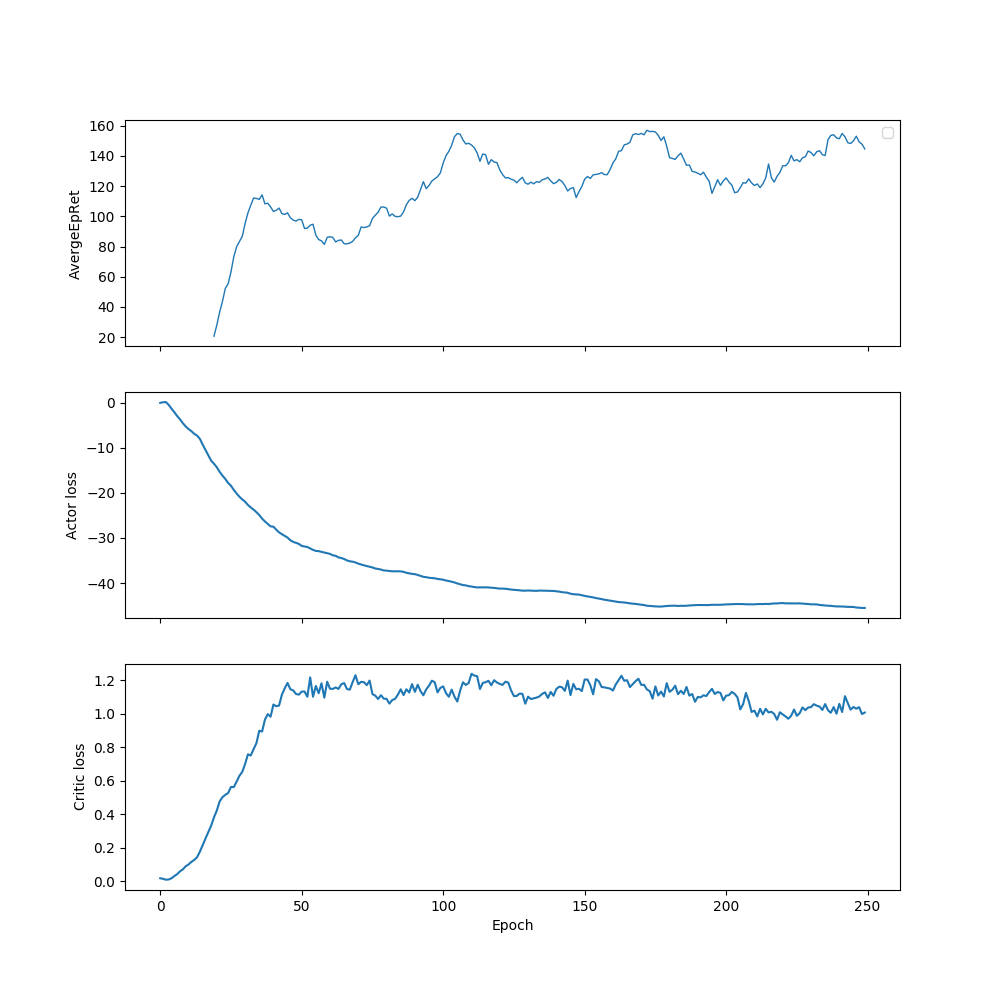

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


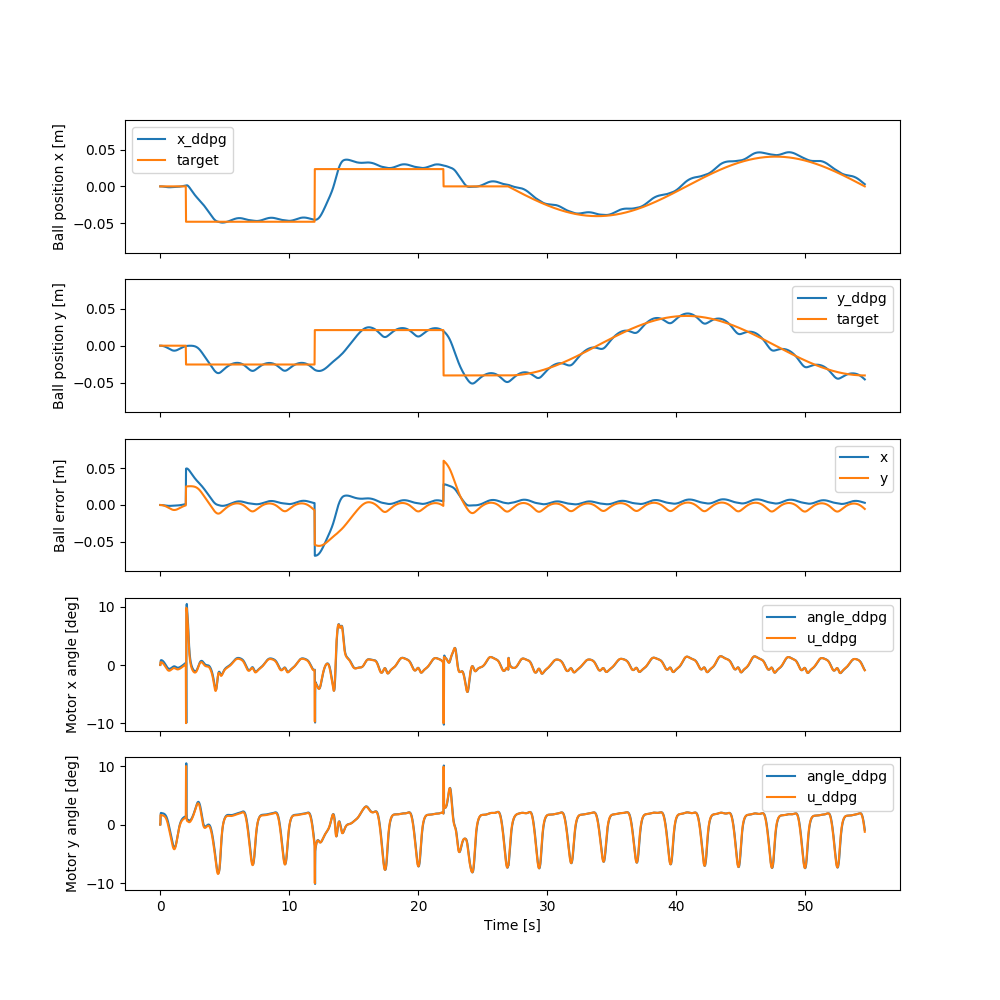

In [18]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400]
activation = torch.nn.Sigmoid
name='lep_0.6_[400]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid_2/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            400
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd45076a4a8>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid_2",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400]_sigmoid_2/progress.txt' mode='w' encoding='UTF-8'>":	{
                  

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            5.87 |
|          StdEpRet |            22.9 |
|          MaxEpRet |            37.6 |
|          MinEpRet |           -15.5 |
|  AverageTestEpRet |            66.5 |
|      StdTestEpRet |            31.6 |
|      MaxTestEpRet |             130 |
|      MinTestEpRet |           -7.01 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |             2.8 |
|          StdQVals |            3.14 |
|          MaxQVals |            12.9 |
|          MinQVals |           -2.35 |
|            LossPi |           -3.03 |
|             LossQ |          0.0348 |
|              Time |            86.3 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -12.7 |
|          StdEpRet |            39.4 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |              95 |
|          StdEpRet |            26.8 |
|          MaxEpRet |             122 |
|          MinEpRet |            68.2 |
|  AverageTestEpRet |             120 |
|      StdTestEpRet |              53 |
|      MaxTestEpRet |             205 |
|      MinTestEpRet |            30.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.61 |
|          StdQVals |            8.43 |
|          MaxQVals |            31.5 |
|          MinQVals |           -3.16 |
|            LossPi |           -9.83 |
|             LossQ |           0.222 |
|              Time |             217 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             126 |
|          StdEpRet |            63.1 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             197 |
|          StdEpRet |            52.6 |
|          MaxEpRet |             236 |
|          MinEpRet |             123 |
|  AverageTestEpRet |             119 |
|      StdTestEpRet |            48.8 |
|      MaxTestEpRet |             177 |
|      MinTestEpRet |             -36 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            19.3 |
|          StdQVals |            13.2 |
|          MaxQVals |            41.5 |
|          MinQVals |           -4.11 |
|            LossPi |           -19.5 |
|             LossQ |           0.516 |
|              Time |             343 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             118 |
|          StdEpRet |            85.1 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            98.3 |
|          StdEpRet |            60.6 |
|          MaxEpRet |             159 |
|          MinEpRet |            37.7 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            90.8 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |            -121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            27.1 |
|          StdQVals |              15 |
|          MaxQVals |            47.6 |
|          MinQVals |           -6.76 |
|            LossPi |           -27.3 |
|             LossQ |           0.694 |
|              Time |             464 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            17.2 |
|          StdEpRet |            97.6 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             135 |
|          StdEpRet |            20.4 |
|          MaxEpRet |             150 |
|          MinEpRet |             106 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            35.8 |
|      MaxTestEpRet |             207 |
|      MinTestEpRet |            40.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            32.1 |
|          StdQVals |              16 |
|          MaxQVals |            52.2 |
|          MinQVals |           -12.3 |
|            LossPi |           -32.3 |
|             LossQ |            1.01 |
|              Time |             584 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             133 |
|          StdEpRet |            18.4 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             120 |
|          StdEpRet |            13.7 |
|          MaxEpRet |             134 |
|          MinEpRet |             106 |
|  AverageTestEpRet |             130 |
|      StdTestEpRet |            43.1 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |             3.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            35.7 |
|          StdQVals |            15.8 |
|          MaxQVals |            54.8 |
|          MinQVals |           -11.1 |
|            LossPi |           -35.9 |
|             LossQ |            1.05 |
|              Time |             703 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             100 |
|          StdEpRet |            54.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            87.4 |
|          StdEpRet |             106 |
|          MaxEpRet |             177 |
|          MinEpRet |           -62.2 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            69.8 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |             -49 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            37.9 |
|          StdQVals |            16.2 |
|          MaxQVals |            57.6 |
|          MinQVals |           -12.9 |
|            LossPi |           -38.1 |
|             LossQ |            1.03 |
|              Time |             820 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             101 |
|          StdEpRet |            84.5 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             178 |
|          StdEpRet |            9.84 |
|          MaxEpRet |             188 |
|          MinEpRet |             168 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |            50.8 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |            52.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            39.5 |
|          StdQVals |            15.5 |
|          MaxQVals |            58.7 |
|          MinQVals |           -12.4 |
|            LossPi |           -39.6 |
|             LossQ |            1.05 |
|              Time |             950 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             176 |
|          StdEpRet |            33.2 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             164 |
|          StdEpRet |            17.2 |
|          MaxEpRet |             180 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             166 |
|      StdTestEpRet |            31.8 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |            81.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            41.1 |
|          StdQVals |            15.2 |
|          MaxQVals |            59.8 |
|          MinQVals |             -14 |
|            LossPi |           -41.3 |
|             LossQ |            1.03 |
|              Time |        1.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             143 |
|          StdEpRet |            26.8 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             202 |
|          StdEpRet |            4.21 |
|          MaxEpRet |             206 |
|          MinEpRet |             198 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            40.4 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |            80.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            42.1 |
|          StdQVals |            14.8 |
|          MaxQVals |            59.3 |
|          MinQVals |           -10.7 |
|            LossPi |           -42.3 |
|             LossQ |            1.04 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             112 |
|          StdEpRet |            34.6 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             160 |
|          StdEpRet |            38.6 |
|          MaxEpRet |             207 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            43.7 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            40.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            42.8 |
|          StdQVals |            14.1 |
|          MaxQVals |            58.5 |
|          MinQVals |           -4.29 |
|            LossPi |           -42.9 |
|             LossQ |            1.05 |
|              Time |        1.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             140 |
|          StdEpRet |            44.1 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             125 |
|          StdEpRet |            37.3 |
|          MaxEpRet |             162 |
|          MinEpRet |            87.6 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            40.9 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |            49.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            43.5 |
|          StdQVals |            13.5 |
|          MaxQVals |            59.6 |
|          MinQVals |           -7.52 |
|            LossPi |           -43.6 |
|             LossQ |            1.09 |
|              Time |        1.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             163 |
|          StdEpRet |            48.9 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             135 |
|          StdEpRet |            37.1 |
|          MaxEpRet |             170 |
|          MinEpRet |            83.5 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            45.8 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |            50.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            44.3 |
|          StdQVals |            13.2 |
|          MaxQVals |            59.9 |
|          MinQVals |           -4.88 |
|            LossPi |           -44.4 |
|             LossQ |            1.07 |
|              Time |        1.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             167 |
|          StdEpRet |            41.8 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             122 |
|          StdEpRet |            4.67 |
|          MaxEpRet |             126 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             134 |
|      StdTestEpRet |            37.1 |
|      MaxTestEpRet |             205 |
|      MinTestEpRet |            63.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            44.9 |
|          StdQVals |            13.1 |
|          MaxQVals |            60.3 |
|          MinQVals |           -1.16 |
|            LossPi |             -45 |
|             LossQ |             1.1 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            86.6 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             114 |
|          StdEpRet |            49.1 |
|          MaxEpRet |             176 |
|          MinEpRet |            55.6 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |              35 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |            86.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |              45 |
|          StdQVals |            12.9 |
|          MaxQVals |            60.8 |
|          MinQVals |            -1.1 |
|            LossPi |           -45.2 |
|             LossQ |             1.1 |
|              Time |        2.35e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             179 |
|          StdEpRet |            37.2 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             115 |
|          StdEpRet |            6.59 |
|          MaxEpRet |             121 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            41.9 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |            74.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |              45 |
|          StdQVals |            12.8 |
|          MaxQVals |              61 |
|          MinQVals |          -0.729 |
|            LossPi |           -45.2 |
|             LossQ |            1.15 |
|              Time |        2.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             185 |
|          StdEpRet |              40 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             121 |
|          StdEpRet |            26.9 |
|          MaxEpRet |             143 |
|          MinEpRet |            83.1 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |            39.1 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            89.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |              46 |
|          StdQVals |            12.6 |
|          MaxQVals |            62.2 |
|          MinQVals |             2.5 |
|            LossPi |           -46.1 |
|             LossQ |            1.11 |
|              Time |         2.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             128 |
|          StdEpRet |            18.1 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             135 |
|          StdEpRet |            25.9 |
|          MaxEpRet |             161 |
|          MinEpRet |             109 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            41.9 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |            72.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            12.4 |
|          MaxQVals |            62.6 |
|          MinQVals |             3.7 |
|            LossPi |           -46.5 |
|             LossQ |            1.06 |
|              Time |        2.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            86.7 |
|          StdEpRet |            37.7 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            67.9 |
|          StdEpRet |             102 |
|          MaxEpRet |             180 |
|          MinEpRet |           -66.7 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            52.1 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            58.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            12.2 |
|          MaxQVals |            61.8 |
|          MinQVals |             1.8 |
|            LossPi |           -46.6 |
|             LossQ |            1.08 |
|              Time |        3.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             118 |
|          StdEpRet |            36.9 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             198 |
|          StdEpRet |            27.8 |
|          MaxEpRet |             226 |
|          MinEpRet |             170 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            51.2 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            28.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            46.5 |
|          StdQVals |            11.9 |
|          MaxQVals |            60.7 |
|          MinQVals |            -5.5 |
|            LossPi |           -46.7 |
|             LossQ |            1.08 |
|              Time |        3.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             169 |
|          StdEpRet |            20.8 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             137 |
|          StdEpRet |            50.6 |
|          MaxEpRet |             200 |
|          MinEpRet |            75.6 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |              51 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |            19.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            46.8 |
|          StdQVals |            11.7 |
|          MaxQVals |              60 |
|          MinQVals |           -5.73 |
|            LossPi |           -46.9 |
|             LossQ |            1.07 |
|              Time |        3.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             113 |
|          StdEpRet |            63.8 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             145 |
|          StdEpRet |            31.8 |
|          MaxEpRet |             176 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |              41 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            45.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            47.1 |
|          StdQVals |            11.7 |
|          MaxQVals |            61.2 |
|          MinQVals |          -0.718 |
|            LossPi |           -47.2 |
|             LossQ |            1.06 |
|              Time |         3.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             119 |
|          StdEpRet |            16.2 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             132 |
|          StdEpRet |            32.2 |
|          MaxEpRet |             177 |
|          MinEpRet |             104 |
|  AverageTestEpRet |             121 |
|      StdTestEpRet |              66 |
|      MaxTestEpRet |             192 |
|      MinTestEpRet |           -58.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |              47 |
|          StdQVals |            11.9 |
|          MaxQVals |            60.9 |
|          MinQVals |           -4.28 |
|            LossPi |           -47.1 |
|             LossQ |            1.16 |
|              Time |        3.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |              35 |
|          StdEpRet |            99.5 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            57.1 |
|          StdEpRet |             145 |
|          MaxEpRet |             202 |
|          MinEpRet |           -88.1 |
|  AverageTestEpRet |             117 |
|      StdTestEpRet |            88.5 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |           -95.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            47.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            64.4 |
|          MinQVals |           -2.11 |
|            LossPi |           -47.8 |
|             LossQ |             1.3 |
|              Time |        3.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             123 |
|          StdEpRet |            32.4 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            88.1 |
|          StdEpRet |            52.2 |
|          MaxEpRet |             161 |
|          MinEpRet |            42.8 |
|  AverageTestEpRet |             138 |
|      StdTestEpRet |            56.3 |
|      MaxTestEpRet |             211 |
|      MinTestEpRet |           -49.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |              48 |
|          StdQVals |            12.6 |
|          MaxQVals |            62.1 |
|          MinQVals |           -1.43 |
|            LossPi |           -48.1 |
|             LossQ |            1.26 |
|              Time |        3.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             130 |
|          StdEpRet |            29.6 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0005492906174924962


<IPython.core.display.Javascript object>


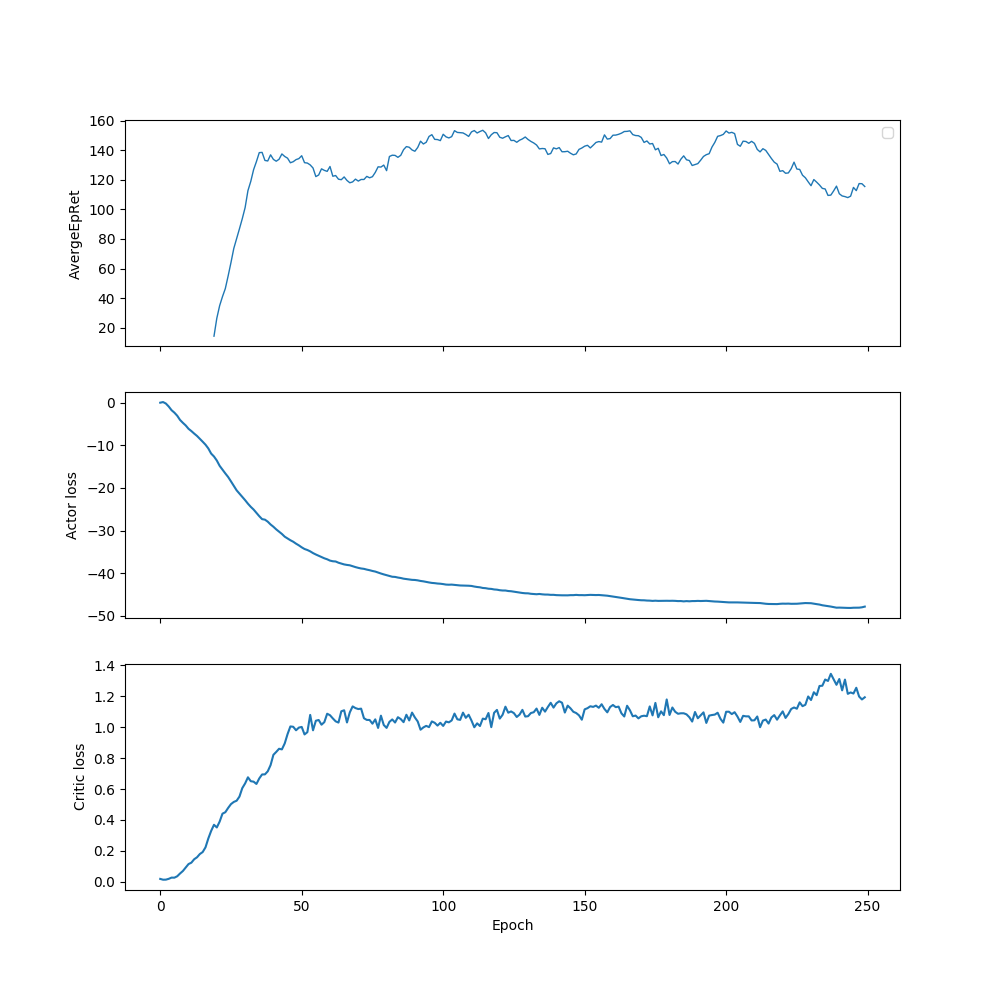

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


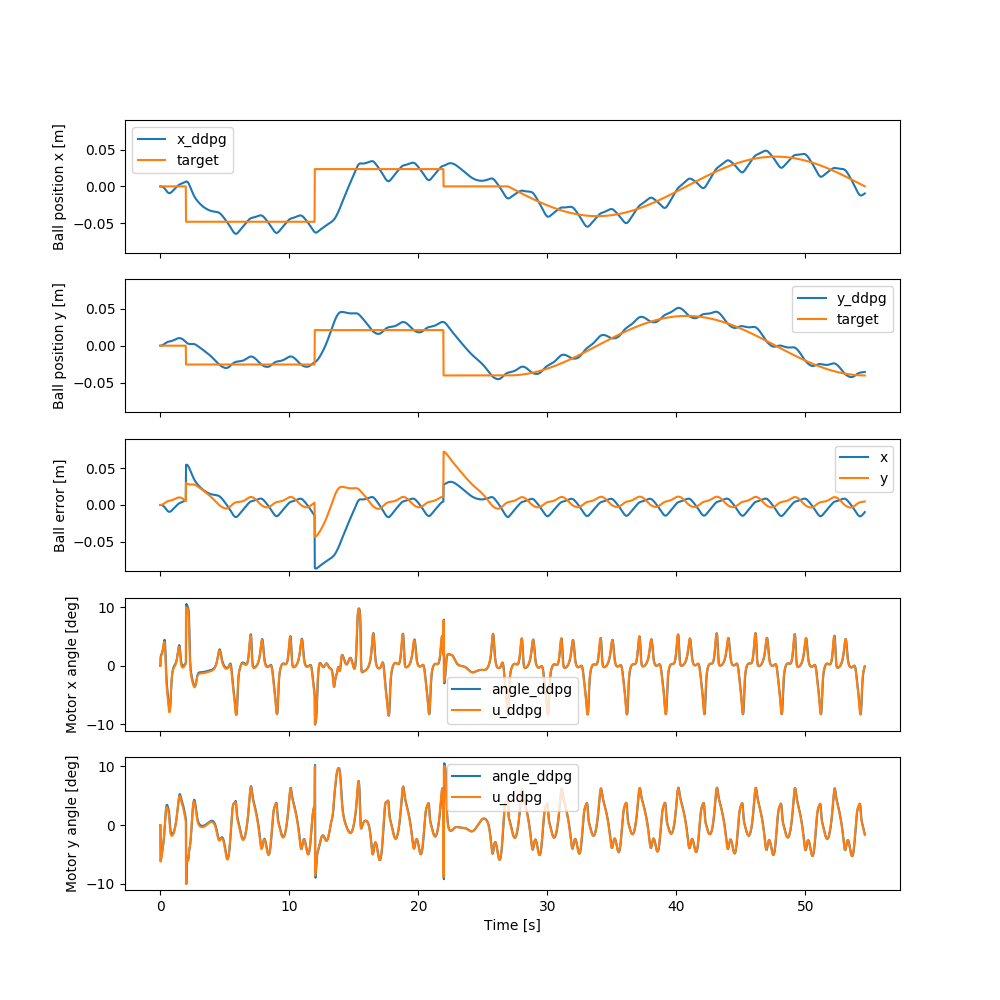

In [32]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400]
activation = torch.nn.Sigmoid
name='lep_0.6_[400]_sigmoid_2'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd472b4b6d8>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid/progress.txt' mode='w' encoding='UTF-8'>

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -47.6 |
|          StdEpRet |            7.27 |
|          MaxEpRet |           -38.8 |
|          MinEpRet |           -56.6 |
|  AverageTestEpRet |            87.2 |
|      StdTestEpRet |            25.6 |
|      MaxTestEpRet |             154 |
|      MinTestEpRet |            51.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.71 |
|          StdQVals |            3.63 |
|          MaxQVals |            13.3 |
|          MinQVals |           -1.58 |
|            LossPi |           -3.93 |
|             LossQ |          0.0339 |
|              Time |              96 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -21.8 |
|          StdEpRet |              32 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            3.01 |
|          StdEpRet |              37 |
|          MaxEpRet |              40 |
|          MinEpRet |             -34 |
|  AverageTestEpRet |             110 |
|      StdTestEpRet |            84.5 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -89.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.83 |
|          StdQVals |            8.43 |
|          MaxQVals |            29.9 |
|          MinQVals |           -2.23 |
|            LossPi |           -10.1 |
|             LossQ |           0.135 |
|              Time |             241 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            17.2 |
|          StdEpRet |            30.4 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             158 |
|          StdEpRet |            18.4 |
|          MaxEpRet |             180 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             101 |
|      StdTestEpRet |            72.1 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |           -36.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            19.1 |
|          StdQVals |            13.3 |
|          MaxQVals |            39.9 |
|          MinQVals |           -7.65 |
|            LossPi |           -19.4 |
|             LossQ |           0.335 |
|              Time |             386 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             155 |
|          StdEpRet |            25.2 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            81.5 |
|          StdEpRet |              58 |
|          MaxEpRet |             140 |
|          MinEpRet |            23.4 |
|  AverageTestEpRet |             138 |
|      StdTestEpRet |            80.9 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |           -60.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            26.4 |
|          StdQVals |            15.5 |
|          MaxQVals |              47 |
|          MinQVals |            -8.4 |
|            LossPi |           -26.6 |
|             LossQ |           0.498 |
|              Time |             529 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             142 |
|          StdEpRet |            16.9 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             135 |
|          StdEpRet |            23.9 |
|          MaxEpRet |             164 |
|          MinEpRet |             105 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |            61.7 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -32.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |              32 |
|          StdQVals |            15.9 |
|          MaxQVals |            50.3 |
|          MinQVals |            -6.9 |
|            LossPi |           -32.2 |
|             LossQ |           0.594 |
|              Time |             679 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            92.7 |
|          StdEpRet |            71.6 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             144 |
|          StdEpRet |            31.3 |
|          MaxEpRet |             176 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |              35 |
|      MaxTestEpRet |             211 |
|      MinTestEpRet |            49.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            35.3 |
|          StdQVals |            15.3 |
|          MaxQVals |            52.8 |
|          MinQVals |           -8.02 |
|            LossPi |           -35.5 |
|             LossQ |           0.673 |
|              Time |             825 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             129 |
|          StdEpRet |            39.3 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             151 |
|          StdEpRet |              14 |
|          MaxEpRet |             167 |
|          MinEpRet |             133 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            40.2 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |            58.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            38.6 |
|          StdQVals |            14.6 |
|          MaxQVals |            54.9 |
|          MinQVals |            -6.8 |
|            LossPi |           -38.8 |
|             LossQ |           0.669 |
|              Time |             972 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             145 |
|          StdEpRet |            94.1 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             172 |
|          StdEpRet |            15.2 |
|          MaxEpRet |             187 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            38.4 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |            99.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            40.4 |
|          StdQVals |            14.3 |
|          MaxQVals |            56.3 |
|          MinQVals |           -12.5 |
|            LossPi |           -40.5 |
|             LossQ |            0.81 |
|              Time |        1.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             174 |
|          StdEpRet |            10.2 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             159 |
|          StdEpRet |              45 |
|          MaxEpRet |             209 |
|          MinEpRet |            99.9 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |              38 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |             112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            41.8 |
|          StdQVals |            14.4 |
|          MaxQVals |            57.2 |
|          MinQVals |           -3.85 |
|            LossPi |           -41.9 |
|             LossQ |           0.796 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            59.3 |
|          StdEpRet |            82.4 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            28.4 |
|          StdEpRet |            83.2 |
|          MaxEpRet |             112 |
|          MinEpRet |           -54.7 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            34.9 |
|      MaxTestEpRet |             201 |
|      MinTestEpRet |            32.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            42.5 |
|          StdQVals |              14 |
|          MaxQVals |            57.4 |
|          MinQVals |           -1.31 |
|            LossPi |           -42.7 |
|             LossQ |           0.822 |
|              Time |        1.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             114 |
|          StdEpRet |            18.6 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             134 |
|          StdEpRet |            32.4 |
|          MaxEpRet |             161 |
|          MinEpRet |            88.6 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            54.5 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |            61.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            42.9 |
|          StdQVals |            13.6 |
|          MaxQVals |            57.3 |
|          MinQVals |           -3.41 |
|            LossPi |           -43.1 |
|             LossQ |           0.782 |
|              Time |        1.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             197 |
|          StdEpRet |            22.6 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             126 |
|          StdEpRet |            9.46 |
|          MaxEpRet |             135 |
|          MinEpRet |             116 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            60.6 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -22.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            43.6 |
|          StdQVals |            13.2 |
|          MaxQVals |            57.3 |
|          MinQVals |           -1.84 |
|            LossPi |           -43.8 |
|             LossQ |           0.852 |
|              Time |        1.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             168 |
|          StdEpRet |            20.9 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            89.5 |
|          StdEpRet |            51.9 |
|          MaxEpRet |             157 |
|          MinEpRet |            30.4 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            42.5 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            64.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |              44 |
|          StdQVals |            12.9 |
|          MaxQVals |            57.1 |
|          MinQVals |           -1.46 |
|            LossPi |           -44.2 |
|             LossQ |           0.848 |
|              Time |        1.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             165 |
|          StdEpRet |            34.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             181 |
|          StdEpRet |           0.148 |
|          MaxEpRet |             181 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            56.2 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            25.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            44.4 |
|          StdQVals |            12.6 |
|          MaxQVals |            57.1 |
|          MinQVals |           0.698 |
|            LossPi |           -44.6 |
|             LossQ |           0.778 |
|              Time |           2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             123 |
|          StdEpRet |             119 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             139 |
|          StdEpRet |            76.9 |
|          MaxEpRet |             218 |
|          MinEpRet |            34.6 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            40.7 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            84.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            44.8 |
|          StdQVals |            12.4 |
|          MaxQVals |            56.9 |
|          MinQVals |           0.531 |
|            LossPi |           -44.9 |
|             LossQ |           0.792 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             131 |
|          StdEpRet |            57.6 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             139 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             170 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            39.2 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            96.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            12.3 |
|          MaxQVals |            56.6 |
|          MinQVals |          -0.808 |
|            LossPi |           -44.8 |
|             LossQ |            0.82 |
|              Time |        2.29e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             151 |
|          StdEpRet |            52.1 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             138 |
|          StdEpRet |            23.6 |
|          MaxEpRet |             155 |
|          MinEpRet |             105 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            42.1 |
|      MaxTestEpRet |             204 |
|      MinTestEpRet |            25.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |              45 |
|          StdQVals |            12.3 |
|          MaxQVals |            56.7 |
|          MinQVals |            -3.3 |
|            LossPi |           -45.1 |
|             LossQ |           0.843 |
|              Time |        2.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             172 |
|          StdEpRet |            44.7 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             179 |
|          StdEpRet |            10.4 |
|          MaxEpRet |             189 |
|          MinEpRet |             168 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            32.8 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |            82.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            45.4 |
|          StdQVals |            12.1 |
|          MaxQVals |            56.7 |
|          MinQVals |           -5.92 |
|            LossPi |           -45.6 |
|             LossQ |           0.773 |
|              Time |        2.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             129 |
|          StdEpRet |            18.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             106 |
|          StdEpRet |             104 |
|          MaxEpRet |             235 |
|          MinEpRet |           -21.1 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            41.3 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |            76.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            45.7 |
|          StdQVals |            11.9 |
|          MaxQVals |            56.9 |
|          MinQVals |           -5.39 |
|            LossPi |           -45.8 |
|             LossQ |            0.85 |
|              Time |        2.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             187 |
|          StdEpRet |            18.4 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             198 |
|          StdEpRet |            15.1 |
|          MaxEpRet |             213 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            60.2 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            44.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            11.8 |
|          MaxQVals |            56.4 |
|          MinQVals |           -16.7 |
|            LossPi |             -46 |
|             LossQ |           0.825 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             172 |
|          StdEpRet |            12.1 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             108 |
|          StdEpRet |            33.7 |
|          MaxEpRet |             151 |
|          MinEpRet |            68.1 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            51.7 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |           -2.43 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            11.8 |
|          MaxQVals |            56.7 |
|          MinQVals |           -15.3 |
|            LossPi |             -46 |
|             LossQ |           0.821 |
|              Time |        3.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             215 |
|          StdEpRet |            11.8 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             160 |
|          StdEpRet |            7.55 |
|          MaxEpRet |             168 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            38.6 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |             112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |              46 |
|          StdQVals |            11.6 |
|          MaxQVals |            56.4 |
|          MinQVals |           -9.63 |
|            LossPi |           -46.2 |
|             LossQ |           0.894 |
|              Time |        3.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             119 |
|          StdEpRet |              40 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             137 |
|          StdEpRet |            7.86 |
|          MaxEpRet |             145 |
|          MinEpRet |             126 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            70.4 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            -105 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            11.4 |
|          MaxQVals |            56.5 |
|          MinQVals |           -10.5 |
|            LossPi |           -46.3 |
|             LossQ |           0.895 |
|              Time |        3.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             201 |
|          StdEpRet |              27 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             176 |
|          StdEpRet |            14.5 |
|          MaxEpRet |             190 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            39.3 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |             105 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            11.5 |
|          MaxQVals |            56.3 |
|          MinQVals |           -12.7 |
|            LossPi |           -46.3 |
|             LossQ |           0.893 |
|              Time |        3.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             119 |
|          StdEpRet |            81.5 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             199 |
|          StdEpRet |            12.8 |
|          MaxEpRet |             217 |
|          MinEpRet |             188 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |              31 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |             125 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            11.5 |
|          MaxQVals |            56.3 |
|          MinQVals |           -9.69 |
|            LossPi |           -46.2 |
|             LossQ |           0.906 |
|              Time |        3.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            80.6 |
|          StdEpRet |            99.3 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0002272941133593117


<IPython.core.display.Javascript object>


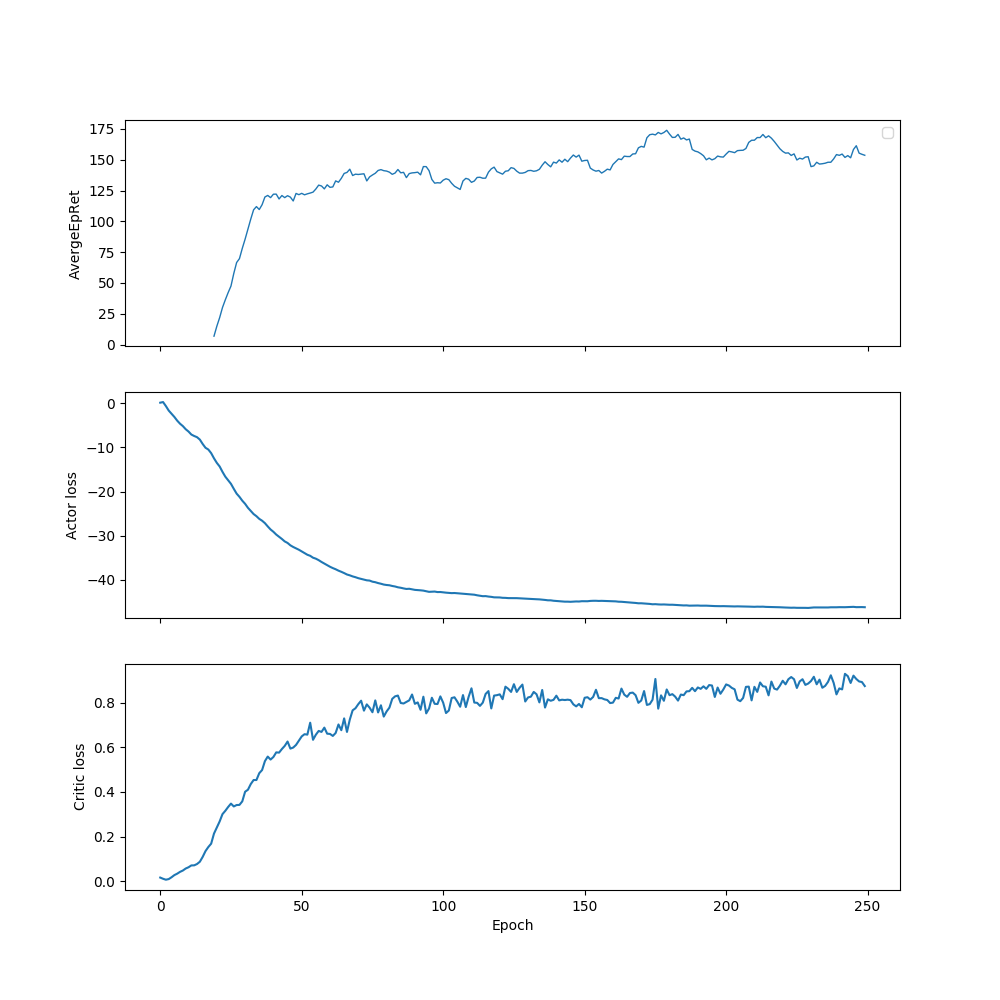

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


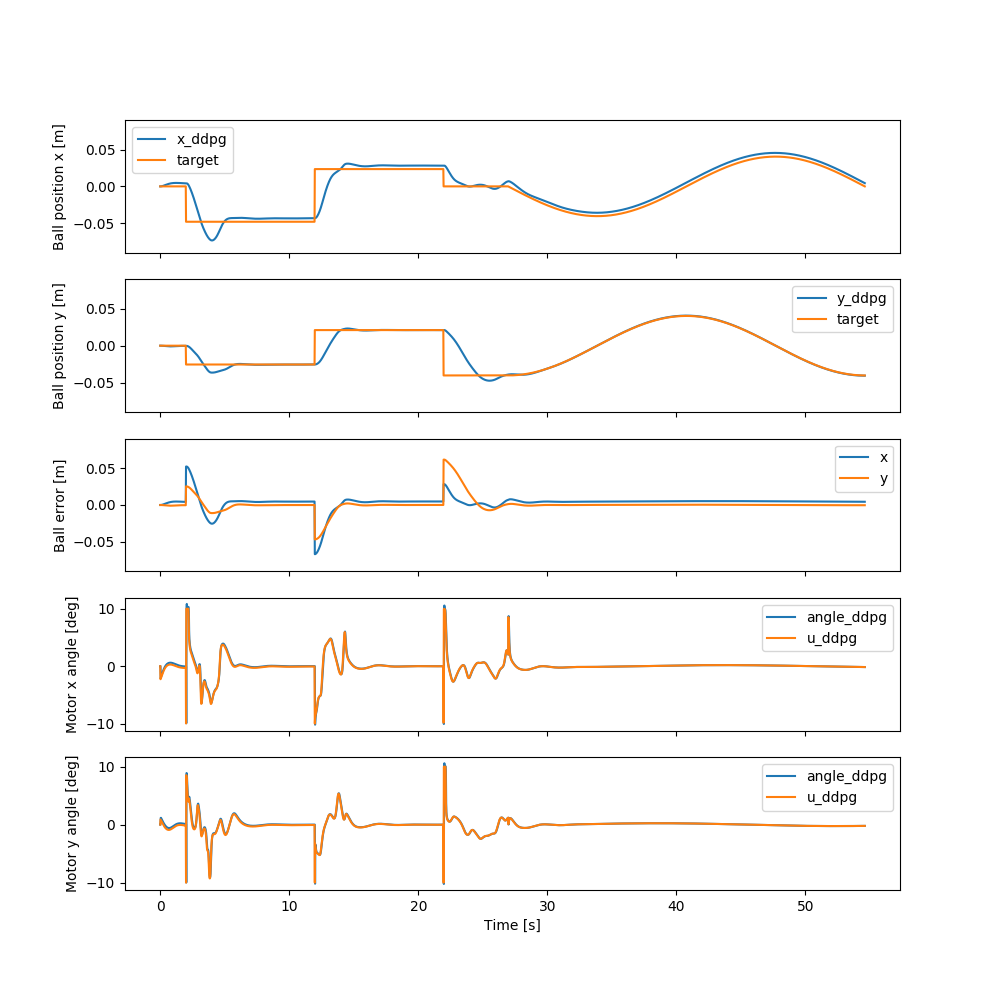

In [19]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_2/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd4603fab38>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_2",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_2/progress.txt' mode='w' encoding='U

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -52.4 |
|          StdEpRet |            2.49 |
|          MaxEpRet |           -49.1 |
|          MinEpRet |           -55.1 |
|  AverageTestEpRet |            54.6 |
|      StdTestEpRet |            29.8 |
|      MaxTestEpRet |             111 |
|      MinTestEpRet |            7.39 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.85 |
|          StdQVals |            3.32 |
|          MaxQVals |            12.9 |
|          MinQVals |           -2.31 |
|            LossPi |           -3.06 |
|             LossQ |          0.0507 |
|              Time |            92.2 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -17.7 |
|          StdEpRet |            26.6 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            90.8 |
|          StdEpRet |            25.5 |
|          MaxEpRet |             116 |
|          MinEpRet |            65.3 |
|  AverageTestEpRet |            60.4 |
|      StdTestEpRet |            71.2 |
|      MaxTestEpRet |             179 |
|      MinTestEpRet |           -76.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.35 |
|          StdQVals |            8.87 |
|          MaxQVals |              35 |
|          MinQVals |           -2.24 |
|            LossPi |           -9.61 |
|             LossQ |           0.265 |
|              Time |             233 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            65.2 |
|          StdEpRet |            68.1 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            75.2 |
|          StdEpRet |             107 |
|          MaxEpRet |             202 |
|          MinEpRet |           -60.4 |
|  AverageTestEpRet |            79.7 |
|      StdTestEpRet |              93 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |           -79.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            21.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            45.6 |
|          MinQVals |           -2.87 |
|            LossPi |           -21.9 |
|             LossQ |           0.595 |
|              Time |             379 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             139 |
|          StdEpRet |            75.3 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            62.9 |
|          StdEpRet |             107 |
|          MaxEpRet |             170 |
|          MinEpRet |           -44.3 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |              69 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -30.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            29.4 |
|          StdQVals |            14.7 |
|          MaxQVals |              53 |
|          MinQVals |           -3.48 |
|            LossPi |           -29.6 |
|             LossQ |           0.728 |
|              Time |             524 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             103 |
|          StdEpRet |            47.5 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            92.1 |
|          StdEpRet |             106 |
|          MaxEpRet |             173 |
|          MinEpRet |           -58.2 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |              68 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -64.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            34.6 |
|          StdQVals |            14.3 |
|          MaxQVals |            56.3 |
|          MinQVals |           -7.82 |
|            LossPi |           -34.8 |
|             LossQ |            0.82 |
|              Time |             674 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             145 |
|          StdEpRet |            23.7 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             103 |
|          StdEpRet |             131 |
|          MaxEpRet |             234 |
|          MinEpRet |           -28.2 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            66.7 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |             -42 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            38.4 |
|          StdQVals |            14.3 |
|          MaxQVals |            57.4 |
|          MinQVals |            2.13 |
|            LossPi |           -38.6 |
|             LossQ |           0.806 |
|              Time |             823 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            94.5 |
|          StdEpRet |              27 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            70.6 |
|          StdEpRet |             122 |
|          MaxEpRet |             177 |
|          MinEpRet |            -100 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            44.3 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |            64.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |              40 |
|          StdQVals |            14.7 |
|          MaxQVals |            59.2 |
|          MinQVals |           -1.95 |
|            LossPi |           -40.2 |
|             LossQ |           0.865 |
|              Time |             965 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             185 |
|          StdEpRet |            8.24 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            26.1 |
|          StdEpRet |            71.3 |
|          MaxEpRet |            97.4 |
|          MinEpRet |           -45.2 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            66.2 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -13.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            41.2 |
|          StdQVals |            15.2 |
|          MaxQVals |            59.9 |
|          MinQVals |            0.14 |
|            LossPi |           -41.4 |
|             LossQ |           0.996 |
|              Time |        1.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             124 |
|          StdEpRet |            71.7 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             144 |
|          StdEpRet |            65.7 |
|          MaxEpRet |             202 |
|          MinEpRet |            51.6 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            74.8 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -95.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |              42 |
|          StdQVals |              15 |
|          MaxQVals |            59.7 |
|          MinQVals |           -1.96 |
|            LossPi |           -42.1 |
|             LossQ |           0.951 |
|              Time |        1.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             124 |
|          StdEpRet |            64.2 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             213 |
|          StdEpRet |            26.2 |
|          MaxEpRet |             239 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |              67 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |           -23.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            43.1 |
|          StdQVals |            14.7 |
|          MaxQVals |            59.2 |
|          MinQVals |           0.336 |
|            LossPi |           -43.3 |
|             LossQ |           0.967 |
|              Time |        1.39e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             120 |
|          StdEpRet |            49.2 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             199 |
|          StdEpRet |            5.08 |
|          MaxEpRet |             206 |
|          MinEpRet |             194 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            51.6 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |            39.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            43.9 |
|          StdQVals |            14.3 |
|          MaxQVals |            59.9 |
|          MinQVals |            1.01 |
|            LossPi |           -44.1 |
|             LossQ |           0.844 |
|              Time |        1.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             180 |
|          StdEpRet |            26.1 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             143 |
|          StdEpRet |            17.7 |
|          MaxEpRet |             161 |
|          MinEpRet |             125 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |              81 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |           -98.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |              14 |
|          MaxQVals |            59.3 |
|          MinQVals |          -0.503 |
|            LossPi |           -44.7 |
|             LossQ |           0.897 |
|              Time |        1.69e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            89.2 |
|          StdEpRet |             118 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |              81 |
|          StdEpRet |            81.9 |
|          MaxEpRet |             168 |
|          MinEpRet |           -28.5 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            78.7 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |           -77.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            45.2 |
|          StdQVals |            13.9 |
|          MaxQVals |            60.2 |
|          MinQVals |          -0.934 |
|            LossPi |           -45.4 |
|             LossQ |           0.915 |
|              Time |        1.83e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             208 |
|          StdEpRet |            6.83 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             215 |
|          StdEpRet |            30.2 |
|          MaxEpRet |             245 |
|          MinEpRet |             184 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |            47.5 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |            57.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            13.5 |
|          MaxQVals |            60.3 |
|          MinQVals |          0.0818 |
|            LossPi |           -45.9 |
|             LossQ |           0.916 |
|              Time |        1.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             145 |
|          StdEpRet |            32.7 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             140 |
|          StdEpRet |            28.7 |
|          MaxEpRet |             180 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            47.5 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            28.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.6 |
|          MinQVals |           -1.69 |
|            LossPi |             -46 |
|             LossQ |           0.938 |
|              Time |        2.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             151 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             209 |
|          StdEpRet |            31.9 |
|          MaxEpRet |             241 |
|          MinEpRet |             177 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            28.7 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |             118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            13.3 |
|          MaxQVals |              59 |
|          MinQVals |           -1.58 |
|            LossPi |           -46.2 |
|             LossQ |             0.9 |
|              Time |        2.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             196 |
|          StdEpRet |             5.9 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             182 |
|          StdEpRet |            3.55 |
|          MaxEpRet |             187 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            27.7 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |             130 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            13.2 |
|          MaxQVals |            59.7 |
|          MinQVals |           -4.93 |
|            LossPi |           -46.3 |
|             LossQ |           0.936 |
|              Time |        2.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             202 |
|          StdEpRet |            22.3 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             169 |
|          StdEpRet |            25.1 |
|          MaxEpRet |             194 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            61.6 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -75.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            46.6 |
|          StdQVals |            13.3 |
|          MaxQVals |            60.2 |
|          MinQVals |           -4.71 |
|            LossPi |           -46.8 |
|             LossQ |           0.952 |
|              Time |        2.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             141 |
|          StdEpRet |            14.6 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            93.3 |
|          StdEpRet |             100 |
|          MaxEpRet |             170 |
|          MinEpRet |           -48.1 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            60.6 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -63.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |              47 |
|          StdQVals |              13 |
|          MaxQVals |            60.3 |
|          MinQVals |           -5.07 |
|            LossPi |           -47.1 |
|             LossQ |           0.964 |
|              Time |        2.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             168 |
|          StdEpRet |            55.5 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |            92.2 |
|          StdEpRet |             110 |
|          MaxEpRet |             203 |
|          MinEpRet |           -18.3 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            83.1 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -52.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            47.2 |
|          StdQVals |            12.7 |
|          MaxQVals |              60 |
|          MinQVals |           -11.8 |
|            LossPi |           -47.4 |
|             LossQ |           0.894 |
|              Time |        2.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             136 |
|          StdEpRet |            49.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |            78.4 |
|          StdEpRet |             114 |
|          MaxEpRet |             211 |
|          MinEpRet |           -67.9 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            69.7 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -33.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            12.9 |
|          MaxQVals |            59.2 |
|          MinQVals |             -11 |
|            LossPi |             -47 |
|             LossQ |           0.894 |
|              Time |           3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             143 |
|          StdEpRet |            3.76 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             176 |
|          StdEpRet |            9.74 |
|          MaxEpRet |             186 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            37.4 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            94.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            12.7 |
|          MaxQVals |            58.8 |
|          MinQVals |           -9.69 |
|            LossPi |             -47 |
|             LossQ |           0.944 |
|              Time |        3.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             134 |
|          StdEpRet |            49.7 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             173 |
|          StdEpRet |            20.4 |
|          MaxEpRet |             188 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            65.3 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -86.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            12.6 |
|          MaxQVals |            59.7 |
|          MinQVals |             -12 |
|            LossPi |             -47 |
|             LossQ |           0.879 |
|              Time |         3.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             155 |
|          StdEpRet |            51.5 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             192 |
|          StdEpRet |            14.5 |
|          MaxEpRet |             207 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            78.8 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |           -82.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              47 |
|          StdQVals |            12.5 |
|          MaxQVals |            58.6 |
|          MinQVals |           -10.3 |
|            LossPi |           -47.2 |
|             LossQ |           0.863 |
|              Time |        3.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             155 |
|          StdEpRet |             9.1 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             183 |
|          StdEpRet |              37 |
|          MaxEpRet |             235 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             134 |
|      StdTestEpRet |             111 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            -126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            47.2 |
|          StdQVals |            12.4 |
|          MaxQVals |            59.6 |
|          MinQVals |           -5.03 |
|            LossPi |           -47.3 |
|             LossQ |           0.944 |
|              Time |        3.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             131 |
|          StdEpRet |              99 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -3179327.6131701274


<IPython.core.display.Javascript object>


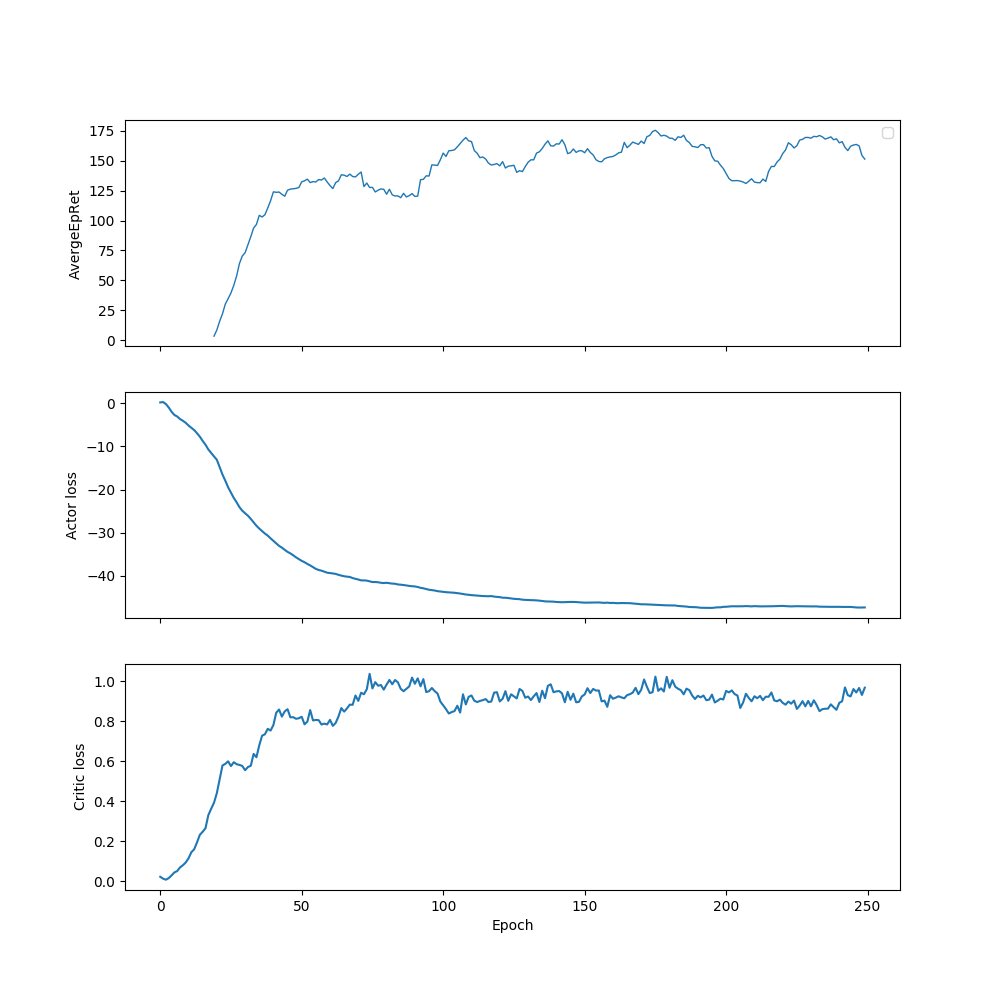

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


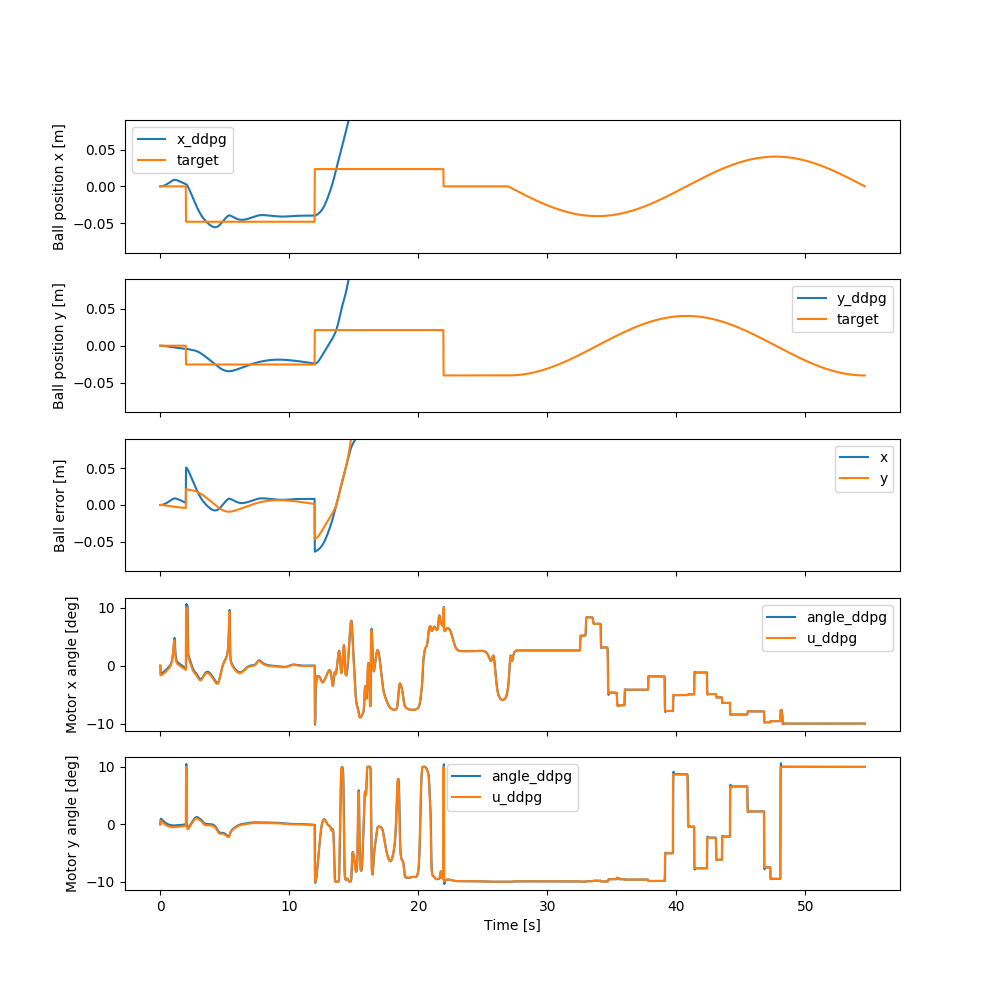

In [33]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid_2'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            400,
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd472b4b1d0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid/progress.txt' mode='w' encoding='UTF-8'>

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -19.5 |
|          StdEpRet |            28.4 |
|          MaxEpRet |            16.6 |
|          MinEpRet |           -52.9 |
|  AverageTestEpRet |            69.2 |
|      StdTestEpRet |            66.8 |
|      MaxTestEpRet |             191 |
|      MinTestEpRet |             -49 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.88 |
|          StdQVals |            3.29 |
|          MaxQVals |            13.7 |
|          MinQVals |           -2.43 |
|            LossPi |           -3.09 |
|             LossQ |          0.0354 |
|              Time |             156 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -30.3 |
|          StdEpRet |            3.35 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             195 |
|          StdEpRet |            66.3 |
|          MaxEpRet |             261 |
|          MinEpRet |             129 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            55.1 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |            28.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.08 |
|          StdQVals |            9.28 |
|          MaxQVals |              34 |
|          MinQVals |           -3.16 |
|            LossPi |           -9.31 |
|             LossQ |           0.205 |
|              Time |             402 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             129 |
|          StdEpRet |              30 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             172 |
|          StdEpRet |            8.28 |
|          MaxEpRet |             183 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            38.5 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |            64.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |              23 |
|          StdQVals |            15.3 |
|          MaxQVals |            44.9 |
|          MinQVals |           -3.43 |
|            LossPi |           -23.3 |
|             LossQ |           0.474 |
|              Time |             657 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             164 |
|          StdEpRet |            25.6 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             148 |
|          StdEpRet |            2.14 |
|          MaxEpRet |             150 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            47.9 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            28.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            31.8 |
|          StdQVals |            16.6 |
|          MaxQVals |            52.8 |
|          MinQVals |           -4.16 |
|            LossPi |             -32 |
|             LossQ |           0.642 |
|              Time |             917 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            86.1 |
|          StdEpRet |              18 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             138 |
|          StdEpRet |            37.6 |
|          MaxEpRet |             189 |
|          MinEpRet |             100 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            47.8 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |            45.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            37.2 |
|          StdQVals |            16.7 |
|          MaxQVals |            57.5 |
|          MinQVals |           -1.63 |
|            LossPi |           -37.4 |
|             LossQ |           0.788 |
|              Time |        1.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            88.1 |
|          StdEpRet |            76.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            74.1 |
|          StdEpRet |            85.9 |
|          MaxEpRet |             160 |
|          MinEpRet |           -11.9 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            76.4 |
|      MaxTestEpRet |             198 |
|      MinTestEpRet |           -38.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            40.2 |
|          StdQVals |            16.4 |
|          MaxQVals |            59.3 |
|          MinQVals |            -3.7 |
|            LossPi |           -40.4 |
|             LossQ |           0.835 |
|              Time |        1.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            18.8 |
|          StdEpRet |            41.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             109 |
|          StdEpRet |            45.4 |
|          MaxEpRet |             148 |
|          MinEpRet |              45 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            59.6 |
|      MaxTestEpRet |             202 |
|      MinTestEpRet |           -23.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            41.9 |
|          StdQVals |            15.7 |
|          MaxQVals |            60.5 |
|          MinQVals |          -0.717 |
|            LossPi |           -42.1 |
|             LossQ |           0.835 |
|              Time |        1.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             166 |
|          StdEpRet |            29.8 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             224 |
|          StdEpRet |            14.8 |
|          MaxEpRet |             238 |
|          MinEpRet |             209 |
|  AverageTestEpRet |             123 |
|      StdTestEpRet |            73.8 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -25.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            43.4 |
|          StdQVals |            14.7 |
|          MaxQVals |            60.4 |
|          MinQVals |           -2.41 |
|            LossPi |           -43.6 |
|             LossQ |           0.873 |
|              Time |        1.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             102 |
|          StdEpRet |            46.1 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             164 |
|          StdEpRet |            20.4 |
|          MaxEpRet |             184 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |              84 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |             -75 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            44.7 |
|          StdQVals |            14.3 |
|          MaxQVals |            60.5 |
|          MinQVals |          -0.537 |
|            LossPi |           -44.9 |
|             LossQ |            0.89 |
|              Time |        2.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            94.3 |
|          StdEpRet |             127 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             115 |
|          StdEpRet |            34.5 |
|          MaxEpRet |             150 |
|          MinEpRet |            80.6 |
|  AverageTestEpRet |             141 |
|      StdTestEpRet |            60.1 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |           -24.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            45.2 |
|          StdQVals |            13.8 |
|          MaxQVals |            59.9 |
|          MinQVals |          -0.804 |
|            LossPi |           -45.4 |
|             LossQ |           0.895 |
|              Time |        2.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            44.4 |
|          StdEpRet |            69.2 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             176 |
|          StdEpRet |            43.5 |
|          MaxEpRet |             215 |
|          MinEpRet |             115 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |            76.5 |
|      MaxTestEpRet |             211 |
|      MinTestEpRet |           -51.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            45.7 |
|          StdQVals |            13.3 |
|          MaxQVals |            59.9 |
|          MinQVals |           -2.44 |
|            LossPi |           -45.9 |
|             LossQ |           0.837 |
|              Time |         2.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             151 |
|          StdEpRet |            11.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             181 |
|          StdEpRet |            28.9 |
|          MaxEpRet |             210 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            52.2 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            4.65 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.2 |
|          MaxQVals |            60.7 |
|          MinQVals |            3.24 |
|            LossPi |           -45.8 |
|             LossQ |           0.837 |
|              Time |        3.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             125 |
|          StdEpRet |            75.5 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            8.14 |
|          StdEpRet |              90 |
|          MaxEpRet |             125 |
|          MinEpRet |           -93.2 |
|  AverageTestEpRet |             112 |
|      StdTestEpRet |            80.5 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |           -51.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.2 |
|          MaxQVals |            60.2 |
|          MinQVals |           0.187 |
|            LossPi |           -45.7 |
|             LossQ |           0.884 |
|              Time |        3.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             130 |
|          StdEpRet |            85.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             136 |
|          StdEpRet |            18.3 |
|          MaxEpRet |             154 |
|          MinEpRet |             118 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            50.1 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |              64 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.6 |
|          MinQVals |           -3.71 |
|            LossPi |           -46.2 |
|             LossQ |           0.823 |
|              Time |        3.83e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             129 |
|          StdEpRet |            61.7 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             166 |
|          StdEpRet |            30.7 |
|          MaxEpRet |             205 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             106 |
|      StdTestEpRet |            74.9 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -20.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.5 |
|          MinQVals |           -12.5 |
|            LossPi |           -46.1 |
|             LossQ |            0.86 |
|              Time |        4.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            71.7 |
|          StdEpRet |            78.8 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             158 |
|          StdEpRet |            12.6 |
|          MaxEpRet |             171 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            51.1 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            14.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.6 |
|          MinQVals |           -4.63 |
|            LossPi |           -46.1 |
|             LossQ |           0.909 |
|              Time |        4.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |              67 |
|          StdEpRet |             121 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             134 |
|          StdEpRet |            16.7 |
|          MaxEpRet |             147 |
|          MinEpRet |             111 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            64.2 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            5.96 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            13.2 |
|          MaxQVals |            59.3 |
|          MinQVals |           -9.08 |
|            LossPi |             -46 |
|             LossQ |           0.932 |
|              Time |        5.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             167 |
|          StdEpRet |            38.4 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             102 |
|          StdEpRet |            19.6 |
|          MaxEpRet |             122 |
|          MinEpRet |            82.9 |
|  AverageTestEpRet |             104 |
|      StdTestEpRet |            93.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -76.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            13.1 |
|          MaxQVals |            59.8 |
|          MinQVals |           -6.56 |
|            LossPi |           -46.4 |
|             LossQ |           0.899 |
|              Time |        5.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            58.5 |
|          StdEpRet |            82.7 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             153 |
|          StdEpRet |            27.9 |
|          MaxEpRet |             192 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |            75.9 |
|      MaxTestEpRet |             209 |
|      MinTestEpRet |           -67.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            46.3 |
|          StdQVals |            13.3 |
|          MaxQVals |            59.9 |
|          MinQVals |            -8.4 |
|            LossPi |           -46.4 |
|             LossQ |           0.933 |
|              Time |        5.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            10.1 |
|          StdEpRet |            25.1 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             173 |
|          StdEpRet |          0.0652 |
|          MaxEpRet |             173 |
|          MinEpRet |             173 |
|  AverageTestEpRet |            93.9 |
|      StdTestEpRet |            79.8 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -72.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            13.3 |
|          MaxQVals |              60 |
|          MinQVals |           -9.61 |
|            LossPi |           -46.2 |
|             LossQ |           0.862 |
|              Time |        6.21e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             102 |
|          StdEpRet |             104 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             158 |
|          StdEpRet |            9.41 |
|          MaxEpRet |             169 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             130 |
|      StdTestEpRet |            77.4 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |           -22.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.9 |
|          MinQVals |           -13.1 |
|            LossPi |           -46.2 |
|             LossQ |           0.949 |
|              Time |        6.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             153 |
|          StdEpRet |            27.8 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             133 |
|          StdEpRet |             117 |
|          MaxEpRet |             250 |
|          MinEpRet |            16.1 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            45.8 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |              60 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            13.3 |
|          MaxQVals |            59.9 |
|          MinQVals |             -11 |
|            LossPi |           -46.4 |
|             LossQ |           0.936 |
|              Time |        6.84e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             126 |
|          StdEpRet |            36.5 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             122 |
|          StdEpRet |            56.9 |
|          MaxEpRet |             195 |
|          MinEpRet |            56.1 |
|  AverageTestEpRet |             100 |
|      StdTestEpRet |            85.3 |
|      MaxTestEpRet |             204 |
|      MinTestEpRet |           -82.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            13.4 |
|          MaxQVals |            59.9 |
|          MinQVals |           -6.27 |
|            LossPi |           -46.5 |
|             LossQ |               1 |
|              Time |        7.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             140 |
|          StdEpRet |            22.1 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            56.4 |
|          StdEpRet |            83.9 |
|          MaxEpRet |             140 |
|          MinEpRet |           -27.4 |
|  AverageTestEpRet |             162 |
|      StdTestEpRet |              61 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |             -23 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.3 |
|          MaxQVals |            59.5 |
|          MinQVals |           -13.4 |
|            LossPi |           -46.1 |
|             LossQ |           0.942 |
|              Time |        7.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             138 |
|          StdEpRet |              70 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             144 |
|          StdEpRet |            8.62 |
|          MaxEpRet |             154 |
|          MinEpRet |             133 |
|  AverageTestEpRet |             186 |
|      StdTestEpRet |            29.1 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |             143 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            13.2 |
|          MaxQVals |              59 |
|          MinQVals |           -13.2 |
|            LossPi |             -46 |
|             LossQ |           0.939 |
|              Time |         7.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             187 |
|          StdEpRet |            8.62 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00025311981456157905


<IPython.core.display.Javascript object>


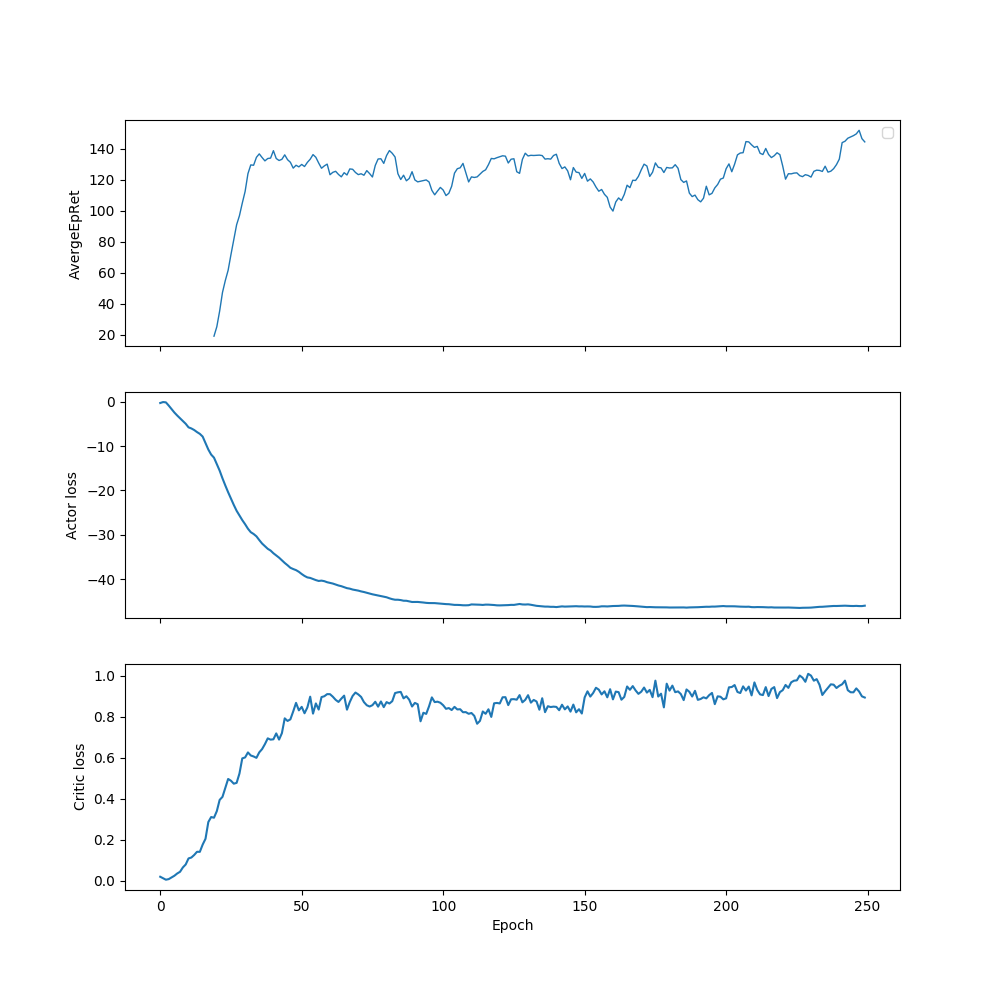

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


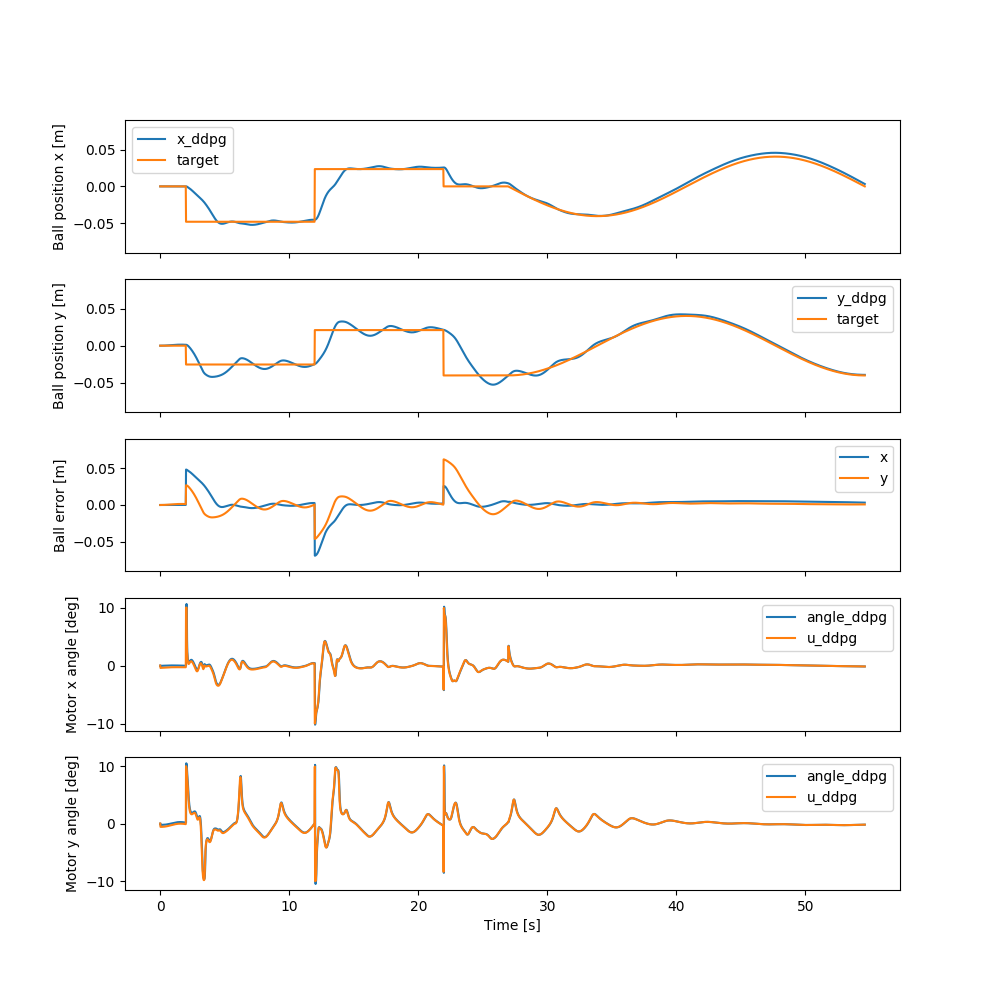

In [20]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid_2/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            400,
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd450438be0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid_2",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[400,200]_sigmoid_2/progress.txt' mode='w' encoding='U

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            12.3 |
|          StdEpRet |            46.3 |
|          MaxEpRet |            60.6 |
|          MinEpRet |           -50.1 |
|  AverageTestEpRet |            10.2 |
|      StdTestEpRet |            54.8 |
|      MaxTestEpRet |             139 |
|      MinTestEpRet |           -58.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.02 |
|          StdQVals |            3.83 |
|          MaxQVals |            15.4 |
|          MinQVals |           -2.04 |
|            LossPi |           -3.24 |
|             LossQ |          0.0511 |
|              Time |             152 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -16.6 |
|          StdEpRet |            5.84 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            58.7 |
|          StdEpRet |            63.6 |
|          MaxEpRet |             122 |
|          MinEpRet |           -4.95 |
|  AverageTestEpRet |            65.3 |
|      StdTestEpRet |            74.2 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           -78.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.69 |
|          StdQVals |            9.52 |
|          MaxQVals |            34.2 |
|          MinQVals |           -3.24 |
|            LossPi |           -9.95 |
|             LossQ |            0.21 |
|              Time |             401 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            45.4 |
|          StdEpRet |            51.9 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            20.2 |
|          StdEpRet |            16.8 |
|          MaxEpRet |            43.9 |
|          MinEpRet |            7.89 |
|  AverageTestEpRet |             119 |
|      StdTestEpRet |            67.2 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -20.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            17.8 |
|          StdQVals |            15.1 |
|          MaxQVals |            46.2 |
|          MinQVals |           -7.79 |
|            LossPi |           -18.1 |
|             LossQ |           0.511 |
|              Time |             655 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             150 |
|          StdEpRet |            50.3 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            99.1 |
|          StdEpRet |            12.7 |
|          MaxEpRet |             112 |
|          MinEpRet |            86.5 |
|  AverageTestEpRet |              88 |
|      StdTestEpRet |            59.3 |
|      MaxTestEpRet |             204 |
|      MinTestEpRet |            1.09 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            24.7 |
|          StdQVals |            17.5 |
|          MaxQVals |            53.3 |
|          MinQVals |           -5.99 |
|            LossPi |             -25 |
|             LossQ |           0.623 |
|              Time |             918 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             113 |
|          StdEpRet |            38.7 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             150 |
|          StdEpRet |            10.1 |
|          MaxEpRet |             160 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            59.5 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |              27 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            31.6 |
|          StdQVals |            18.2 |
|          MaxQVals |            57.8 |
|          MinQVals |           -5.38 |
|            LossPi |           -31.9 |
|             LossQ |           0.734 |
|              Time |        1.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             123 |
|          StdEpRet |            63.6 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             175 |
|          StdEpRet |            30.3 |
|          MaxEpRet |             205 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             121 |
|      StdTestEpRet |            47.6 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            50.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            36.7 |
|          StdQVals |            17.1 |
|          MaxQVals |            58.7 |
|          MinQVals |           -6.49 |
|            LossPi |             -37 |
|             LossQ |           0.617 |
|              Time |        1.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             179 |
|          StdEpRet |              40 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |              93 |
|          StdEpRet |            87.9 |
|          MaxEpRet |             174 |
|          MinEpRet |           -29.2 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            81.9 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |             -57 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            40.6 |
|          StdQVals |            16.4 |
|          MaxQVals |              60 |
|          MinQVals |           -3.18 |
|            LossPi |           -40.8 |
|             LossQ |           0.697 |
|              Time |        1.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            90.5 |
|          StdEpRet |             100 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             118 |
|          StdEpRet |             148 |
|          MaxEpRet |             266 |
|          MinEpRet |           -30.4 |
|  AverageTestEpRet |              75 |
|      StdTestEpRet |             106 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -72.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            42.2 |
|          StdQVals |            16.2 |
|          MaxQVals |            60.5 |
|          MinQVals |           -3.72 |
|            LossPi |           -42.4 |
|             LossQ |           0.839 |
|              Time |        1.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             101 |
|          StdEpRet |            89.9 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             168 |
|          StdEpRet |            42.1 |
|          MaxEpRet |             224 |
|          MinEpRet |             122 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            59.8 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |           -48.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            43.4 |
|          StdQVals |            15.7 |
|          MaxQVals |            60.7 |
|          MinQVals |           -5.37 |
|            LossPi |           -43.6 |
|             LossQ |           0.814 |
|              Time |        2.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             166 |
|          StdEpRet |            19.7 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             102 |
|          StdEpRet |            2.99 |
|          MaxEpRet |             105 |
|          MinEpRet |            98.8 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |              42 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            59.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            44.3 |
|          StdQVals |            15.5 |
|          MaxQVals |            60.4 |
|          MinQVals |           -5.99 |
|            LossPi |           -44.5 |
|             LossQ |           0.802 |
|              Time |        2.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             125 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             163 |
|          StdEpRet |            38.2 |
|          MaxEpRet |             209 |
|          MinEpRet |             115 |
|  AverageTestEpRet |             104 |
|      StdTestEpRet |             101 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -90.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            44.2 |
|          StdQVals |            15.1 |
|          MaxQVals |            59.7 |
|          MinQVals |           -7.71 |
|            LossPi |           -44.4 |
|             LossQ |           0.762 |
|              Time |        2.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             109 |
|          StdEpRet |             109 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             195 |
|          StdEpRet |            2.52 |
|          MaxEpRet |             197 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            78.9 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -62.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            44.8 |
|          StdQVals |            14.7 |
|          MaxQVals |              60 |
|          MinQVals |           -6.49 |
|            LossPi |             -45 |
|             LossQ |           0.837 |
|              Time |        3.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             155 |
|          StdEpRet |              40 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             172 |
|          StdEpRet |            21.7 |
|          MaxEpRet |             200 |
|          MinEpRet |             148 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            78.6 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |            -110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |              45 |
|          StdQVals |            14.1 |
|          MaxQVals |            59.7 |
|          MinQVals |           -2.92 |
|            LossPi |           -45.2 |
|             LossQ |           0.789 |
|              Time |        3.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             185 |
|          StdEpRet |            19.4 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |           -5.87 |
|          StdEpRet |            36.1 |
|          MaxEpRet |            30.3 |
|          MinEpRet |             -42 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            48.1 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |            27.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            59.5 |
|          MinQVals |           -4.77 |
|            LossPi |           -45.8 |
|             LossQ |            0.77 |
|              Time |        3.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            50.9 |
|          StdEpRet |            69.5 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             105 |
|          StdEpRet |              26 |
|          MaxEpRet |             138 |
|          MinEpRet |              74 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |            82.9 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |            -116 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            58.5 |
|          MinQVals |           -13.3 |
|            LossPi |           -45.8 |
|             LossQ |           0.758 |
|              Time |        3.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            83.6 |
|          StdEpRet |            95.2 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             147 |
|          StdEpRet |            7.56 |
|          MaxEpRet |             155 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            70.6 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -8.28 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.5 |
|          MaxQVals |            59.1 |
|          MinQVals |           -6.56 |
|            LossPi |           -45.8 |
|             LossQ |             0.8 |
|              Time |        4.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             211 |
|          StdEpRet |            32.4 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            79.2 |
|          StdEpRet |            55.9 |
|          MaxEpRet |             133 |
|          MinEpRet |            2.13 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            60.8 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -14.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            45.5 |
|          StdQVals |            13.3 |
|          MaxQVals |            59.1 |
|          MinQVals |           -7.44 |
|            LossPi |           -45.7 |
|             LossQ |           0.763 |
|              Time |        4.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             138 |
|          StdEpRet |            20.7 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             130 |
|          StdEpRet |            18.8 |
|          MaxEpRet |             149 |
|          MinEpRet |             111 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            52.9 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |           -14.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            45.2 |
|          StdQVals |            13.4 |
|          MaxQVals |            58.8 |
|          MinQVals |            -4.8 |
|            LossPi |           -45.3 |
|             LossQ |           0.731 |
|              Time |        4.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             133 |
|          StdEpRet |            26.6 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            70.8 |
|          StdEpRet |             137 |
|          MaxEpRet |             197 |
|          MinEpRet |            -120 |
|  AverageTestEpRet |             166 |
|      StdTestEpRet |            53.5 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |           -1.51 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            45.4 |
|          StdQVals |            13.3 |
|          MaxQVals |            58.7 |
|          MinQVals |           -12.2 |
|            LossPi |           -45.6 |
|             LossQ |           0.725 |
|              Time |        4.99e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            97.6 |
|          StdEpRet |            89.2 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             147 |
|          StdEpRet |            22.5 |
|          MaxEpRet |             169 |
|          MinEpRet |             124 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            65.8 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -35.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            12.7 |
|          MaxQVals |            58.3 |
|          MinQVals |           -9.49 |
|            LossPi |             -46 |
|             LossQ |           0.792 |
|              Time |        5.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |            61.9 |
|          StdEpRet |            99.1 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             159 |
|          StdEpRet |            52.3 |
|          MaxEpRet |             227 |
|          MinEpRet |             101 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            51.8 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            4.05 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |              46 |
|          StdQVals |            12.7 |
|          MaxQVals |            58.1 |
|          MinQVals |           -3.89 |
|            LossPi |           -46.1 |
|             LossQ |           0.835 |
|              Time |        5.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             130 |
|          StdEpRet |            90.9 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             161 |
|          StdEpRet |            9.05 |
|          MaxEpRet |             170 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            27.5 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             137 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            12.7 |
|          MaxQVals |            58.5 |
|          MinQVals |           -6.41 |
|            LossPi |           -46.3 |
|             LossQ |           0.778 |
|              Time |        5.83e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             119 |
|          StdEpRet |            45.2 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |            77.9 |
|          StdEpRet |             112 |
|          MaxEpRet |             196 |
|          MinEpRet |           -71.9 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |            65.4 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |            4.31 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            12.8 |
|          MaxQVals |            58.3 |
|          MinQVals |           -12.7 |
|            LossPi |           -46.3 |
|             LossQ |            0.82 |
|              Time |        6.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             188 |
|          StdEpRet |            19.9 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             180 |
|          StdEpRet |            4.02 |
|          MaxEpRet |             184 |
|          MinEpRet |             176 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |             107 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |           -76.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            12.8 |
|          MaxQVals |            58.3 |
|          MinQVals |           -13.5 |
|            LossPi |           -46.3 |
|             LossQ |           0.823 |
|              Time |         6.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             160 |
|          StdEpRet |            14.4 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             201 |
|          StdEpRet |            29.4 |
|          MaxEpRet |             223 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |             108 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            -115 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.1 |
|          MaxQVals |            58.8 |
|          MinQVals |           -17.2 |
|            LossPi |           -46.2 |
|             LossQ |           0.863 |
|              Time |        6.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            96.4 |
|          StdEpRet |            46.9 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00031934904074245343


<IPython.core.display.Javascript object>


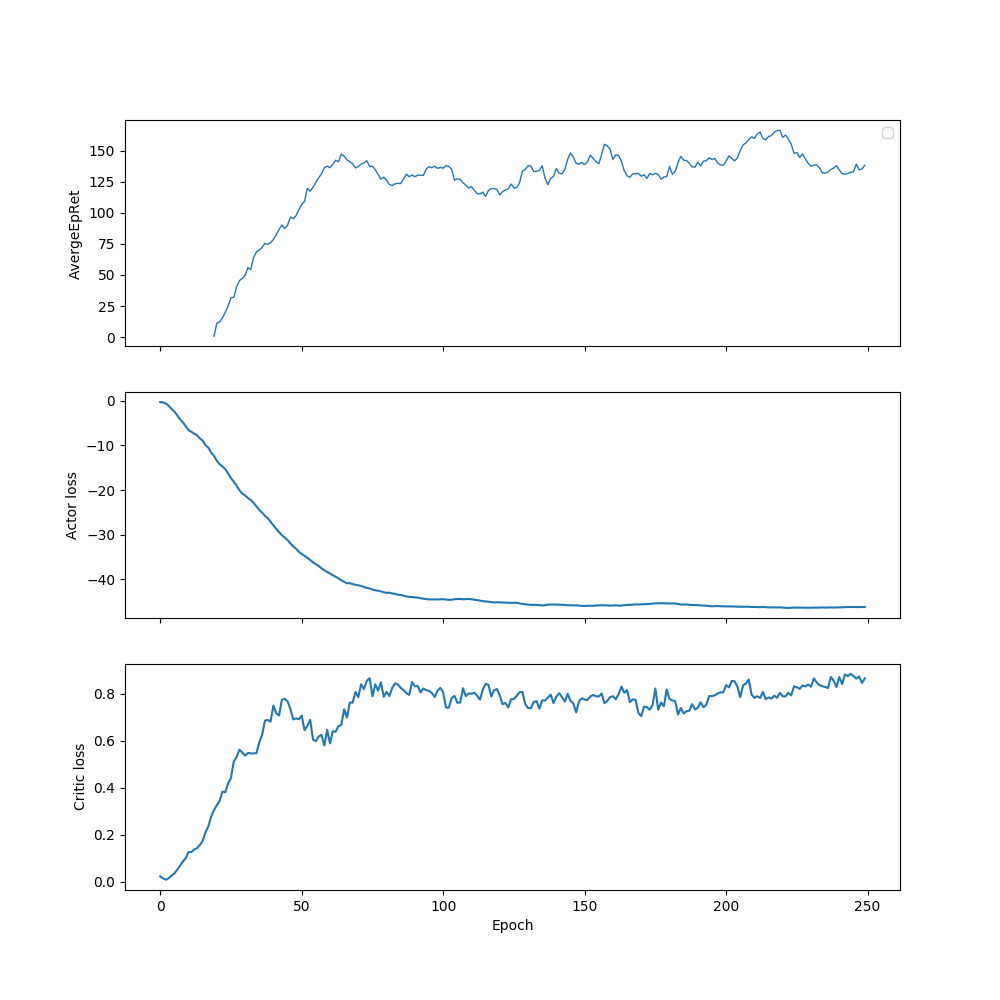

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


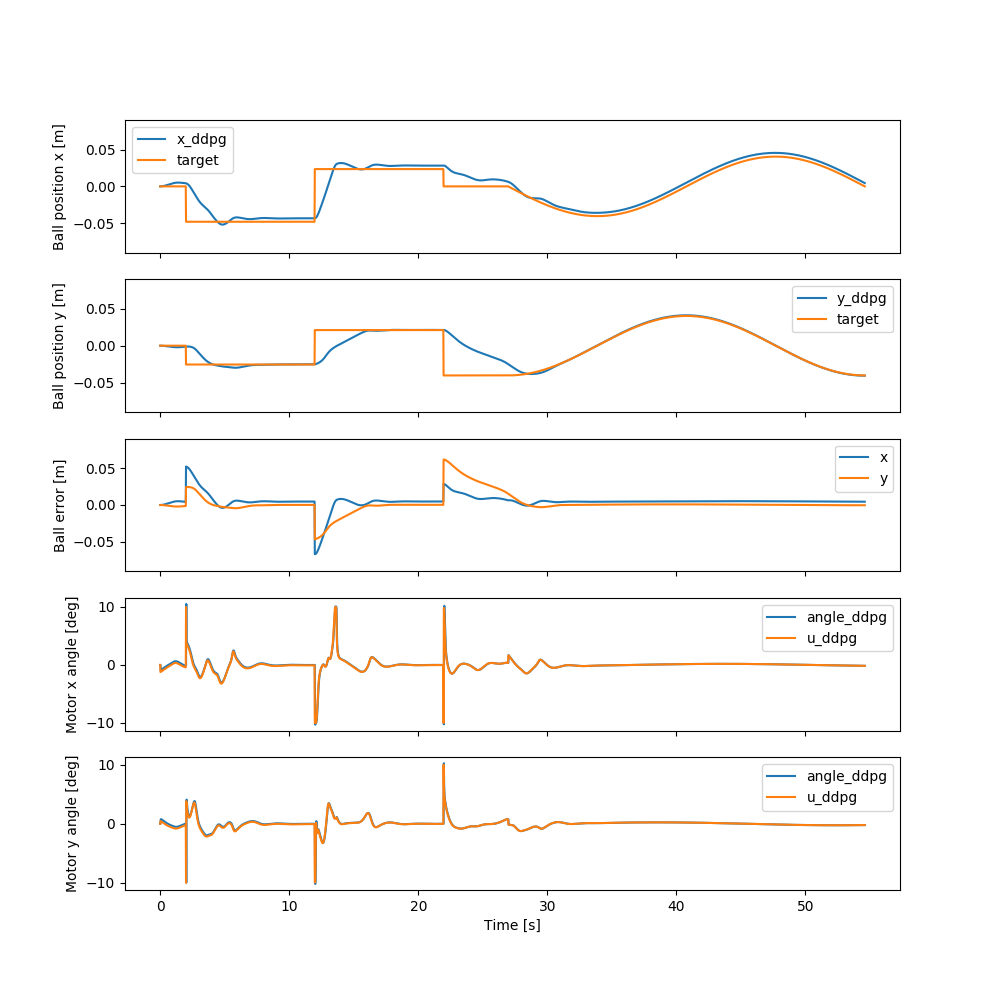

In [34]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid_2'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd472b4b518>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid/progress.txt' mode=

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |              24 |
|          StdEpRet |            36.7 |
|          MaxEpRet |            74.2 |
|          MinEpRet |           -12.6 |
|  AverageTestEpRet |            93.8 |
|      StdTestEpRet |            30.8 |
|      MaxTestEpRet |             159 |
|      MinTestEpRet |            50.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.67 |
|          StdQVals |            3.01 |
|          MaxQVals |             8.6 |
|          MinQVals |           -3.41 |
|            LossPi |           -2.87 |
|             LossQ |          0.0276 |
|              Time |            76.9 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -23.4 |
|          StdEpRet |            24.9 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            76.3 |
|          StdEpRet |            8.57 |
|          MaxEpRet |            84.9 |
|          MinEpRet |            67.7 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |              53 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            34.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            8.76 |
|          StdQVals |            7.16 |
|          MaxQVals |            21.6 |
|          MinQVals |           -5.98 |
|            LossPi |           -8.95 |
|             LossQ |           0.122 |
|              Time |             188 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             154 |
|          StdEpRet |            43.5 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             155 |
|          StdEpRet |            95.2 |
|          MaxEpRet |             260 |
|          MinEpRet |            29.5 |
|  AverageTestEpRet |             131 |
|      StdTestEpRet |            73.7 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |           -7.99 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            17.4 |
|          StdQVals |            11.5 |
|          MaxQVals |            33.5 |
|          MinQVals |           -8.27 |
|            LossPi |           -17.6 |
|             LossQ |            0.35 |
|              Time |             310 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             160 |
|          StdEpRet |            60.4 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             118 |
|          StdEpRet |            2.77 |
|          MaxEpRet |             120 |
|          MinEpRet |             115 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            43.2 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |              62 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            25.2 |
|          StdQVals |            13.5 |
|          MaxQVals |            41.1 |
|          MinQVals |           -6.65 |
|            LossPi |           -25.3 |
|             LossQ |           0.566 |
|              Time |             429 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             163 |
|          StdEpRet |            22.8 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             155 |
|          StdEpRet |            19.3 |
|          MaxEpRet |             178 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            50.6 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            21.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |              31 |
|          StdQVals |            14.3 |
|          MaxQVals |            45.8 |
|          MinQVals |           -3.57 |
|            LossPi |           -31.1 |
|             LossQ |           0.653 |
|              Time |             548 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |              89 |
|          StdEpRet |            84.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             156 |
|          StdEpRet |            38.6 |
|          MaxEpRet |             195 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            50.2 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            32.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            35.2 |
|          StdQVals |            14.6 |
|          MaxQVals |            49.4 |
|          MinQVals |           -6.57 |
|            LossPi |           -35.4 |
|             LossQ |            0.63 |
|              Time |             663 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             150 |
|          StdEpRet |            25.2 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             120 |
|          StdEpRet |            60.2 |
|          MaxEpRet |             195 |
|          MinEpRet |            48.1 |
|  AverageTestEpRet |             127 |
|      StdTestEpRet |            58.1 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -29.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            38.3 |
|          StdQVals |              15 |
|          MaxQVals |            52.4 |
|          MinQVals |           -7.91 |
|            LossPi |           -38.5 |
|             LossQ |           0.699 |
|              Time |             785 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             165 |
|          StdEpRet |            24.3 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             168 |
|          StdEpRet |            8.08 |
|          MaxEpRet |             176 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            80.6 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |             -64 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |              41 |
|          StdQVals |            14.9 |
|          MaxQVals |            54.2 |
|          MinQVals |           -12.2 |
|            LossPi |           -41.2 |
|             LossQ |            0.76 |
|              Time |             902 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            80.2 |
|          StdEpRet |             102 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             156 |
|          StdEpRet |            6.41 |
|          MaxEpRet |             162 |
|          MinEpRet |             147 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |              86 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |           -64.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            42.2 |
|          StdQVals |            14.9 |
|          MaxQVals |            55.4 |
|          MinQVals |           -9.77 |
|            LossPi |           -42.3 |
|             LossQ |           0.812 |
|              Time |        1.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            86.5 |
|          StdEpRet |            81.6 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             161 |
|          StdEpRet |            10.8 |
|          MaxEpRet |             172 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            81.3 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |           -87.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            43.2 |
|          StdQVals |            13.9 |
|          MaxQVals |            55.5 |
|          MinQVals |           -11.8 |
|            LossPi |           -43.4 |
|             LossQ |             0.9 |
|              Time |        1.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            90.3 |
|          StdEpRet |              89 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             134 |
|          StdEpRet |            86.2 |
|          MaxEpRet |             198 |
|          MinEpRet |            11.8 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            57.6 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |           -2.34 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |              44 |
|          StdQVals |            13.3 |
|          MaxQVals |            55.8 |
|          MinQVals |           -7.62 |
|            LossPi |           -44.2 |
|             LossQ |           0.798 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             139 |
|          StdEpRet |            45.8 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             159 |
|          StdEpRet |            2.23 |
|          MaxEpRet |             161 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            67.2 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |           -73.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            44.2 |
|          StdQVals |            12.7 |
|          MaxQVals |            56.1 |
|          MinQVals |           -4.81 |
|            LossPi |           -44.4 |
|             LossQ |           0.859 |
|              Time |        1.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             154 |
|          StdEpRet |            33.6 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             146 |
|          StdEpRet |            9.42 |
|          MaxEpRet |             160 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            50.9 |
|      MaxTestEpRet |             208 |
|      MinTestEpRet |           -36.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            44.2 |
|          StdQVals |            12.9 |
|          MaxQVals |            56.9 |
|          MinQVals |           -10.7 |
|            LossPi |           -44.4 |
|             LossQ |           0.826 |
|              Time |         1.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             161 |
|          StdEpRet |            35.7 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             227 |
|          StdEpRet |            26.1 |
|          MaxEpRet |             253 |
|          MinEpRet |             201 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |            78.3 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |           -72.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              45 |
|          StdQVals |            13.2 |
|          MaxQVals |            57.4 |
|          MinQVals |           -12.7 |
|            LossPi |           -45.1 |
|             LossQ |           0.888 |
|              Time |        1.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             105 |
|          StdEpRet |             128 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             196 |
|          StdEpRet |            27.3 |
|          MaxEpRet |             224 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            66.7 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |           -57.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            45.7 |
|          StdQVals |              13 |
|          MaxQVals |            57.7 |
|          MinQVals |           -11.5 |
|            LossPi |           -45.9 |
|             LossQ |           0.951 |
|              Time |        1.77e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            79.9 |
|          StdEpRet |            59.9 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             174 |
|          StdEpRet |            6.82 |
|          MaxEpRet |             181 |
|          MinEpRet |             168 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |            64.7 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |           -9.06 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            45.7 |
|          StdQVals |            13.2 |
|          MaxQVals |            57.7 |
|          MinQVals |           -13.9 |
|            LossPi |           -45.8 |
|             LossQ |            1.02 |
|              Time |        1.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |            47.8 |
|          StdEpRet |            99.1 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             157 |
|          StdEpRet |            11.3 |
|          MaxEpRet |             170 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            78.4 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            -123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            13.2 |
|          MaxQVals |            58.1 |
|          MinQVals |           -16.6 |
|            LossPi |           -46.1 |
|             LossQ |            1.08 |
|              Time |        2.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             149 |
|          StdEpRet |            21.9 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             153 |
|          StdEpRet |            41.5 |
|          MaxEpRet |             194 |
|          MinEpRet |             111 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            78.3 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |           -48.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            13.4 |
|          MaxQVals |            58.1 |
|          MinQVals |           -20.1 |
|            LossPi |             -46 |
|             LossQ |            1.06 |
|              Time |        2.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |              72 |
|          StdEpRet |            91.1 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             181 |
|          StdEpRet |            17.3 |
|          MaxEpRet |             203 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             183 |
|      StdTestEpRet |            47.9 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |            62.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.4 |
|          MaxQVals |            58.4 |
|          MinQVals |           -20.4 |
|            LossPi |           -46.1 |
|             LossQ |            1.08 |
|              Time |        2.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             168 |
|          StdEpRet |            35.8 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             164 |
|          StdEpRet |            72.9 |
|          MaxEpRet |             237 |
|          MinEpRet |              91 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            37.9 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |              87 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            13.3 |
|          MaxQVals |            58.5 |
|          MinQVals |             -22 |
|            LossPi |           -46.3 |
|             LossQ |            1.07 |
|              Time |        2.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             201 |
|          StdEpRet |            26.1 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             165 |
|          StdEpRet |            27.1 |
|          MaxEpRet |             202 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            44.9 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            13.4 |
|          MaxQVals |            58.3 |
|          MinQVals |           -23.3 |
|            LossPi |           -46.5 |
|             LossQ |            1.08 |
|              Time |        2.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             210 |
|          StdEpRet |            41.1 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             187 |
|          StdEpRet |            8.81 |
|          MaxEpRet |             196 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             207 |
|      StdTestEpRet |            34.2 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            46.5 |
|          StdQVals |            13.6 |
|          MaxQVals |            58.4 |
|          MinQVals |           -23.8 |
|            LossPi |           -46.6 |
|             LossQ |            1.12 |
|              Time |        3.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             149 |
|          StdEpRet |             9.8 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             158 |
|          StdEpRet |            26.2 |
|          MaxEpRet |             194 |
|          MinEpRet |             132 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            65.8 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |           -28.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.7 |
|          StdQVals |            13.6 |
|          MaxQVals |            58.3 |
|          MinQVals |           -24.6 |
|            LossPi |           -46.8 |
|             LossQ |            1.07 |
|              Time |        3.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             202 |
|          StdEpRet |            25.6 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             204 |
|          StdEpRet |            20.2 |
|          MaxEpRet |             224 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |            71.8 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |           -82.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              47 |
|          StdQVals |            13.5 |
|          MaxQVals |            58.4 |
|          MinQVals |           -25.3 |
|            LossPi |           -47.1 |
|             LossQ |            1.02 |
|              Time |        3.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             192 |
|          StdEpRet |            13.2 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             171 |
|          StdEpRet |            29.5 |
|          MaxEpRet |             209 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            33.9 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            85.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            47.3 |
|          StdQVals |            13.2 |
|          MaxQVals |            58.5 |
|          MinQVals |           -26.9 |
|            LossPi |           -47.4 |
|             LossQ |            1.04 |
|              Time |        3.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             175 |
|          StdEpRet |            37.2 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0002003491308249144


<IPython.core.display.Javascript object>


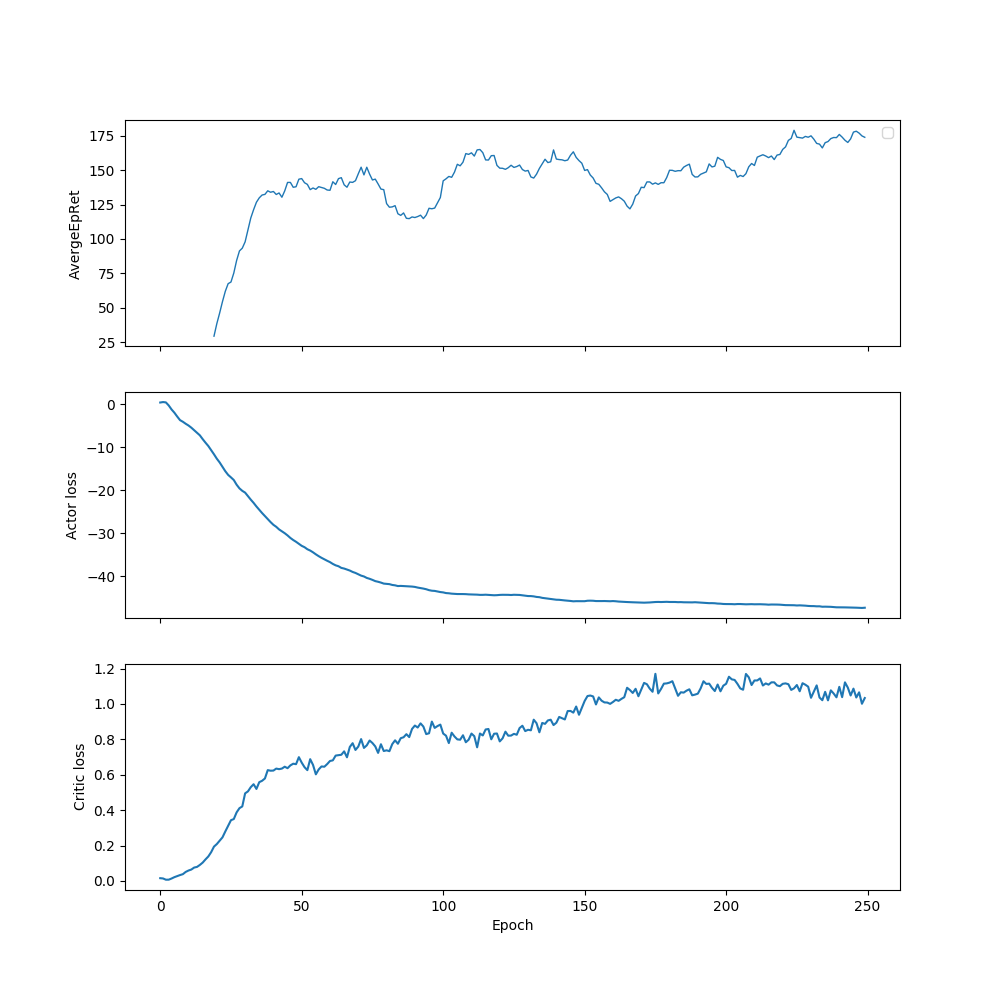

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


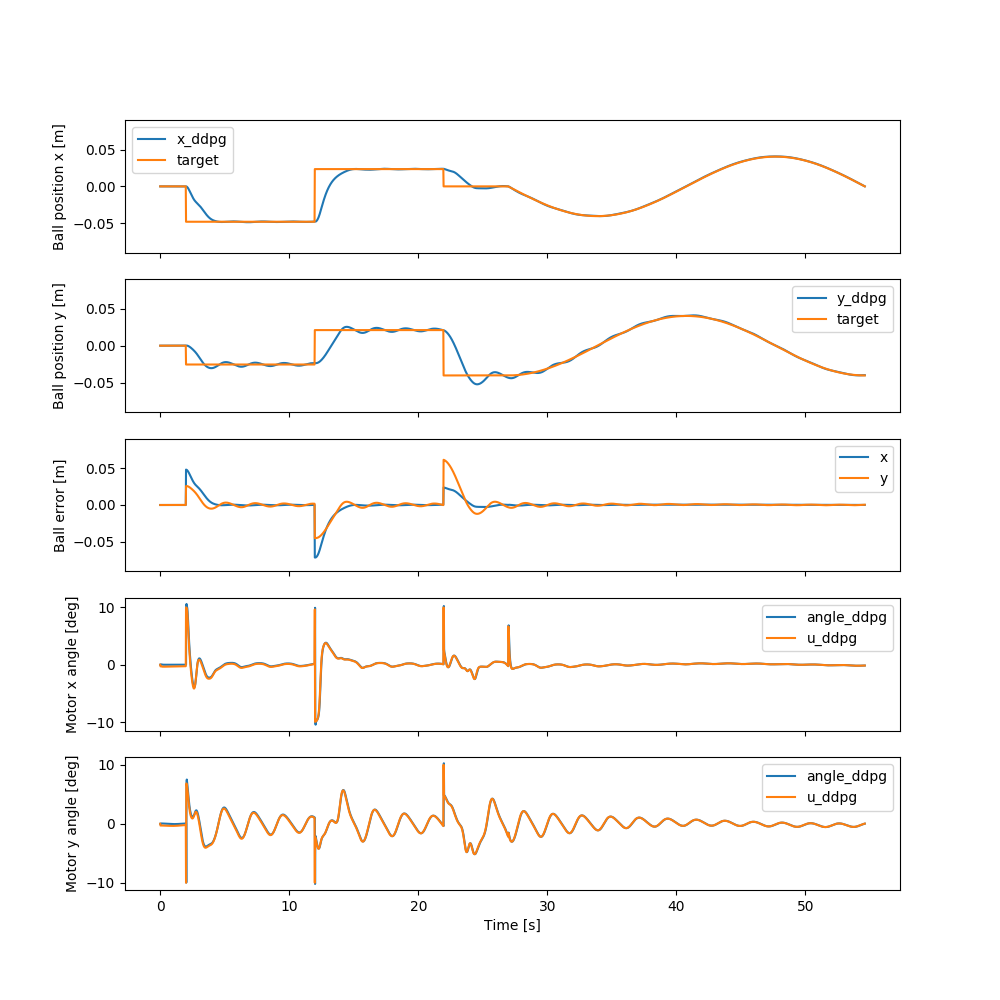

In [21]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_2/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd46038c6a0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_2",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_2/progress.txt'

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |             -27 |
|          StdEpRet |            20.8 |
|          MaxEpRet |           0.381 |
|          MinEpRet |           -50.1 |
|  AverageTestEpRet |            61.1 |
|      StdTestEpRet |              18 |
|      MaxTestEpRet |              89 |
|      MinTestEpRet |            26.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            1.92 |
|          StdQVals |            3.49 |
|          MaxQVals |            11.5 |
|          MinQVals |           -3.89 |
|            LossPi |           -2.15 |
|             LossQ |          0.0583 |
|              Time |            74.1 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -7.96 |
|          StdEpRet |              38 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |           -11.9 |
|          StdEpRet |            12.2 |
|          MaxEpRet |           0.233 |
|          MinEpRet |           -24.1 |
|  AverageTestEpRet |            57.5 |
|      StdTestEpRet |            56.3 |
|      MaxTestEpRet |             168 |
|      MinTestEpRet |           -32.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            7.62 |
|          StdQVals |            7.65 |
|          MaxQVals |            24.7 |
|          MinQVals |           -6.41 |
|            LossPi |           -7.82 |
|             LossQ |           0.161 |
|              Time |             188 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            65.4 |
|          StdEpRet |            56.4 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            74.8 |
|          StdEpRet |            72.8 |
|          MaxEpRet |             171 |
|          MinEpRet |           -4.52 |
|  AverageTestEpRet |              82 |
|      StdTestEpRet |            39.9 |
|      MaxTestEpRet |             163 |
|      MinTestEpRet |            17.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            14.6 |
|          StdQVals |            11.1 |
|          MaxQVals |              33 |
|          MinQVals |           -6.02 |
|            LossPi |           -14.8 |
|             LossQ |           0.334 |
|              Time |             307 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            69.7 |
|          StdEpRet |            3.23 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             131 |
|          StdEpRet |            34.2 |
|          MaxEpRet |             165 |
|          MinEpRet |            96.7 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            47.1 |
|      MaxTestEpRet |             209 |
|      MinTestEpRet |            14.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            20.9 |
|          StdQVals |            12.8 |
|          MaxQVals |            37.9 |
|          MinQVals |           -5.97 |
|            LossPi |           -21.1 |
|             LossQ |           0.431 |
|              Time |             420 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             145 |
|          StdEpRet |            31.5 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             169 |
|          StdEpRet |            9.64 |
|          MaxEpRet |             177 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            77.4 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -72.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            27.2 |
|          StdQVals |            13.2 |
|          MaxQVals |            42.8 |
|          MinQVals |           -6.76 |
|            LossPi |           -27.4 |
|             LossQ |           0.606 |
|              Time |             540 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             130 |
|          StdEpRet |              20 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             180 |
|          StdEpRet |            29.6 |
|          MaxEpRet |             210 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |              71 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -55.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            31.9 |
|          StdQVals |            13.6 |
|          MaxQVals |            46.7 |
|          MinQVals |           -6.92 |
|            LossPi |           -32.1 |
|             LossQ |           0.695 |
|              Time |             654 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             163 |
|          StdEpRet |            53.1 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            99.1 |
|          StdEpRet |            12.5 |
|          MaxEpRet |             111 |
|          MinEpRet |            81.9 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            69.8 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |           -41.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            35.2 |
|          StdQVals |            14.1 |
|          MaxQVals |            50.2 |
|          MinQVals |           -4.54 |
|            LossPi |           -35.3 |
|             LossQ |           0.753 |
|              Time |             767 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             176 |
|          StdEpRet |            25.3 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             193 |
|          StdEpRet |            15.6 |
|          MaxEpRet |             209 |
|          MinEpRet |             177 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            54.2 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            59.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |              38 |
|          StdQVals |            14.5 |
|          MaxQVals |              53 |
|          MinQVals |           -5.14 |
|            LossPi |           -38.2 |
|             LossQ |           0.843 |
|              Time |             882 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             219 |
|          StdEpRet |            2.73 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             164 |
|          StdEpRet |              26 |
|          MaxEpRet |             193 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            59.4 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |          0.0315 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            40.5 |
|          StdQVals |            14.1 |
|          MaxQVals |            54.6 |
|          MinQVals |           -4.45 |
|            LossPi |           -40.7 |
|             LossQ |           0.848 |
|              Time |             998 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             185 |
|          StdEpRet |            12.7 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             161 |
|          StdEpRet |            30.8 |
|          MaxEpRet |             192 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            44.2 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            72.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            41.9 |
|          StdQVals |            13.5 |
|          MaxQVals |              55 |
|          MinQVals |           -4.33 |
|            LossPi |             -42 |
|             LossQ |           0.909 |
|              Time |        1.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            84.7 |
|          StdEpRet |            80.6 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             154 |
|          StdEpRet |              68 |
|          MaxEpRet |             224 |
|          MinEpRet |            62.2 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            62.8 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -2.88 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            42.4 |
|          StdQVals |            13.5 |
|          MaxQVals |            55.7 |
|          MinQVals |           -3.25 |
|            LossPi |           -42.6 |
|             LossQ |           0.879 |
|              Time |        1.23e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             156 |
|          StdEpRet |            35.9 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             171 |
|          StdEpRet |            5.96 |
|          MaxEpRet |             177 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            43.5 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             116 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |              43 |
|          StdQVals |            13.3 |
|          MaxQVals |            56.3 |
|          MinQVals |           -3.84 |
|            LossPi |           -43.2 |
|             LossQ |               1 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             149 |
|          StdEpRet |              24 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             194 |
|          StdEpRet |            17.5 |
|          MaxEpRet |             211 |
|          MinEpRet |             170 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |              32 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |             105 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            43.6 |
|          StdQVals |            13.2 |
|          MaxQVals |            56.2 |
|          MinQVals |           -3.62 |
|            LossPi |           -43.7 |
|             LossQ |            0.95 |
|              Time |        1.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             195 |
|          StdEpRet |            10.1 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             185 |
|          StdEpRet |            2.63 |
|          MaxEpRet |             188 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            51.7 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            56.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            44.4 |
|          StdQVals |            12.7 |
|          MaxQVals |            56.2 |
|          MinQVals |           -6.71 |
|            LossPi |           -44.5 |
|             LossQ |           0.937 |
|              Time |        1.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             192 |
|          StdEpRet |            8.62 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             174 |
|          StdEpRet |            27.6 |
|          MaxEpRet |             207 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             192 |
|      StdTestEpRet |            37.9 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |             125 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |              45 |
|          StdQVals |            12.4 |
|          MaxQVals |            56.8 |
|          MinQVals |              -6 |
|            LossPi |           -45.1 |
|             LossQ |           0.973 |
|              Time |        1.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             133 |
|          StdEpRet |            77.8 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             184 |
|          StdEpRet |            38.7 |
|          MaxEpRet |             222 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            47.6 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |            86.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            12.2 |
|          MaxQVals |            57.4 |
|          MinQVals |           -4.33 |
|            LossPi |           -45.7 |
|             LossQ |           0.987 |
|              Time |         1.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             184 |
|          StdEpRet |             3.8 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             154 |
|          StdEpRet |            23.9 |
|          MaxEpRet |             173 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |            44.9 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |            96.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            12.1 |
|          MaxQVals |            57.9 |
|          MinQVals |            -5.2 |
|            LossPi |           -46.3 |
|             LossQ |           0.976 |
|              Time |        1.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             139 |
|          StdEpRet |            10.1 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |            72.4 |
|          StdEpRet |             135 |
|          MaxEpRet |             207 |
|          MinEpRet |           -62.6 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            46.6 |
|          StdQVals |              12 |
|          MaxQVals |            58.1 |
|          MinQVals |           -4.41 |
|            LossPi |           -46.7 |
|             LossQ |            0.99 |
|              Time |        2.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             108 |
|          StdEpRet |            58.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             191 |
|          StdEpRet |              21 |
|          MaxEpRet |             216 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            65.9 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |             -77 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |              47 |
|          StdQVals |            11.9 |
|          MaxQVals |            58.1 |
|          MinQVals |           -5.51 |
|            LossPi |           -47.1 |
|             LossQ |            1.02 |
|              Time |        2.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             114 |
|          StdEpRet |            25.4 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             141 |
|          StdEpRet |              28 |
|          MaxEpRet |             169 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            62.2 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |             -15 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |              47 |
|          StdQVals |            11.9 |
|          MaxQVals |            58.1 |
|          MinQVals |           -5.35 |
|            LossPi |           -47.1 |
|             LossQ |            1.01 |
|              Time |        2.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             194 |
|          StdEpRet |            24.7 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             161 |
|          StdEpRet |            68.5 |
|          MaxEpRet |             244 |
|          MinEpRet |            76.8 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            82.7 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             -65 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |              47 |
|          StdQVals |            11.9 |
|          MaxQVals |            58.3 |
|          MinQVals |           -2.75 |
|            LossPi |           -47.1 |
|             LossQ |            1.06 |
|              Time |        2.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             180 |
|          StdEpRet |            25.2 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             144 |
|          StdEpRet |            3.75 |
|          MaxEpRet |             147 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            38.1 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            91.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |              47 |
|          StdQVals |              12 |
|          MaxQVals |              58 |
|          MinQVals |           -3.94 |
|            LossPi |           -47.1 |
|             LossQ |            1.08 |
|              Time |        2.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             163 |
|          StdEpRet |            39.9 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |            72.1 |
|          StdEpRet |             142 |
|          MaxEpRet |             219 |
|          MinEpRet |            -120 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            53.1 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |            71.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            12.1 |
|          MaxQVals |            57.7 |
|          MinQVals |           -3.99 |
|            LossPi |             -47 |
|             LossQ |            1.09 |
|              Time |        2.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            91.3 |
|          StdEpRet |              84 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             209 |
|          StdEpRet |            21.5 |
|          MaxEpRet |             230 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            82.6 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |           -99.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            46.8 |
|          StdQVals |            12.2 |
|          MaxQVals |            57.6 |
|          MinQVals |           -8.56 |
|            LossPi |           -46.9 |
|             LossQ |            1.01 |
|              Time |        2.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             147 |
|          StdEpRet |            60.1 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            94.7 |
|          StdEpRet |             104 |
|          MaxEpRet |             183 |
|          MinEpRet |           -52.1 |
|  AverageTestEpRet |             188 |
|      StdTestEpRet |            31.3 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            46.8 |
|          StdQVals |            12.2 |
|          MaxQVals |            57.6 |
|          MinQVals |           -5.09 |
|            LossPi |           -46.8 |
|             LossQ |            1.11 |
|              Time |        2.84e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             164 |
|          StdEpRet |            11.5 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0002709140846667971


<IPython.core.display.Javascript object>


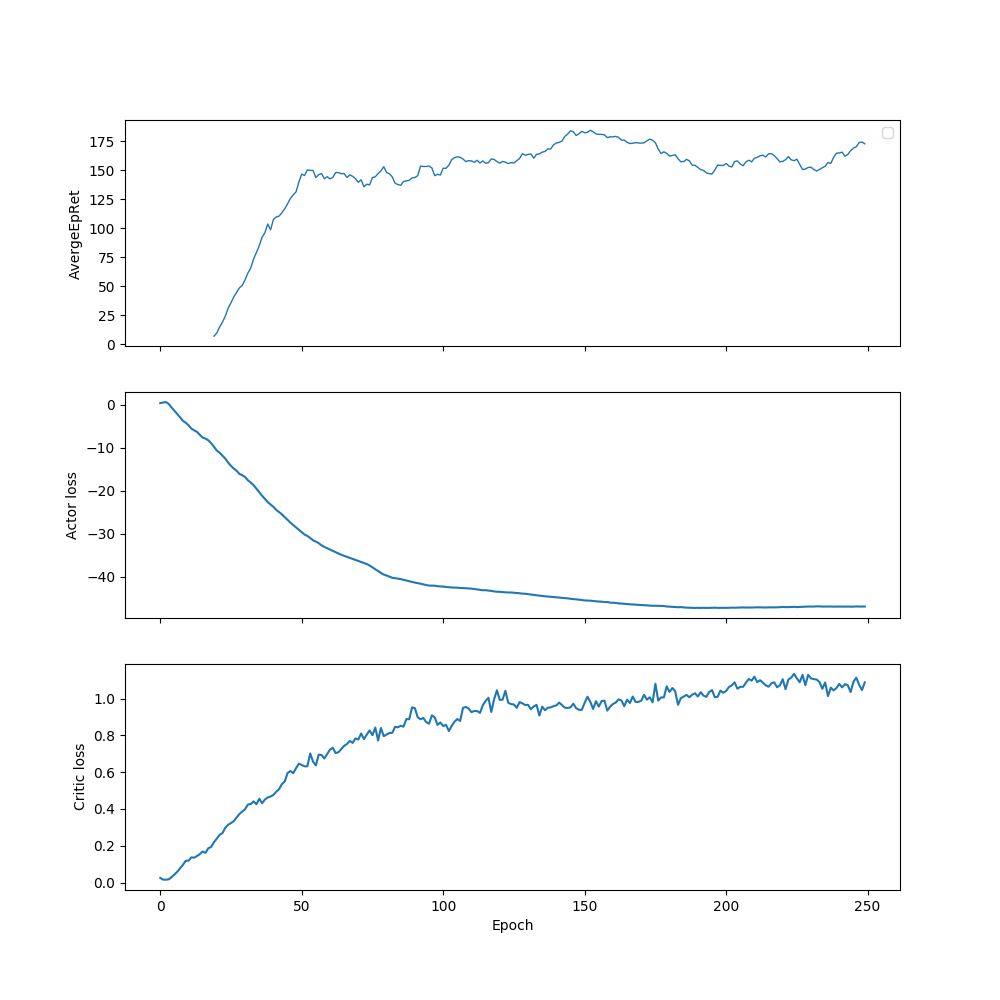

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


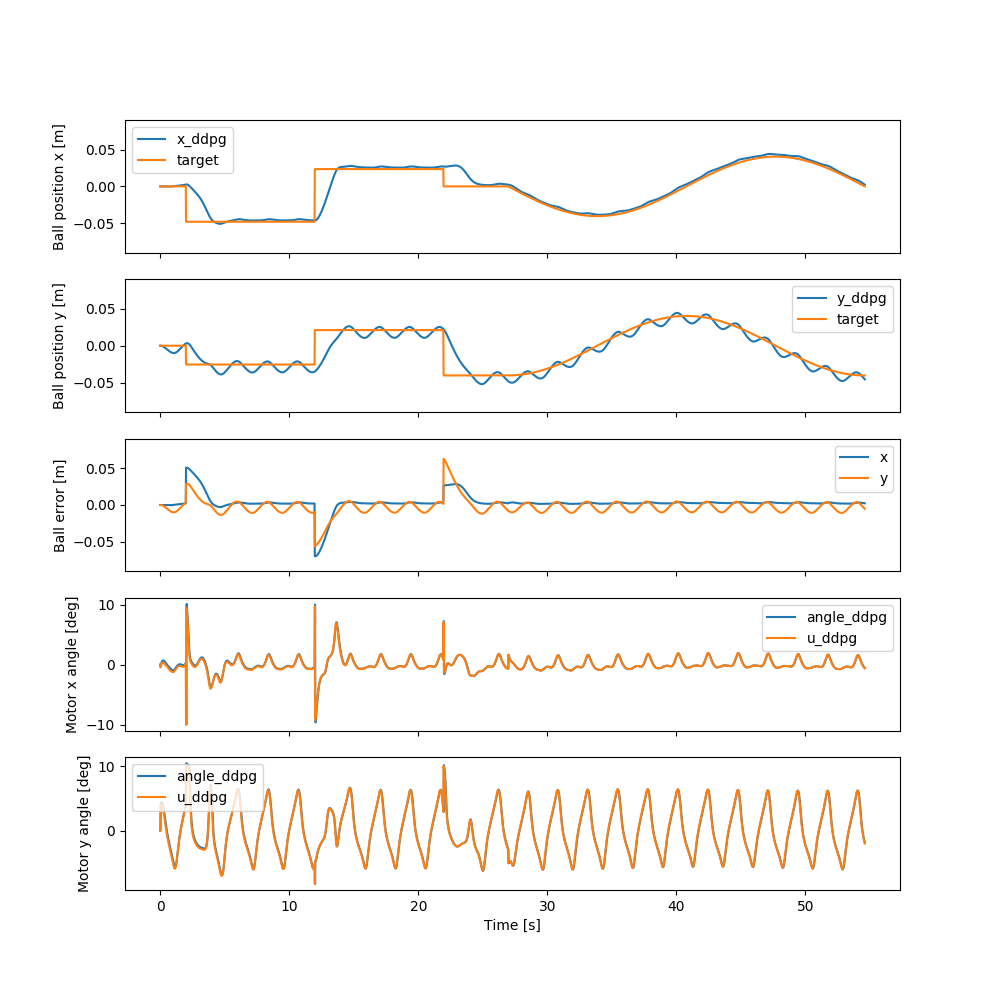

In [35]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid_2'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd472b4be10>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid/progress.txt' m

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -19.5 |
|          StdEpRet |            29.1 |
|          MaxEpRet |            1.92 |
|          MinEpRet |           -60.7 |
|  AverageTestEpRet |            52.9 |
|      StdTestEpRet |            26.9 |
|      MaxTestEpRet |             111 |
|      MinTestEpRet |            10.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.94 |
|          StdQVals |            4.23 |
|          MaxQVals |            14.3 |
|          MinQVals |           -3.11 |
|            LossPi |           -4.17 |
|             LossQ |          0.0772 |
|              Time |             166 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |             -22 |
|          StdEpRet |            27.5 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             117 |
|          StdEpRet |            8.63 |
|          MaxEpRet |             125 |
|          MinEpRet |             108 |
|  AverageTestEpRet |            90.5 |
|      StdTestEpRet |            77.9 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           -25.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            10.7 |
|          StdQVals |            8.58 |
|          MaxQVals |            27.5 |
|          MinQVals |           -6.05 |
|            LossPi |           -10.9 |
|             LossQ |            0.19 |
|              Time |             355 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             101 |
|          StdEpRet |            78.6 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             181 |
|          StdEpRet |            87.2 |
|          MaxEpRet |             281 |
|          MinEpRet |            68.3 |
|  AverageTestEpRet |            99.4 |
|      StdTestEpRet |            81.2 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |           -22.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |              20 |
|          StdQVals |              12 |
|          MaxQVals |            37.1 |
|          MinQVals |           -5.66 |
|            LossPi |           -20.3 |
|             LossQ |           0.358 |
|              Time |             540 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             146 |
|          StdEpRet |              60 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             126 |
|          StdEpRet |            29.5 |
|          MaxEpRet |             155 |
|          MinEpRet |            96.1 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            95.5 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |           -99.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            27.4 |
|          StdQVals |            13.8 |
|          MaxQVals |            44.9 |
|          MinQVals |           -5.08 |
|            LossPi |           -27.6 |
|             LossQ |           0.535 |
|              Time |             766 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            84.5 |
|          StdEpRet |              75 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            89.5 |
|          StdEpRet |            23.8 |
|          MaxEpRet |             110 |
|          MinEpRet |            56.2 |
|  AverageTestEpRet |             104 |
|      StdTestEpRet |            75.3 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |           -51.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            33.4 |
|          StdQVals |              14 |
|          MaxQVals |            49.4 |
|          MinQVals |           -3.92 |
|            LossPi |           -33.6 |
|             LossQ |           0.588 |
|              Time |        1.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             169 |
|          StdEpRet |            21.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             167 |
|          StdEpRet |            31.7 |
|          MaxEpRet |             199 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             115 |
|      StdTestEpRet |            83.3 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -99.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            36.6 |
|          StdQVals |              14 |
|          MaxQVals |            52.1 |
|          MinQVals |          -0.714 |
|            LossPi |           -36.8 |
|             LossQ |             0.7 |
|              Time |        1.31e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             137 |
|          StdEpRet |            59.6 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             109 |
|          StdEpRet |             118 |
|          MaxEpRet |             212 |
|          MinEpRet |           -55.8 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            68.8 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -15.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            38.7 |
|          StdQVals |            14.1 |
|          MaxQVals |            53.4 |
|          MinQVals |          -0.961 |
|            LossPi |           -38.8 |
|             LossQ |           0.699 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            81.1 |
|          StdEpRet |            87.8 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             226 |
|          StdEpRet |            10.9 |
|          MaxEpRet |             237 |
|          MinEpRet |             215 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            47.7 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            32.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            39.7 |
|          StdQVals |            14.3 |
|          MaxQVals |            54.6 |
|          MinQVals |           -4.01 |
|            LossPi |           -39.9 |
|             LossQ |           0.785 |
|              Time |        1.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             200 |
|          StdEpRet |            22.7 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             167 |
|          StdEpRet |            6.49 |
|          MaxEpRet |             171 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            59.4 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |           -7.37 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            41.5 |
|          StdQVals |              14 |
|          MaxQVals |            55.7 |
|          MinQVals |           -6.36 |
|            LossPi |           -41.7 |
|             LossQ |           0.783 |
|              Time |        2.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            96.3 |
|          StdEpRet |            41.3 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             159 |
|          StdEpRet |            11.9 |
|          MaxEpRet |             171 |
|          MinEpRet |             147 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            71.5 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            -100 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            42.9 |
|          StdQVals |            13.7 |
|          MaxQVals |            56.2 |
|          MinQVals |           -4.82 |
|            LossPi |             -43 |
|             LossQ |            0.85 |
|              Time |        2.39e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             131 |
|          StdEpRet |            54.7 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |            80.3 |
|          StdEpRet |            63.2 |
|          MaxEpRet |             167 |
|          MinEpRet |            18.6 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            80.5 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -82.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            43.7 |
|          StdQVals |            13.7 |
|          MaxQVals |            57.3 |
|          MinQVals |           -6.26 |
|            LossPi |           -43.9 |
|             LossQ |           0.891 |
|              Time |        2.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             117 |
|          StdEpRet |            23.8 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             169 |
|          StdEpRet |              37 |
|          MaxEpRet |             206 |
|          MinEpRet |             132 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |              60 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |           -36.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            45.1 |
|          StdQVals |              13 |
|          MaxQVals |            57.6 |
|          MinQVals |            -3.6 |
|            LossPi |           -45.3 |
|             LossQ |           0.864 |
|              Time |        2.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             164 |
|          StdEpRet |            21.8 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             149 |
|          StdEpRet |            2.34 |
|          MaxEpRet |             152 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             180 |
|      StdTestEpRet |            36.6 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |             119 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            45.5 |
|          StdQVals |            12.8 |
|          MaxQVals |            58.3 |
|          MinQVals |           -2.65 |
|            LossPi |           -45.7 |
|             LossQ |           0.861 |
|              Time |         3.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             144 |
|          StdEpRet |            24.9 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             200 |
|          StdEpRet |            37.6 |
|          MaxEpRet |             237 |
|          MinEpRet |             162 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            63.3 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            13.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            45.5 |
|          StdQVals |            12.9 |
|          MaxQVals |            58.6 |
|          MinQVals |          -0.373 |
|            LossPi |           -45.6 |
|             LossQ |           0.911 |
|              Time |        3.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             108 |
|          StdEpRet |             128 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             197 |
|          StdEpRet |              35 |
|          MaxEpRet |             235 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            58.9 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |           -21.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            12.9 |
|          MaxQVals |            58.8 |
|          MinQVals |          -0.765 |
|            LossPi |           -46.1 |
|             LossQ |           0.952 |
|              Time |        3.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             162 |
|          StdEpRet |            65.4 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             143 |
|          StdEpRet |            37.4 |
|          MaxEpRet |             180 |
|          MinEpRet |             105 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            54.3 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |            24.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            46.2 |
|          StdQVals |            12.7 |
|          MaxQVals |              59 |
|          MinQVals |           -1.03 |
|            LossPi |           -46.4 |
|             LossQ |               1 |
|              Time |        4.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             170 |
|          StdEpRet |            59.5 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            74.1 |
|          StdEpRet |            86.2 |
|          MaxEpRet |             158 |
|          MinEpRet |           -44.5 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            68.7 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |           -43.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            12.7 |
|          MaxQVals |            59.2 |
|          MinQVals |           -8.67 |
|            LossPi |           -46.6 |
|             LossQ |            0.99 |
|              Time |         4.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             184 |
|          StdEpRet |            11.8 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             105 |
|          StdEpRet |            84.3 |
|          MaxEpRet |             189 |
|          MinEpRet |            20.5 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            47.6 |
|      MaxTestEpRet |             202 |
|      MinTestEpRet |            19.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            46.6 |
|          StdQVals |            12.5 |
|          MaxQVals |            58.9 |
|          MinQVals |           -10.5 |
|            LossPi |           -46.8 |
|             LossQ |            0.93 |
|              Time |         4.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             109 |
|          StdEpRet |            32.4 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             130 |
|          StdEpRet |            54.4 |
|          MaxEpRet |             183 |
|          MinEpRet |            55.2 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            86.8 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -60.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            46.5 |
|          StdQVals |            12.5 |
|          MaxQVals |            58.9 |
|          MinQVals |             -15 |
|            LossPi |           -46.6 |
|             LossQ |           0.923 |
|              Time |         4.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            98.8 |
|          StdEpRet |             130 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             182 |
|          StdEpRet |            35.1 |
|          MaxEpRet |             217 |
|          MinEpRet |             147 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            46.3 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |            66.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            46.3 |
|          StdQVals |            12.7 |
|          MaxQVals |            58.4 |
|          MinQVals |           -10.4 |
|            LossPi |           -46.5 |
|             LossQ |            1.01 |
|              Time |           5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             210 |
|          StdEpRet |            20.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             146 |
|          StdEpRet |            36.4 |
|          MaxEpRet |             180 |
|          MinEpRet |            95.8 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            76.8 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |             -57 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            46.3 |
|          StdQVals |            12.6 |
|          MaxQVals |            58.3 |
|          MinQVals |           -4.17 |
|            LossPi |           -46.4 |
|             LossQ |            1.02 |
|              Time |         5.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            95.2 |
|          StdEpRet |              23 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             138 |
|          StdEpRet |            5.78 |
|          MaxEpRet |             144 |
|          MinEpRet |             133 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |              32 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            46.5 |
|          StdQVals |            12.8 |
|          MaxQVals |              59 |
|          MinQVals |           -8.74 |
|            LossPi |           -46.6 |
|             LossQ |             1.1 |
|              Time |        5.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             173 |
|          StdEpRet |            37.5 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             184 |
|          StdEpRet |            63.9 |
|          MaxEpRet |             264 |
|          MinEpRet |             107 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            74.1 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |           -55.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            46.7 |
|          StdQVals |            12.6 |
|          MaxQVals |            58.8 |
|          MinQVals |           -16.2 |
|            LossPi |           -46.8 |
|             LossQ |             1.1 |
|              Time |        5.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            93.9 |
|          StdEpRet |             103 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             202 |
|          StdEpRet |            87.2 |
|          MaxEpRet |             289 |
|          MinEpRet |             114 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            85.8 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |           -67.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            46.8 |
|          StdQVals |            12.8 |
|          MaxQVals |            58.5 |
|          MinQVals |           -12.5 |
|            LossPi |             -47 |
|             LossQ |            1.02 |
|              Time |        5.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             131 |
|          StdEpRet |            74.8 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             103 |
|          StdEpRet |             101 |
|          MaxEpRet |             194 |
|          MinEpRet |           -38.3 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            95.5 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |           -30.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            12.9 |
|          MaxQVals |              58 |
|          MinQVals |             -19 |
|            LossPi |           -47.1 |
|             LossQ |             1.1 |
|              Time |        6.23e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             153 |
|          StdEpRet |            35.4 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -25218.73358266635


<IPython.core.display.Javascript object>


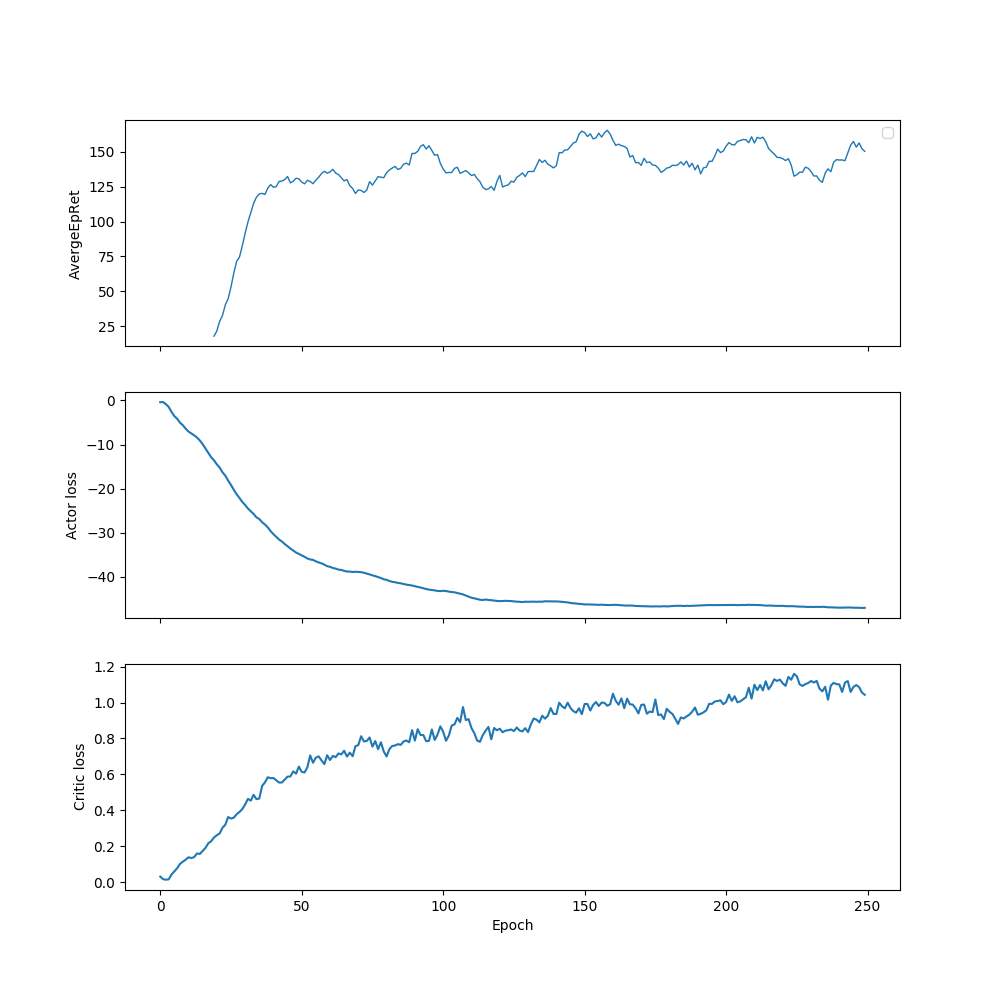

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


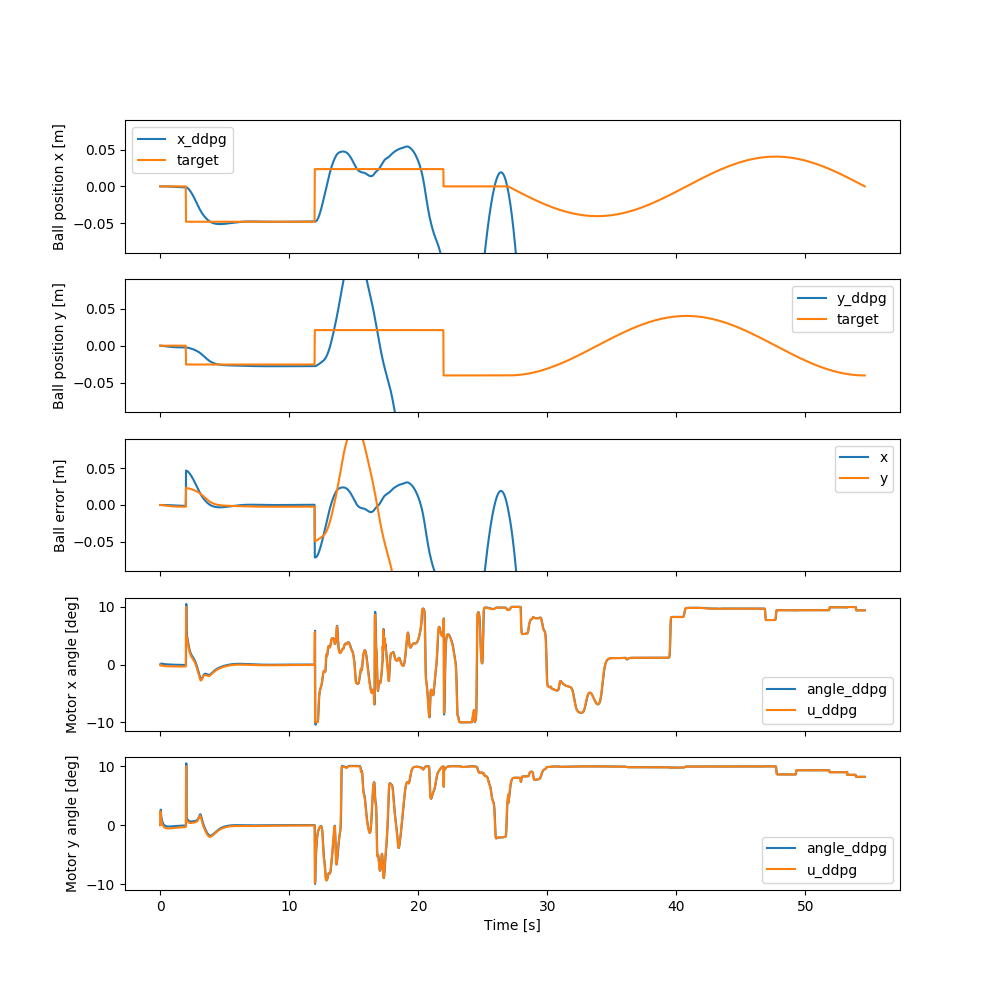

In [22]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_2/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd450553908>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_2",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_2/progress.

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -31.4 |
|          StdEpRet |            30.7 |
|          MaxEpRet |            10.7 |
|          MinEpRet |           -61.3 |
|  AverageTestEpRet |            35.5 |
|      StdTestEpRet |              23 |
|      MaxTestEpRet |             106 |
|      MinTestEpRet |           -5.04 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.17 |
|          StdQVals |            3.95 |
|          MaxQVals |            12.6 |
|          MinQVals |           -3.51 |
|            LossPi |           -3.38 |
|             LossQ |          0.0478 |
|              Time |             101 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -9.65 |
|          StdEpRet |            34.6 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            85.2 |
|          StdEpRet |            30.3 |
|          MaxEpRet |             116 |
|          MinEpRet |            54.9 |
|  AverageTestEpRet |            29.8 |
|      StdTestEpRet |            79.2 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            -123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |             9.4 |
|          StdQVals |            9.07 |
|          MaxQVals |            27.4 |
|          MinQVals |           -6.38 |
|            LossPi |           -9.62 |
|             LossQ |           0.159 |
|              Time |             272 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            63.6 |
|          StdEpRet |              59 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             117 |
|          StdEpRet |            24.8 |
|          MaxEpRet |             148 |
|          MinEpRet |              87 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            63.5 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |           -21.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            17.5 |
|          StdQVals |            12.5 |
|          MaxQVals |            36.6 |
|          MinQVals |           -6.27 |
|            LossPi |           -17.7 |
|             LossQ |           0.372 |
|              Time |             442 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             110 |
|          StdEpRet |            69.9 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             149 |
|          StdEpRet |            58.2 |
|          MaxEpRet |             207 |
|          MinEpRet |            90.6 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            60.9 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |            33.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            24.2 |
|          StdQVals |              14 |
|          MaxQVals |            42.7 |
|          MinQVals |           -5.27 |
|            LossPi |           -24.4 |
|             LossQ |           0.477 |
|              Time |             616 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             118 |
|          StdEpRet |            34.7 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             143 |
|          StdEpRet |            27.4 |
|          MaxEpRet |             176 |
|          MinEpRet |             109 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            78.1 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |            -117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            30.1 |
|          StdQVals |            14.7 |
|          MaxQVals |            47.6 |
|          MinQVals |           -5.78 |
|            LossPi |           -30.3 |
|             LossQ |           0.522 |
|              Time |             789 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            77.8 |
|          StdEpRet |              66 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            1.06 |
|          StdEpRet |            18.5 |
|          MaxEpRet |            19.5 |
|          MinEpRet |           -17.4 |
|  AverageTestEpRet |             101 |
|      StdTestEpRet |              85 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -93.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            33.7 |
|          StdQVals |            14.2 |
|          MaxQVals |            51.1 |
|          MinQVals |           -9.67 |
|            LossPi |           -33.9 |
|             LossQ |           0.589 |
|              Time |             958 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            54.7 |
|          StdEpRet |            96.7 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             126 |
|          StdEpRet |              27 |
|          MaxEpRet |             164 |
|          MinEpRet |             102 |
|  AverageTestEpRet |             101 |
|      StdTestEpRet |            96.7 |
|      MaxTestEpRet |             209 |
|      MinTestEpRet |           -76.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            35.9 |
|          StdQVals |              14 |
|          MaxQVals |              53 |
|          MinQVals |           -11.2 |
|            LossPi |           -36.1 |
|             LossQ |           0.631 |
|              Time |        1.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             109 |
|          StdEpRet |            83.4 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             209 |
|          StdEpRet |            23.5 |
|          MaxEpRet |             232 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |              65 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |             1.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            37.9 |
|          StdQVals |            14.1 |
|          MaxQVals |            54.6 |
|          MinQVals |           -11.1 |
|            LossPi |           -38.1 |
|             LossQ |           0.696 |
|              Time |         1.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             109 |
|          StdEpRet |            84.4 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             191 |
|          StdEpRet |            20.2 |
|          MaxEpRet |             209 |
|          MinEpRet |             163 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |            49.3 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            21.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            39.9 |
|          StdQVals |            13.9 |
|          MaxQVals |            55.9 |
|          MinQVals |           -6.87 |
|            LossPi |           -40.1 |
|             LossQ |           0.796 |
|              Time |        1.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             123 |
|          StdEpRet |            53.3 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            55.2 |
|          StdEpRet |            88.9 |
|          MaxEpRet |             144 |
|          MinEpRet |           -33.8 |
|  AverageTestEpRet |              79 |
|      StdTestEpRet |             116 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            -126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            40.8 |
|          StdQVals |            13.3 |
|          MaxQVals |            56.2 |
|          MinQVals |           -10.7 |
|            LossPi |             -41 |
|             LossQ |           0.836 |
|              Time |        1.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             176 |
|          StdEpRet |            26.4 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             188 |
|          StdEpRet |            31.4 |
|          MaxEpRet |             232 |
|          MinEpRet |             164 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            56.7 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |           -27.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            41.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            56.5 |
|          MinQVals |           -6.28 |
|            LossPi |           -41.8 |
|             LossQ |            0.84 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             148 |
|          StdEpRet |            26.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             134 |
|          StdEpRet |            27.5 |
|          MaxEpRet |             162 |
|          MinEpRet |             107 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |              73 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |           -85.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            42.1 |
|          StdQVals |            13.4 |
|          MaxQVals |            57.2 |
|          MinQVals |           -6.32 |
|            LossPi |           -42.3 |
|             LossQ |           0.885 |
|              Time |           2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             154 |
|          StdEpRet |            38.2 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            64.1 |
|          StdEpRet |            89.8 |
|          MaxEpRet |             139 |
|          MinEpRet |           -62.2 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            76.5 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |           -53.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            42.4 |
|          StdQVals |            13.8 |
|          MaxQVals |            57.3 |
|          MinQVals |           -5.77 |
|            LossPi |           -42.5 |
|             LossQ |           0.876 |
|              Time |        2.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |            88.5 |
|          StdEpRet |             106 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             172 |
|          StdEpRet |              15 |
|          MaxEpRet |             187 |
|          MinEpRet |             157 |
|  AverageTestEpRet |              83 |
|      StdTestEpRet |            79.6 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -70.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            42.8 |
|          StdQVals |            13.8 |
|          MaxQVals |            57.1 |
|          MinQVals |            -2.5 |
|            LossPi |             -43 |
|             LossQ |           0.904 |
|              Time |        2.35e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             119 |
|          StdEpRet |            65.6 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |            87.6 |
|          StdEpRet |             106 |
|          MaxEpRet |             170 |
|          MinEpRet |           -62.6 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            82.4 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |           -71.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            43.4 |
|          StdQVals |            13.4 |
|          MaxQVals |            57.3 |
|          MinQVals |           -8.13 |
|            LossPi |           -43.6 |
|             LossQ |           0.835 |
|              Time |        2.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             137 |
|          StdEpRet |            40.1 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            62.3 |
|          StdEpRet |             157 |
|          MaxEpRet |             219 |
|          MinEpRet |           -94.4 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            51.8 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |            47.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            43.7 |
|          StdQVals |            13.1 |
|          MaxQVals |            57.4 |
|          MinQVals |           -9.02 |
|            LossPi |           -43.9 |
|             LossQ |           0.903 |
|              Time |        2.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             212 |
|          StdEpRet |            18.9 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            84.3 |
|          StdEpRet |            94.5 |
|          MaxEpRet |             184 |
|          MinEpRet |           -42.5 |
|  AverageTestEpRet |             186 |
|      StdTestEpRet |              38 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |            96.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            44.3 |
|          StdQVals |            13.1 |
|          MaxQVals |            57.4 |
|          MinQVals |            -5.3 |
|            LossPi |           -44.5 |
|             LossQ |            0.89 |
|              Time |        2.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             181 |
|          StdEpRet |            36.8 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             150 |
|          StdEpRet |            14.3 |
|          MaxEpRet |             165 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            60.4 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |           -3.76 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            44.8 |
|          StdQVals |            13.1 |
|          MaxQVals |            57.2 |
|          MinQVals |           -6.98 |
|            LossPi |           -44.9 |
|             LossQ |           0.836 |
|              Time |        3.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             103 |
|          StdEpRet |            38.4 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             185 |
|          StdEpRet |            61.3 |
|          MaxEpRet |             235 |
|          MinEpRet |            98.7 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            53.7 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            39.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            44.9 |
|          StdQVals |            13.3 |
|          MaxQVals |            57.4 |
|          MinQVals |           -8.13 |
|            LossPi |           -45.1 |
|             LossQ |           0.864 |
|              Time |        3.21e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             170 |
|          StdEpRet |            51.9 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             188 |
|          StdEpRet |             3.7 |
|          MaxEpRet |             191 |
|          MinEpRet |             184 |
|  AverageTestEpRet |             118 |
|      StdTestEpRet |             109 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            -127 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            45.2 |
|          StdQVals |            13.2 |
|          MaxQVals |            57.3 |
|          MinQVals |           -7.71 |
|            LossPi |           -45.3 |
|             LossQ |             0.8 |
|              Time |        3.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             156 |
|          StdEpRet |            50.7 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             175 |
|          StdEpRet |            4.44 |
|          MaxEpRet |             180 |
|          MinEpRet |             169 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            72.3 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |           -73.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |              45 |
|          StdQVals |            13.7 |
|          MaxQVals |            58.3 |
|          MinQVals |           -11.7 |
|            LossPi |           -45.2 |
|             LossQ |           0.974 |
|              Time |        3.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            62.1 |
|          StdEpRet |              65 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             162 |
|          StdEpRet |            19.7 |
|          MaxEpRet |             182 |
|          MinEpRet |             142 |
|  AverageTestEpRet |             121 |
|      StdTestEpRet |            96.1 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |           -76.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            45.2 |
|          StdQVals |            13.8 |
|          MaxQVals |            58.4 |
|          MinQVals |           -11.1 |
|            LossPi |           -45.3 |
|             LossQ |            0.95 |
|              Time |        3.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |            77.4 |
|          StdEpRet |            92.8 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             102 |
|          StdEpRet |            82.8 |
|          MaxEpRet |             188 |
|          MinEpRet |           -9.86 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            67.5 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |           -24.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            45.3 |
|          StdQVals |            13.8 |
|          MaxQVals |            58.5 |
|          MinQVals |           -11.3 |
|            LossPi |           -45.4 |
|             LossQ |           0.936 |
|              Time |         3.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             144 |
|          StdEpRet |              50 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            30.6 |
|          StdEpRet |             140 |
|          MaxEpRet |             171 |
|          MinEpRet |            -109 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |             122 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |            -148 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            45.3 |
|          StdQVals |            13.8 |
|          MaxQVals |            57.3 |
|          MinQVals |           -15.8 |
|            LossPi |           -45.4 |
|             LossQ |           0.914 |
|              Time |        4.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |            57.2 |
|          StdEpRet |            97.9 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            63.3 |
|          StdEpRet |            60.1 |
|          MaxEpRet |             109 |
|          MinEpRet |           -21.6 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            93.8 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -81.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            45.1 |
|          StdQVals |            14.3 |
|          MaxQVals |            58.9 |
|          MinQVals |           -14.3 |
|            LossPi |           -45.3 |
|             LossQ |           0.954 |
|              Time |        4.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             157 |
|          StdEpRet |            29.5 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0002572764235739517


<IPython.core.display.Javascript object>


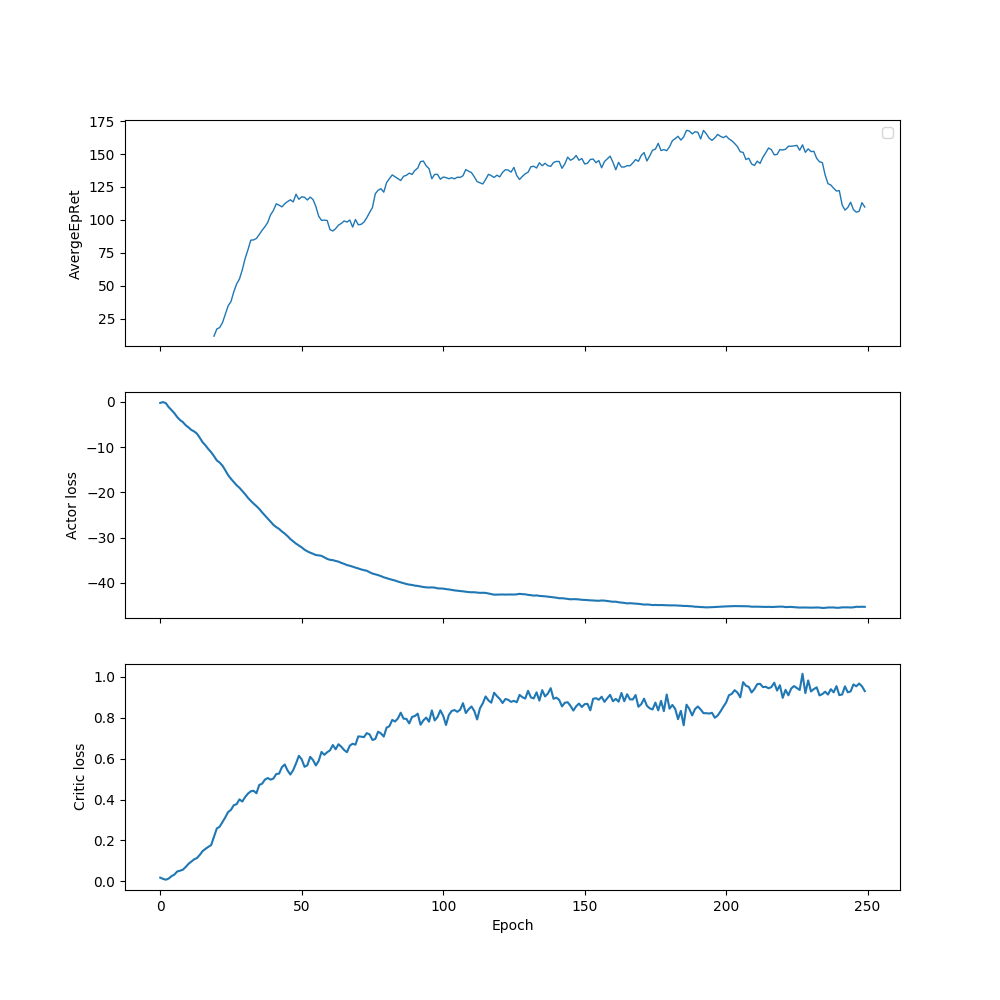

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


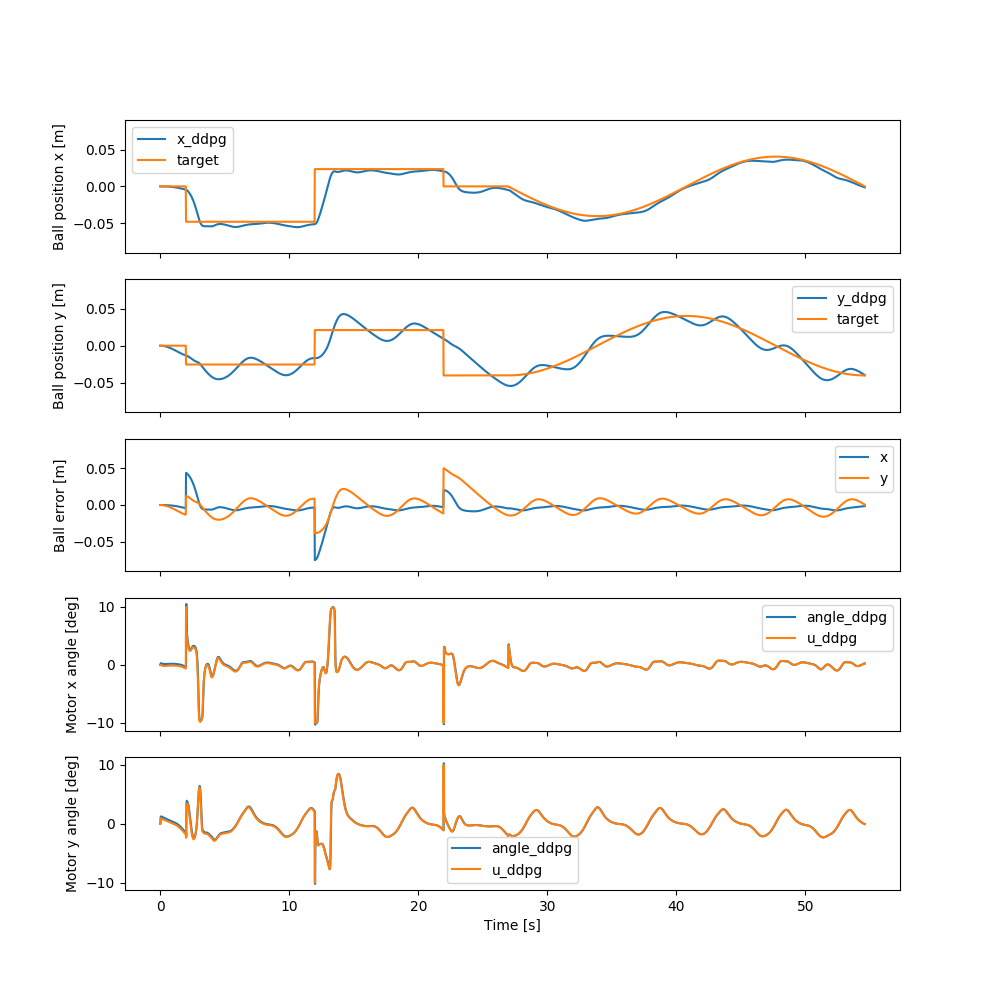

In [36]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid_2'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	500,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd461af6588>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100]_sigmoid_long/progress.txt' mode='w' en

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -39.9 |
|          StdEpRet |            14.2 |
|          MaxEpRet |           -24.2 |
|          MinEpRet |           -58.5 |
|  AverageTestEpRet |             101 |
|      StdTestEpRet |            35.1 |
|      MaxTestEpRet |             166 |
|      MinTestEpRet |            30.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.43 |
|          StdQVals |            3.04 |
|          MaxQVals |              12 |
|          MinQVals |           -2.21 |
|            LossPi |           -2.64 |
|             LossQ |          0.0306 |
|              Time |            96.8 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |             -28 |
|          StdEpRet |              22 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            26.3 |
|          StdEpRet |            16.6 |
|          MaxEpRet |            42.9 |
|          MinEpRet |            9.67 |
|  AverageTestEpRet |              73 |
|      StdTestEpRet |            41.2 |
|      MaxTestEpRet |             140 |
|      MinTestEpRet |            6.57 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            7.92 |
|          StdQVals |            7.38 |
|          MaxQVals |            33.5 |
|          MinQVals |           -4.01 |
|            LossPi |           -8.15 |
|             LossQ |           0.188 |
|              Time |             247 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             120 |
|          StdEpRet |            76.6 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            97.3 |
|          StdEpRet |            58.3 |
|          MaxEpRet |             180 |
|          MinEpRet |            52.6 |
|  AverageTestEpRet |              77 |
|      StdTestEpRet |            68.5 |
|      MaxTestEpRet |             191 |
|      MinTestEpRet |           -33.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            17.7 |
|          StdQVals |            13.4 |
|          MaxQVals |            45.8 |
|          MinQVals |            -6.6 |
|            LossPi |           -17.9 |
|             LossQ |           0.556 |
|              Time |             401 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             133 |
|          StdEpRet |            34.1 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             112 |
|          StdEpRet |            32.3 |
|          MaxEpRet |             144 |
|          MinEpRet |            79.6 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |            56.1 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -4.74 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            25.2 |
|          StdQVals |            15.3 |
|          MaxQVals |            50.2 |
|          MinQVals |           -5.42 |
|            LossPi |           -25.4 |
|             LossQ |           0.854 |
|              Time |             555 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             136 |
|          StdEpRet |            16.2 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             116 |
|          StdEpRet |            33.6 |
|          MaxEpRet |             163 |
|          MinEpRet |            85.8 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            57.7 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |           -46.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            31.7 |
|          StdQVals |            15.3 |
|          MaxQVals |            55.2 |
|          MinQVals |           -3.14 |
|            LossPi |           -31.9 |
|             LossQ |           0.714 |
|              Time |             704 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            30.7 |
|          StdEpRet |            95.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             159 |
|          StdEpRet |            31.9 |
|          MaxEpRet |             191 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            83.4 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |            -112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            35.6 |
|          StdQVals |            14.5 |
|          MaxQVals |            58.7 |
|          MinQVals |           0.927 |
|            LossPi |           -35.8 |
|             LossQ |           0.648 |
|              Time |             859 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             139 |
|          StdEpRet |            45.2 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             136 |
|          StdEpRet |            61.5 |
|          MaxEpRet |             220 |
|          MinEpRet |              75 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            71.6 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |            -103 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            38.6 |
|          StdQVals |            13.9 |
|          MaxQVals |              61 |
|          MinQVals |            2.01 |
|            LossPi |           -38.8 |
|             LossQ |           0.668 |
|              Time |        1.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             131 |
|          StdEpRet |              13 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             228 |
|          StdEpRet |            34.9 |
|          MaxEpRet |             263 |
|          MinEpRet |             193 |
|  AverageTestEpRet |            80.4 |
|      StdTestEpRet |            90.3 |
|      MaxTestEpRet |             217 |
|      MinTestEpRet |           -72.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            41.1 |
|          StdQVals |            14.7 |
|          MaxQVals |            63.7 |
|          MinQVals |           0.449 |
|            LossPi |           -41.3 |
|             LossQ |            0.94 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             118 |
|          StdEpRet |            54.6 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             163 |
|          StdEpRet |            17.1 |
|          MaxEpRet |             179 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             122 |
|      StdTestEpRet |            85.9 |
|      MaxTestEpRet |             217 |
|      MinTestEpRet |           -69.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            43.1 |
|          StdQVals |            14.7 |
|          MaxQVals |            64.4 |
|          MinQVals |            1.05 |
|            LossPi |           -43.3 |
|             LossQ |           0.993 |
|              Time |        1.31e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             166 |
|          StdEpRet |            12.5 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             196 |
|          StdEpRet |            17.8 |
|          MaxEpRet |             214 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            69.5 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -9.04 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            44.9 |
|          StdQVals |            14.2 |
|          MaxQVals |            62.8 |
|          MinQVals |            -3.5 |
|            LossPi |           -45.1 |
|             LossQ |            1.06 |
|              Time |        1.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             162 |
|          StdEpRet |            54.3 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             112 |
|          StdEpRet |             114 |
|          MaxEpRet |             208 |
|          MinEpRet |           -47.7 |
|  AverageTestEpRet |             131 |
|      StdTestEpRet |            75.8 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |           -46.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |              46 |
|          StdQVals |            13.9 |
|          MaxQVals |            65.1 |
|          MinQVals |            -2.5 |
|            LossPi |           -46.2 |
|             LossQ |           0.936 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             172 |
|          StdEpRet |            34.6 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             139 |
|          StdEpRet |            55.5 |
|          MaxEpRet |             194 |
|          MinEpRet |            83.1 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |              40 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |             101 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            13.8 |
|          MaxQVals |            63.7 |
|          MinQVals |           -10.7 |
|            LossPi |           -46.6 |
|             LossQ |           0.978 |
|              Time |        1.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            84.8 |
|          StdEpRet |             114 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             146 |
|          StdEpRet |            60.6 |
|          MaxEpRet |             209 |
|          MinEpRet |            64.4 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            64.6 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -83.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            13.3 |
|          MaxQVals |              63 |
|          MinQVals |            -8.4 |
|            LossPi |           -46.6 |
|             LossQ |           0.972 |
|              Time |         1.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             213 |
|          StdEpRet |            11.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             188 |
|          StdEpRet |            47.7 |
|          MaxEpRet |             236 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            42.1 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            95.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            13.4 |
|          MaxQVals |            62.7 |
|          MinQVals |           -9.72 |
|            LossPi |           -47.1 |
|             LossQ |           0.969 |
|              Time |        2.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             192 |
|          StdEpRet |            20.4 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             182 |
|          StdEpRet |              12 |
|          MaxEpRet |             199 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |            90.6 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            -119 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            47.1 |
|          StdQVals |            13.2 |
|          MaxQVals |            61.9 |
|          MinQVals |           -6.36 |
|            LossPi |           -47.3 |
|             LossQ |           0.923 |
|              Time |         2.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             197 |
|          StdEpRet |            27.7 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             197 |
|          StdEpRet |            37.2 |
|          MaxEpRet |             234 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            34.9 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |             117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            47.2 |
|          StdQVals |              13 |
|          MaxQVals |            62.2 |
|          MinQVals |           -4.25 |
|            LossPi |           -47.3 |
|             LossQ |            0.94 |
|              Time |        2.35e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             182 |
|          StdEpRet |            8.58 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             130 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             156 |
|          MinEpRet |            86.3 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            61.5 |
|      MaxTestEpRet |             208 |
|      MinTestEpRet |           -54.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            47.4 |
|          StdQVals |            12.8 |
|          MaxQVals |            62.1 |
|          MinQVals |           -6.88 |
|            LossPi |           -47.5 |
|             LossQ |           0.978 |
|              Time |         2.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             172 |
|          StdEpRet |            29.9 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             138 |
|          StdEpRet |            25.4 |
|          MaxEpRet |             163 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             148 |
|      StdTestEpRet |            59.6 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -7.46 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            47.8 |
|          StdQVals |            12.6 |
|          MaxQVals |            61.8 |
|          MinQVals |           -11.5 |
|            LossPi |           -47.9 |
|             LossQ |           0.883 |
|              Time |        2.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             123 |
|          StdEpRet |            34.4 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            97.5 |
|          StdEpRet |             108 |
|          MaxEpRet |             231 |
|          MinEpRet |           -33.9 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            80.9 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -52.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            47.5 |
|          StdQVals |            12.7 |
|          MaxQVals |            60.4 |
|          MinQVals |           -4.55 |
|            LossPi |           -47.6 |
|             LossQ |           0.918 |
|              Time |         2.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             132 |
|          StdEpRet |            35.6 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             146 |
|          StdEpRet |            8.75 |
|          MaxEpRet |             155 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            78.4 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |            -102 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            47.3 |
|          StdQVals |            12.6 |
|          MaxQVals |            61.1 |
|          MinQVals |           -6.78 |
|            LossPi |           -47.5 |
|             LossQ |           0.916 |
|              Time |        2.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             202 |
|          StdEpRet |            8.56 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             191 |
|          StdEpRet |            41.1 |
|          MaxEpRet |             249 |
|          MinEpRet |             156 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |              67 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -67.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            47.3 |
|          StdQVals |            12.7 |
|          MaxQVals |            60.3 |
|          MinQVals |           -11.1 |
|            LossPi |           -47.4 |
|             LossQ |           0.924 |
|              Time |         3.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             176 |
|          StdEpRet |            47.2 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             152 |
|          StdEpRet |            49.7 |
|          MaxEpRet |             201 |
|          MinEpRet |             102 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            48.4 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            9.68 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            47.6 |
|          StdQVals |            12.4 |
|          MaxQVals |            60.5 |
|          MinQVals |           -16.1 |
|            LossPi |           -47.7 |
|             LossQ |           0.953 |
|              Time |        3.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             137 |
|          StdEpRet |            29.1 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             145 |
|          StdEpRet |            27.9 |
|          MaxEpRet |             172 |
|          MinEpRet |             107 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            45.2 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            54.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            47.4 |
|          StdQVals |            12.2 |
|          MaxQVals |            59.9 |
|          MinQVals |           -19.2 |
|            LossPi |           -47.5 |
|             LossQ |           0.926 |
|              Time |         3.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             141 |
|          StdEpRet |              36 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             195 |
|          StdEpRet |            11.7 |
|          MaxEpRet |             206 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |              37 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            98.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            47.3 |
|          StdQVals |            12.2 |
|          MaxQVals |            59.1 |
|          MinQVals |           -20.4 |
|            LossPi |           -47.4 |
|             LossQ |           0.919 |
|              Time |        3.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             189 |
|          StdEpRet |            30.2 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             163 |
|          StdEpRet |            13.7 |
|          MaxEpRet |             179 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |              50 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |            24.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            47.4 |
|          StdQVals |            12.1 |
|          MaxQVals |            59.2 |
|          MinQVals |           -24.5 |
|            LossPi |           -47.5 |
|             LossQ |           0.988 |
|              Time |        3.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             186 |
|          StdEpRet |            11.3 |


---------------------------------------
|             Epoch |             257 |
|      AverageEpRet |             187 |
|          StdEpRet |            3.78 |
|          MaxEpRet |             191 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            69.8 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |           -35.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.83e+05 |
|      AverageQVals |            47.5 |
|          StdQVals |            12.2 |
|          MaxQVals |            60.5 |
|          MinQVals |           -29.9 |
|            LossPi |           -47.6 |
|             LossQ |           0.962 |
|              Time |        3.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             258 |
|      AverageEpRet |             224 |
|          StdEpRet |            34.6 |


---------------------------------------
|             Epoch |             267 |
|      AverageEpRet |             180 |
|          StdEpRet |            34.2 |
|          MaxEpRet |             220 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            42.2 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |            34.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.94e+05 |
|      AverageQVals |            47.6 |
|          StdQVals |            12.2 |
|          MaxQVals |            60.7 |
|          MinQVals |           -19.8 |
|            LossPi |           -47.7 |
|             LossQ |            1.02 |
|              Time |        4.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             268 |
|      AverageEpRet |            27.1 |
|          StdEpRet |            83.6 |


---------------------------------------
|             Epoch |             277 |
|      AverageEpRet |             134 |
|          StdEpRet |            22.8 |
|          MaxEpRet |             157 |
|          MinEpRet |             112 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            39.8 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.05e+05 |
|      AverageQVals |            48.1 |
|          StdQVals |            11.8 |
|          MaxQVals |            60.1 |
|          MinQVals |           -22.1 |
|            LossPi |           -48.2 |
|             LossQ |            1.04 |
|              Time |        4.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             278 |
|      AverageEpRet |             182 |
|          StdEpRet |            5.65 |


---------------------------------------
|             Epoch |             287 |
|      AverageEpRet |            18.5 |
|          StdEpRet |             111 |
|          MaxEpRet |             175 |
|          MinEpRet |           -72.8 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            79.5 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |             -55 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.16e+05 |
|      AverageQVals |            49.1 |
|          StdQVals |            10.5 |
|          MaxQVals |            60.3 |
|          MinQVals |           -21.5 |
|            LossPi |           -49.2 |
|             LossQ |            1.01 |
|              Time |        4.31e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             288 |
|      AverageEpRet |            99.1 |
|          StdEpRet |            94.2 |


---------------------------------------
|             Epoch |             297 |
|      AverageEpRet |             169 |
|          StdEpRet |            15.2 |
|          MaxEpRet |             185 |
|          MinEpRet |             154 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |              44 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |             104 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.27e+05 |
|      AverageQVals |            49.5 |
|          StdQVals |            9.97 |
|          MaxQVals |            59.7 |
|          MinQVals |           -24.9 |
|            LossPi |           -49.6 |
|             LossQ |            1.02 |
|              Time |        4.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             298 |
|      AverageEpRet |             187 |
|          StdEpRet |            10.3 |


---------------------------------------
|             Epoch |             307 |
|      AverageEpRet |             169 |
|          StdEpRet |            18.3 |
|          MaxEpRet |             194 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            75.8 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |           -72.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.38e+05 |
|      AverageQVals |            49.9 |
|          StdQVals |            9.49 |
|          MaxQVals |              59 |
|          MinQVals |           -27.8 |
|            LossPi |             -50 |
|             LossQ |           0.962 |
|              Time |        4.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             308 |
|      AverageEpRet |             154 |
|          StdEpRet |            41.7 |


---------------------------------------
|             Epoch |             317 |
|      AverageEpRet |             126 |
|          StdEpRet |            95.1 |
|          MaxEpRet |             221 |
|          MinEpRet |              31 |
|  AverageTestEpRet |             148 |
|      StdTestEpRet |            78.9 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |           -62.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.49e+05 |
|      AverageQVals |              50 |
|          StdQVals |            9.45 |
|          MaxQVals |            59.3 |
|          MinQVals |           -26.1 |
|            LossPi |           -50.1 |
|             LossQ |               1 |
|              Time |        4.77e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             318 |
|      AverageEpRet |             215 |
|          StdEpRet |            14.3 |


---------------------------------------
|             Epoch |             327 |
|      AverageEpRet |             181 |
|          StdEpRet |            18.4 |
|          MaxEpRet |             201 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            83.5 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |            -124 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.6e+05 |
|      AverageQVals |            50.4 |
|          StdQVals |            9.35 |
|          MaxQVals |            60.5 |
|          MinQVals |           -30.9 |
|            LossPi |           -50.5 |
|             LossQ |           0.904 |
|              Time |        4.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             328 |
|      AverageEpRet |            99.5 |
|          StdEpRet |             155 |


---------------------------------------
|             Epoch |             337 |
|      AverageEpRet |             216 |
|          StdEpRet |              22 |
|          MaxEpRet |             238 |
|          MinEpRet |             194 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            72.7 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -87.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.71e+05 |
|      AverageQVals |            50.3 |
|          StdQVals |            10.1 |
|          MaxQVals |            62.5 |
|          MinQVals |           -34.2 |
|            LossPi |           -50.4 |
|             LossQ |            1.03 |
|              Time |        5.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             338 |
|      AverageEpRet |             198 |
|          StdEpRet |            13.2 |


---------------------------------------
|             Epoch |             347 |
|      AverageEpRet |             169 |
|          StdEpRet |            22.3 |
|          MaxEpRet |             192 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |              72 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |           -90.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.82e+05 |
|      AverageQVals |            50.7 |
|          StdQVals |            10.8 |
|          MaxQVals |            61.6 |
|          MinQVals |           -33.6 |
|            LossPi |           -50.8 |
|             LossQ |            1.07 |
|              Time |        5.24e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             348 |
|      AverageEpRet |             140 |
|          StdEpRet |            33.5 |


---------------------------------------
|             Epoch |             357 |
|      AverageEpRet |             176 |
|          StdEpRet |            10.3 |
|          MaxEpRet |             186 |
|          MinEpRet |             166 |
|  AverageTestEpRet |             103 |
|      StdTestEpRet |            82.9 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -73.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.93e+05 |
|      AverageQVals |            50.8 |
|          StdQVals |            11.2 |
|          MaxQVals |            62.3 |
|          MinQVals |           -39.3 |
|            LossPi |           -50.9 |
|             LossQ |             1.1 |
|              Time |        5.39e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             358 |
|      AverageEpRet |             201 |
|          StdEpRet |            1.28 |


---------------------------------------
|             Epoch |             367 |
|      AverageEpRet |             178 |
|          StdEpRet |            21.8 |
|          MaxEpRet |             196 |
|          MinEpRet |             147 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            58.6 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |           -36.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.04e+05 |
|      AverageQVals |            50.9 |
|          StdQVals |            11.4 |
|          MaxQVals |            60.7 |
|          MinQVals |             -28 |
|            LossPi |             -51 |
|             LossQ |            1.05 |
|              Time |        5.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             368 |
|      AverageEpRet |             175 |
|          StdEpRet |            68.8 |


---------------------------------------
|             Epoch |             377 |
|      AverageEpRet |             128 |
|          StdEpRet |            44.2 |
|          MaxEpRet |             172 |
|          MinEpRet |            83.4 |
|  AverageTestEpRet |             134 |
|      StdTestEpRet |            63.5 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -32.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.15e+05 |
|      AverageQVals |            50.6 |
|          StdQVals |            11.8 |
|          MaxQVals |            60.8 |
|          MinQVals |           -28.5 |
|            LossPi |           -50.7 |
|             LossQ |             1.1 |
|              Time |        5.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             378 |
|      AverageEpRet |             170 |
|          StdEpRet |            18.5 |


---------------------------------------
|             Epoch |             387 |
|      AverageEpRet |             189 |
|          StdEpRet |            12.9 |
|          MaxEpRet |             203 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            39.8 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |             102 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.26e+05 |
|      AverageQVals |            50.5 |
|          StdQVals |            11.5 |
|          MaxQVals |            60.5 |
|          MinQVals |           -29.8 |
|            LossPi |           -50.6 |
|             LossQ |            1.05 |
|              Time |        5.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             388 |
|      AverageEpRet |             164 |
|          StdEpRet |            46.5 |


---------------------------------------
|             Epoch |             397 |
|      AverageEpRet |             163 |
|          StdEpRet |            50.1 |
|          MaxEpRet |             213 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            69.3 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -38.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.37e+05 |
|      AverageQVals |            50.4 |
|          StdQVals |            11.5 |
|          MaxQVals |            60.2 |
|          MinQVals |           -29.4 |
|            LossPi |           -50.5 |
|             LossQ |            1.03 |
|              Time |        6.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             398 |
|      AverageEpRet |             180 |
|          StdEpRet |            51.9 |


---------------------------------------
|             Epoch |             407 |
|      AverageEpRet |             166 |
|          StdEpRet |            27.2 |
|          MaxEpRet |             203 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            59.5 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            46.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.48e+05 |
|      AverageQVals |            50.2 |
|          StdQVals |            11.5 |
|          MaxQVals |            60.3 |
|          MinQVals |           -30.9 |
|            LossPi |           -50.2 |
|             LossQ |           0.922 |
|              Time |        6.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             408 |
|      AverageEpRet |             172 |
|          StdEpRet |            70.6 |


---------------------------------------
|             Epoch |             417 |
|      AverageEpRet |             126 |
|          StdEpRet |            3.24 |
|          MaxEpRet |             130 |
|          MinEpRet |             123 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            82.1 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |           -56.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.59e+05 |
|      AverageQVals |            49.8 |
|          StdQVals |            11.7 |
|          MaxQVals |            60.3 |
|          MinQVals |           -32.2 |
|            LossPi |           -49.9 |
|             LossQ |            1.01 |
|              Time |        6.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             418 |
|      AverageEpRet |             184 |
|          StdEpRet |            32.2 |


---------------------------------------
|             Epoch |             427 |
|      AverageEpRet |             146 |
|          StdEpRet |            24.9 |
|          MaxEpRet |             180 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             123 |
|      StdTestEpRet |            88.1 |
|      MaxTestEpRet |             217 |
|      MinTestEpRet |           -79.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         4.7e+05 |
|      AverageQVals |            49.7 |
|          StdQVals |            11.7 |
|          MaxQVals |            60.2 |
|          MinQVals |           -30.3 |
|            LossPi |           -49.7 |
|             LossQ |            1.06 |
|              Time |         6.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             428 |
|      AverageEpRet |             131 |
|          StdEpRet |             135 |


---------------------------------------
|             Epoch |             437 |
|      AverageEpRet |             146 |
|          StdEpRet |              94 |
|          MaxEpRet |             240 |
|          MinEpRet |            52.3 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            62.2 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -70.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.81e+05 |
|      AverageQVals |            49.4 |
|          StdQVals |            11.8 |
|          MaxQVals |            61.1 |
|          MinQVals |           -30.4 |
|            LossPi |           -49.5 |
|             LossQ |           0.981 |
|              Time |        6.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             438 |
|      AverageEpRet |            86.4 |
|          StdEpRet |            54.7 |


---------------------------------------
|             Epoch |             447 |
|      AverageEpRet |            76.2 |
|          StdEpRet |            99.1 |
|          MaxEpRet |             210 |
|          MinEpRet |           -27.4 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            68.1 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |             -35 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.92e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |            11.8 |
|          MaxQVals |            58.7 |
|          MinQVals |           -32.2 |
|            LossPi |           -49.3 |
|             LossQ |            1.08 |
|              Time |         6.8e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             448 |
|      AverageEpRet |             185 |
|          StdEpRet |            11.8 |


---------------------------------------
|             Epoch |             457 |
|      AverageEpRet |            42.6 |
|          StdEpRet |             109 |
|          MaxEpRet |             151 |
|          MinEpRet |             -66 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            65.1 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -85.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.03e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |            11.4 |
|          MaxQVals |            59.4 |
|          MinQVals |           -33.9 |
|            LossPi |           -49.3 |
|             LossQ |            1.01 |
|              Time |        6.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             458 |
|      AverageEpRet |             153 |
|          StdEpRet |            19.7 |


---------------------------------------
|             Epoch |             467 |
|      AverageEpRet |             212 |
|          StdEpRet |            22.4 |
|          MaxEpRet |             234 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            57.4 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            -8.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.14e+05 |
|      AverageQVals |            49.3 |
|          StdQVals |            11.1 |
|          MaxQVals |            65.3 |
|          MinQVals |           -33.5 |
|            LossPi |           -49.4 |
|             LossQ |            1.01 |
|              Time |        7.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             468 |
|      AverageEpRet |            91.3 |
|          StdEpRet |            32.3 |


---------------------------------------
|             Epoch |             477 |
|      AverageEpRet |              79 |
|          StdEpRet |            35.2 |
|          MaxEpRet |             114 |
|          MinEpRet |            43.8 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            73.8 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           -59.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.25e+05 |
|      AverageQVals |            49.3 |
|          StdQVals |              11 |
|          MaxQVals |            60.4 |
|          MinQVals |           -34.3 |
|            LossPi |           -49.4 |
|             LossQ |            1.03 |
|              Time |        7.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             478 |
|      AverageEpRet |             160 |
|          StdEpRet |              34 |


---------------------------------------
|             Epoch |             487 |
|      AverageEpRet |             111 |
|          StdEpRet |             120 |
|          MaxEpRet |             201 |
|          MinEpRet |           -59.4 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            54.1 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |           -4.49 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.36e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |              11 |
|          MaxQVals |            60.6 |
|          MinQVals |           -35.4 |
|            LossPi |           -49.3 |
|             LossQ |           0.964 |
|              Time |        7.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             488 |
|      AverageEpRet |             182 |
|          StdEpRet |            39.8 |


---------------------------------------
|             Epoch |             497 |
|      AverageEpRet |             166 |
|          StdEpRet |            14.3 |
|          MaxEpRet |             180 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            87.6 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            -113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.47e+05 |
|      AverageQVals |              49 |
|          StdQVals |            11.6 |
|          MaxQVals |              59 |
|          MinQVals |           -38.3 |
|            LossPi |           -49.1 |
|             LossQ |            1.04 |
|              Time |        7.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             498 |
|      AverageEpRet |             170 |
|          StdEpRet |            48.3 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0003817924599771195


<IPython.core.display.Javascript object>


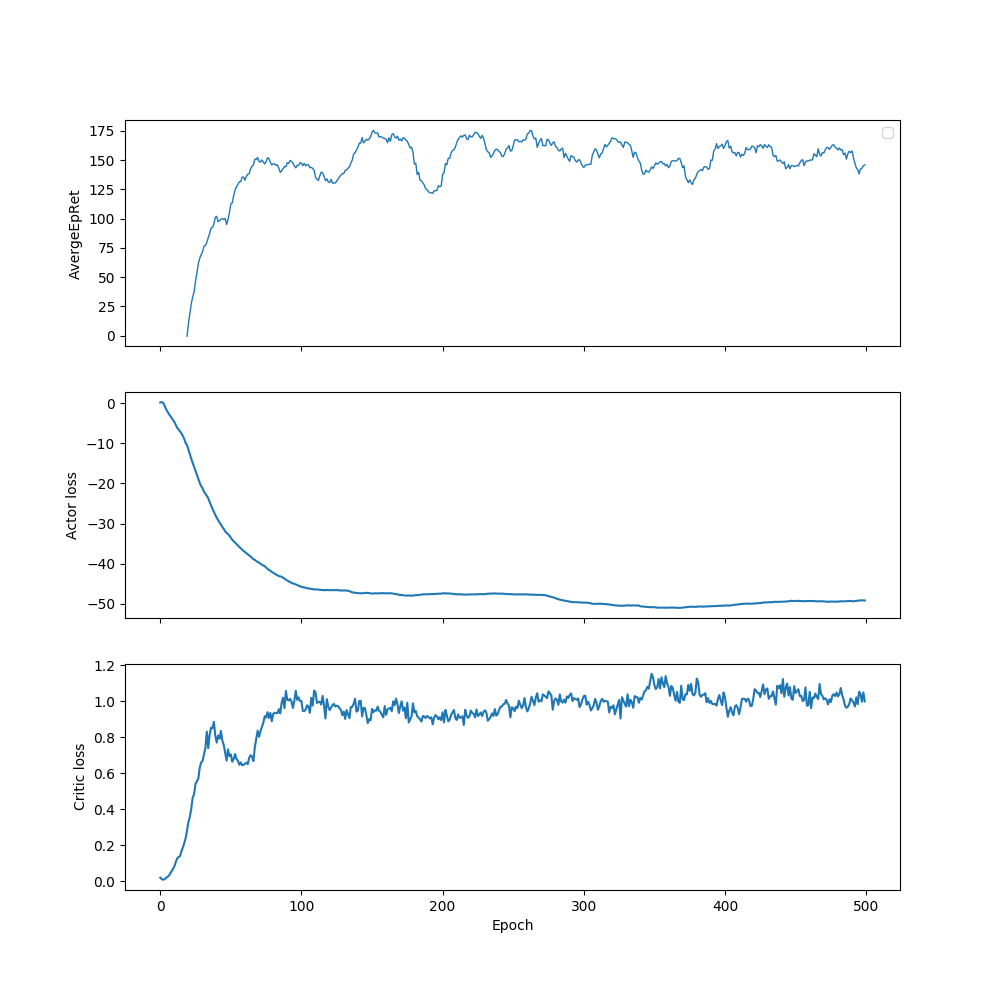

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


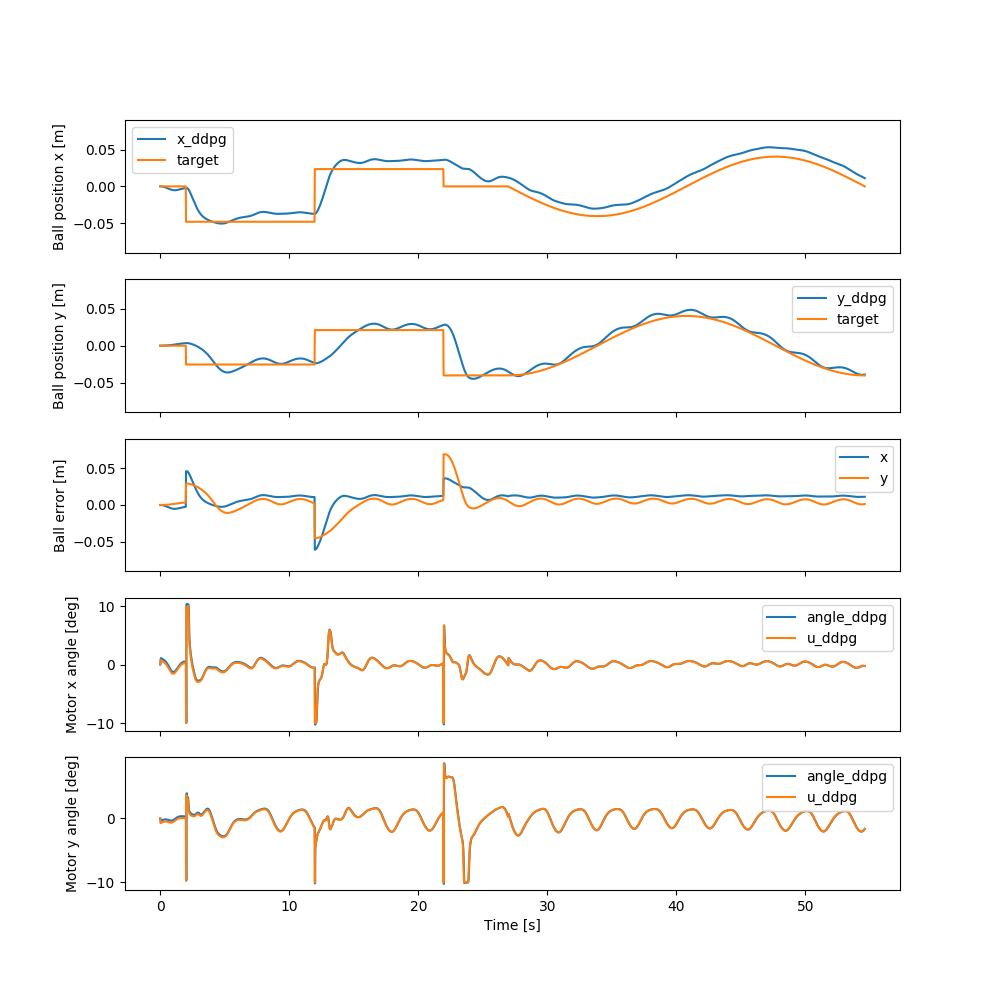

In [40]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	500,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd46188f2b0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[100,50,25]_sigmoid_long/prog

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -45.9 |
|          StdEpRet |            14.1 |
|          MaxEpRet |             -26 |
|          MinEpRet |           -57.7 |
|  AverageTestEpRet |            71.5 |
|      StdTestEpRet |            26.8 |
|      MaxTestEpRet |             116 |
|      MinTestEpRet |            31.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            1.61 |
|          StdQVals |            2.86 |
|          MaxQVals |            8.27 |
|          MinQVals |            -2.6 |
|            LossPi |           -1.82 |
|             LossQ |          0.0284 |
|              Time |            71.7 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -49.3 |
|          StdEpRet |            6.32 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            56.7 |
|          StdEpRet |            2.27 |
|          MaxEpRet |            58.9 |
|          MinEpRet |            54.4 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            50.3 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            19.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            6.12 |
|          StdQVals |            6.25 |
|          MaxQVals |            19.9 |
|          MinQVals |           -4.56 |
|            LossPi |            -6.3 |
|             LossQ |          0.0812 |
|              Time |             189 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            99.9 |
|          StdEpRet |            57.5 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            22.2 |
|          StdEpRet |            75.3 |
|          MaxEpRet |             121 |
|          MinEpRet |           -61.4 |
|  AverageTestEpRet |            66.5 |
|      StdTestEpRet |            53.3 |
|      MaxTestEpRet |             157 |
|      MinTestEpRet |           -21.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            12.4 |
|          StdQVals |            10.6 |
|          MaxQVals |            31.1 |
|          MinQVals |            -6.5 |
|            LossPi |           -12.6 |
|             LossQ |            0.27 |
|              Time |             311 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |              85 |
|          StdEpRet |            36.7 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             203 |
|          StdEpRet |            11.5 |
|          MaxEpRet |             215 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            43.8 |
|      MaxTestEpRet |             201 |
|      MinTestEpRet |           -4.15 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            19.8 |
|          StdQVals |            14.4 |
|          MaxQVals |            38.4 |
|          MinQVals |           -6.97 |
|            LossPi |           -20.1 |
|             LossQ |            0.47 |
|              Time |             435 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             127 |
|          StdEpRet |            31.6 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            74.9 |
|          StdEpRet |            90.4 |
|          MaxEpRet |             169 |
|          MinEpRet |             -47 |
|  AverageTestEpRet |            83.6 |
|      StdTestEpRet |            88.7 |
|      MaxTestEpRet |             198 |
|      MinTestEpRet |           -89.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            25.8 |
|          StdQVals |            15.7 |
|          MaxQVals |            43.4 |
|          MinQVals |           -9.42 |
|            LossPi |             -26 |
|             LossQ |           0.502 |
|              Time |             557 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |           -5.54 |
|          StdEpRet |            82.4 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             134 |
|          StdEpRet |            16.7 |
|          MaxEpRet |             151 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             120 |
|      StdTestEpRet |            66.9 |
|      MaxTestEpRet |             202 |
|      MinTestEpRet |           -32.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            29.3 |
|          StdQVals |            15.7 |
|          MaxQVals |            46.4 |
|          MinQVals |            -9.5 |
|            LossPi |           -29.5 |
|             LossQ |           0.583 |
|              Time |             676 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             107 |
|          StdEpRet |            49.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             119 |
|          StdEpRet |            22.1 |
|          MaxEpRet |             145 |
|          MinEpRet |            90.7 |
|  AverageTestEpRet |            87.8 |
|      StdTestEpRet |            78.6 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |           -45.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            31.8 |
|          StdQVals |              15 |
|          MaxQVals |            48.4 |
|          MinQVals |             -10 |
|            LossPi |           -31.9 |
|             LossQ |           0.578 |
|              Time |             797 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             140 |
|          StdEpRet |            29.9 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             173 |
|          StdEpRet |            2.65 |
|          MaxEpRet |             176 |
|          MinEpRet |             171 |
|  AverageTestEpRet |             127 |
|      StdTestEpRet |            33.6 |
|      MaxTestEpRet |             179 |
|      MinTestEpRet |            6.44 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            33.3 |
|          StdQVals |            14.5 |
|          MaxQVals |            50.4 |
|          MinQVals |           -10.9 |
|            LossPi |           -33.5 |
|             LossQ |           0.718 |
|              Time |             915 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            67.8 |
|          StdEpRet |            80.9 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             155 |
|          StdEpRet |            16.7 |
|          MaxEpRet |             178 |
|          MinEpRet |             141 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            63.2 |
|      MaxTestEpRet |             199 |
|      MinTestEpRet |            -111 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |              35 |
|          StdQVals |            14.6 |
|          MaxQVals |            52.2 |
|          MinQVals |           -10.1 |
|            LossPi |           -35.2 |
|             LossQ |           0.729 |
|              Time |        1.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             174 |
|          StdEpRet |            6.96 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             157 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             188 |
|          MinEpRet |             126 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            43.6 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |              70 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            36.3 |
|          StdQVals |            14.6 |
|          MaxQVals |            52.9 |
|          MinQVals |           -10.6 |
|            LossPi |           -36.4 |
|             LossQ |           0.764 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            85.7 |
|          StdEpRet |            85.1 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             164 |
|          StdEpRet |            44.8 |
|          MaxEpRet |             224 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            48.3 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            58.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            37.2 |
|          StdQVals |            14.9 |
|          MaxQVals |            53.4 |
|          MinQVals |           -11.5 |
|            LossPi |           -37.4 |
|             LossQ |           0.921 |
|              Time |        1.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             111 |
|          StdEpRet |             132 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             111 |
|          StdEpRet |              48 |
|          MaxEpRet |             159 |
|          MinEpRet |            63.4 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            55.4 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |            2.87 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            38.2 |
|          StdQVals |            14.9 |
|          MaxQVals |            53.5 |
|          MinQVals |           -13.5 |
|            LossPi |           -38.4 |
|             LossQ |           0.958 |
|              Time |         1.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             165 |
|          StdEpRet |            5.72 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             150 |
|          StdEpRet |            11.1 |
|          MaxEpRet |             164 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            63.6 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -73.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |              39 |
|          StdQVals |            14.6 |
|          MaxQVals |            53.2 |
|          MinQVals |           -14.9 |
|            LossPi |           -39.1 |
|             LossQ |           0.884 |
|              Time |        1.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             170 |
|          StdEpRet |            40.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            65.3 |
|          StdEpRet |             113 |
|          MaxEpRet |             178 |
|          MinEpRet |           -47.8 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            46.6 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |            41.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            39.5 |
|          StdQVals |            14.2 |
|          MaxQVals |            53.4 |
|          MinQVals |           -14.9 |
|            LossPi |           -39.6 |
|             LossQ |           0.823 |
|              Time |        1.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             178 |
|          StdEpRet |            18.6 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             140 |
|          StdEpRet |            31.9 |
|          MaxEpRet |             185 |
|          MinEpRet |             114 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            38.6 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |            51.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            39.8 |
|          StdQVals |            14.3 |
|          MaxQVals |            53.2 |
|          MinQVals |             -15 |
|            LossPi |           -39.9 |
|             LossQ |           0.854 |
|              Time |        1.77e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             152 |
|          StdEpRet |            48.3 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             155 |
|          StdEpRet |            27.1 |
|          MaxEpRet |             182 |
|          MinEpRet |             128 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            67.8 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |           -58.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            40.1 |
|          StdQVals |            14.4 |
|          MaxQVals |            53.6 |
|          MinQVals |           -15.9 |
|            LossPi |           -40.2 |
|             LossQ |           0.875 |
|              Time |        1.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             195 |
|          StdEpRet |            17.3 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             142 |
|          StdEpRet |            13.2 |
|          MaxEpRet |             159 |
|          MinEpRet |             126 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |            67.8 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            -116 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            40.4 |
|          StdQVals |            14.7 |
|          MaxQVals |            53.8 |
|          MinQVals |           -19.1 |
|            LossPi |           -40.5 |
|             LossQ |           0.901 |
|              Time |        2.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             167 |
|          StdEpRet |            55.6 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             147 |
|          StdEpRet |            38.2 |
|          MaxEpRet |             185 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             186 |
|      StdTestEpRet |              39 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |            99.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |              41 |
|          StdQVals |            14.6 |
|          MaxQVals |            54.4 |
|          MinQVals |           -20.4 |
|            LossPi |           -41.1 |
|             LossQ |           0.899 |
|              Time |        2.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            86.9 |
|          StdEpRet |            38.9 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             158 |
|          StdEpRet |            25.8 |
|          MaxEpRet |             188 |
|          MinEpRet |             125 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |             101 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            -132 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            41.6 |
|          StdQVals |            14.2 |
|          MaxQVals |            54.7 |
|          MinQVals |           -20.6 |
|            LossPi |           -41.7 |
|             LossQ |           0.937 |
|              Time |        2.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             145 |
|          StdEpRet |              52 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |              66 |
|          StdEpRet |            50.3 |
|          MaxEpRet |             116 |
|          MinEpRet |            15.7 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            58.5 |
|      MaxTestEpRet |             210 |
|      MinTestEpRet |              14 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |              42 |
|          StdQVals |            13.9 |
|          MaxQVals |              55 |
|          MinQVals |           -20.5 |
|            LossPi |           -42.2 |
|             LossQ |           0.918 |
|              Time |        2.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |            84.7 |
|          StdEpRet |            67.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             169 |
|          StdEpRet |            60.7 |
|          MaxEpRet |             240 |
|          MinEpRet |            91.3 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            47.3 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            51.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            42.2 |
|          StdQVals |            13.9 |
|          MaxQVals |            55.2 |
|          MinQVals |           -17.6 |
|            LossPi |           -42.3 |
|             LossQ |            1.01 |
|              Time |        2.49e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             121 |
|          StdEpRet |            50.4 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             131 |
|          StdEpRet |             3.4 |
|          MaxEpRet |             134 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            92.3 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |           -79.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |              43 |
|          StdQVals |              14 |
|          MaxQVals |            55.7 |
|          MinQVals |           -18.8 |
|            LossPi |           -43.1 |
|             LossQ |            1.07 |
|              Time |        2.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |            94.4 |
|          StdEpRet |            69.5 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             161 |
|          StdEpRet |            13.8 |
|          MaxEpRet |             174 |
|          MinEpRet |             142 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            46.6 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |            56.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            43.4 |
|          StdQVals |            14.3 |
|          MaxQVals |              56 |
|          MinQVals |           -19.4 |
|            LossPi |           -43.5 |
|             LossQ |            1.05 |
|              Time |        2.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             180 |
|          StdEpRet |            25.8 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             179 |
|          StdEpRet |            4.47 |
|          MaxEpRet |             184 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            70.6 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |           -82.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              44 |
|          StdQVals |            14.1 |
|          MaxQVals |            56.1 |
|          MinQVals |           -18.1 |
|            LossPi |           -44.1 |
|             LossQ |            1.01 |
|              Time |        2.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             185 |
|          StdEpRet |            27.9 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             172 |
|          StdEpRet |            68.3 |
|          MaxEpRet |             259 |
|          MinEpRet |            92.5 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            95.3 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -93.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            43.9 |
|          StdQVals |            13.8 |
|          MaxQVals |            55.9 |
|          MinQVals |           -18.2 |
|            LossPi |             -44 |
|             LossQ |           0.978 |
|              Time |        2.96e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             181 |
|          StdEpRet |            19.5 |


---------------------------------------
|             Epoch |             257 |
|      AverageEpRet |             148 |
|          StdEpRet |              14 |
|          MaxEpRet |             162 |
|          MinEpRet |             134 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            30.9 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |             117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.83e+05 |
|      AverageQVals |            43.9 |
|          StdQVals |            13.8 |
|          MaxQVals |            55.8 |
|          MinQVals |           -20.3 |
|            LossPi |             -44 |
|             LossQ |            1.02 |
|              Time |        3.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             258 |
|      AverageEpRet |             160 |
|          StdEpRet |            23.8 |


---------------------------------------
|             Epoch |             267 |
|      AverageEpRet |             134 |
|          StdEpRet |             103 |
|          MaxEpRet |             218 |
|          MinEpRet |           -10.7 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            45.1 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |            62.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.94e+05 |
|      AverageQVals |            43.7 |
|          StdQVals |              14 |
|          MaxQVals |            55.6 |
|          MinQVals |           -20.9 |
|            LossPi |           -43.8 |
|             LossQ |             1.1 |
|              Time |        3.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             268 |
|      AverageEpRet |            98.8 |
|          StdEpRet |            91.8 |


---------------------------------------
|             Epoch |             277 |
|      AverageEpRet |             166 |
|          StdEpRet |            11.6 |
|          MaxEpRet |             178 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             166 |
|      StdTestEpRet |            40.9 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |            77.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.05e+05 |
|      AverageQVals |              44 |
|          StdQVals |            13.9 |
|          MaxQVals |            55.8 |
|          MinQVals |             -22 |
|            LossPi |           -44.1 |
|             LossQ |            1.06 |
|              Time |        3.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             278 |
|      AverageEpRet |             159 |
|          StdEpRet |            9.55 |


---------------------------------------
|             Epoch |             287 |
|      AverageEpRet |            22.4 |
|          StdEpRet |            50.3 |
|          MaxEpRet |            87.3 |
|          MinEpRet |           -35.2 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            48.8 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            42.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.16e+05 |
|      AverageQVals |            45.3 |
|          StdQVals |            12.7 |
|          MaxQVals |            56.1 |
|          MinQVals |           -23.9 |
|            LossPi |           -45.4 |
|             LossQ |            1.09 |
|              Time |        3.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             288 |
|      AverageEpRet |             155 |
|          StdEpRet |            55.4 |


---------------------------------------
|             Epoch |             297 |
|      AverageEpRet |             180 |
|          StdEpRet |            2.77 |
|          MaxEpRet |             183 |
|          MinEpRet |             177 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |            75.2 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -70.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.27e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            12.4 |
|          MaxQVals |              56 |
|          MinQVals |           -18.4 |
|            LossPi |           -45.9 |
|             LossQ |            1.05 |
|              Time |        3.58e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             298 |
|      AverageEpRet |             207 |
|          StdEpRet |            11.4 |


---------------------------------------
|             Epoch |             307 |
|      AverageEpRet |            82.2 |
|          StdEpRet |            34.6 |
|          MaxEpRet |             108 |
|          MinEpRet |            33.2 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            63.7 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |              22 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.38e+05 |
|      AverageQVals |            46.4 |
|          StdQVals |            11.8 |
|          MaxQVals |            56.3 |
|          MinQVals |           -18.5 |
|            LossPi |           -46.5 |
|             LossQ |            1.05 |
|              Time |         3.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             308 |
|      AverageEpRet |             123 |
|          StdEpRet |            56.7 |


---------------------------------------
|             Epoch |             317 |
|      AverageEpRet |             125 |
|          StdEpRet |           0.723 |
|          MaxEpRet |             126 |
|          MinEpRet |             125 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            53.8 |
|      MaxTestEpRet |             207 |
|      MinTestEpRet |           -3.89 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.49e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            11.5 |
|          MaxQVals |            56.4 |
|          MinQVals |           -23.6 |
|            LossPi |             -47 |
|             LossQ |            1.07 |
|              Time |        3.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             318 |
|      AverageEpRet |             172 |
|          StdEpRet |            37.9 |


---------------------------------------
|             Epoch |             327 |
|      AverageEpRet |             127 |
|          StdEpRet |              73 |
|          MaxEpRet |             230 |
|          MinEpRet |              71 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            72.4 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           -90.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.6e+05 |
|      AverageQVals |            47.3 |
|          StdQVals |            11.2 |
|          MaxQVals |            56.4 |
|          MinQVals |           -25.1 |
|            LossPi |           -47.4 |
|             LossQ |           0.988 |
|              Time |        3.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             328 |
|      AverageEpRet |             102 |
|          StdEpRet |             115 |


---------------------------------------
|             Epoch |             337 |
|      AverageEpRet |             210 |
|          StdEpRet |            22.7 |
|          MaxEpRet |             233 |
|          MinEpRet |             188 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            86.3 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -79.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.71e+05 |
|      AverageQVals |            47.4 |
|          StdQVals |            11.4 |
|          MaxQVals |            56.2 |
|          MinQVals |           -27.4 |
|            LossPi |           -47.5 |
|             LossQ |            1.04 |
|              Time |        4.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             338 |
|      AverageEpRet |             168 |
|          StdEpRet |            38.5 |


---------------------------------------
|             Epoch |             347 |
|      AverageEpRet |             151 |
|          StdEpRet |            31.9 |
|          MaxEpRet |             191 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |             108 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            -132 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.82e+05 |
|      AverageQVals |            47.9 |
|          StdQVals |            10.9 |
|          MaxQVals |            56.2 |
|          MinQVals |           -32.9 |
|            LossPi |             -48 |
|             LossQ |           0.933 |
|              Time |        4.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             348 |
|      AverageEpRet |             135 |
|          StdEpRet |            23.5 |


---------------------------------------
|             Epoch |             357 |
|      AverageEpRet |              94 |
|          StdEpRet |              90 |
|          MaxEpRet |             184 |
|          MinEpRet |            3.97 |
|  AverageTestEpRet |             166 |
|      StdTestEpRet |              62 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            22.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.93e+05 |
|      AverageQVals |            48.1 |
|          StdQVals |              11 |
|          MaxQVals |            56.6 |
|          MinQVals |           -37.5 |
|            LossPi |           -48.2 |
|             LossQ |           0.911 |
|              Time |         4.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             358 |
|      AverageEpRet |             171 |
|          StdEpRet |            66.2 |


---------------------------------------
|             Epoch |             367 |
|      AverageEpRet |             159 |
|          StdEpRet |            46.6 |
|          MaxEpRet |             198 |
|          MinEpRet |            93.6 |
|  AverageTestEpRet |             123 |
|      StdTestEpRet |            94.4 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |            -153 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.04e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |              11 |
|          MaxQVals |            56.6 |
|          MinQVals |           -38.3 |
|            LossPi |           -48.3 |
|             LossQ |           0.975 |
|              Time |        4.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             368 |
|      AverageEpRet |             152 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             377 |
|      AverageEpRet |             135 |
|          StdEpRet |            7.72 |
|          MaxEpRet |             142 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |            96.2 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            -133 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.15e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |              11 |
|          MaxQVals |            56.8 |
|          MinQVals |           -32.6 |
|            LossPi |           -48.3 |
|             LossQ |            1.03 |
|              Time |        4.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             378 |
|      AverageEpRet |             132 |
|          StdEpRet |            28.9 |


---------------------------------------
|             Epoch |             387 |
|      AverageEpRet |             182 |
|          StdEpRet |            37.8 |
|          MaxEpRet |             233 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            69.2 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -73.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.26e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |            10.8 |
|          MaxQVals |            56.6 |
|          MinQVals |             -29 |
|            LossPi |           -48.3 |
|             LossQ |            1.02 |
|              Time |        4.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             388 |
|      AverageEpRet |             131 |
|          StdEpRet |            16.4 |


---------------------------------------
|             Epoch |             397 |
|      AverageEpRet |             115 |
|          StdEpRet |            55.6 |
|          MaxEpRet |             171 |
|          MinEpRet |            59.9 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            81.3 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            -118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.37e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |              11 |
|          MaxQVals |            56.8 |
|          MinQVals |           -28.5 |
|            LossPi |           -48.3 |
|             LossQ |            1.02 |
|              Time |        4.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             398 |
|      AverageEpRet |             157 |
|          StdEpRet |              66 |


---------------------------------------
|             Epoch |             407 |
|      AverageEpRet |             212 |
|          StdEpRet |            25.2 |
|          MaxEpRet |             247 |
|          MinEpRet |             190 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |              76 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            -102 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.48e+05 |
|      AverageQVals |            48.3 |
|          StdQVals |            11.4 |
|          MaxQVals |            57.1 |
|          MinQVals |           -30.2 |
|            LossPi |           -48.4 |
|             LossQ |            1.01 |
|              Time |         4.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             408 |
|      AverageEpRet |             168 |
|          StdEpRet |              36 |


---------------------------------------
|             Epoch |             417 |
|      AverageEpRet |             195 |
|          StdEpRet |            2.89 |
|          MaxEpRet |             198 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |              81 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |           -13.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.59e+05 |
|      AverageQVals |            48.4 |
|          StdQVals |            11.6 |
|          MaxQVals |            57.3 |
|          MinQVals |           -30.4 |
|            LossPi |           -48.5 |
|             LossQ |            1.04 |
|              Time |        5.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             418 |
|      AverageEpRet |             163 |
|          StdEpRet |            63.8 |


---------------------------------------
|             Epoch |             427 |
|      AverageEpRet |            48.7 |
|          StdEpRet |            99.6 |
|          MaxEpRet |             156 |
|          MinEpRet |           -84.2 |
|  AverageTestEpRet |             122 |
|      StdTestEpRet |              89 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -79.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         4.7e+05 |
|      AverageQVals |            48.4 |
|          StdQVals |              12 |
|          MaxQVals |            57.3 |
|          MinQVals |           -31.1 |
|            LossPi |           -48.4 |
|             LossQ |            1.14 |
|              Time |        5.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             428 |
|      AverageEpRet |             193 |
|          StdEpRet |            19.2 |


---------------------------------------
|             Epoch |             437 |
|      AverageEpRet |             174 |
|          StdEpRet |           0.554 |
|          MaxEpRet |             175 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |             104 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |            -112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.81e+05 |
|      AverageQVals |            48.4 |
|          StdQVals |            12.1 |
|          MaxQVals |            57.3 |
|          MinQVals |           -35.9 |
|            LossPi |           -48.5 |
|             LossQ |            1.06 |
|              Time |        5.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             438 |
|      AverageEpRet |             174 |
|          StdEpRet |            11.4 |


---------------------------------------
|             Epoch |             447 |
|      AverageEpRet |             141 |
|          StdEpRet |            41.8 |
|          MaxEpRet |             198 |
|          MinEpRet |            99.7 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |             112 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -93.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.92e+05 |
|      AverageQVals |            48.8 |
|          StdQVals |            12.1 |
|          MaxQVals |            57.7 |
|          MinQVals |           -34.2 |
|            LossPi |           -48.9 |
|             LossQ |            1.15 |
|              Time |        5.39e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             448 |
|      AverageEpRet |             186 |
|          StdEpRet |            33.3 |


---------------------------------------
|             Epoch |             457 |
|      AverageEpRet |             170 |
|          StdEpRet |            25.5 |
|          MaxEpRet |             195 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            70.4 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -84.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.03e+05 |
|      AverageQVals |              49 |
|          StdQVals |            11.7 |
|          MaxQVals |            57.7 |
|          MinQVals |           -33.7 |
|            LossPi |           -49.1 |
|             LossQ |             1.1 |
|              Time |        5.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             458 |
|      AverageEpRet |             113 |
|          StdEpRet |            45.3 |


---------------------------------------
|             Epoch |             467 |
|      AverageEpRet |           -36.6 |
|          StdEpRet |            71.2 |
|          MaxEpRet |            60.6 |
|          MinEpRet |            -108 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            71.4 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |           -85.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.14e+05 |
|      AverageQVals |              49 |
|          StdQVals |            12.1 |
|          MaxQVals |            58.5 |
|          MinQVals |           -34.4 |
|            LossPi |           -49.1 |
|             LossQ |            1.18 |
|              Time |        5.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             468 |
|      AverageEpRet |             160 |
|          StdEpRet |            6.63 |


---------------------------------------
|             Epoch |             477 |
|      AverageEpRet |             178 |
|          StdEpRet |            20.8 |
|          MaxEpRet |             199 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            90.7 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |           -80.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.25e+05 |
|      AverageQVals |              49 |
|          StdQVals |            12.3 |
|          MaxQVals |            58.2 |
|          MinQVals |           -35.9 |
|            LossPi |           -49.1 |
|             LossQ |            1.15 |
|              Time |        5.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             478 |
|      AverageEpRet |             181 |
|          StdEpRet |            54.8 |


---------------------------------------
|             Epoch |             487 |
|      AverageEpRet |             164 |
|          StdEpRet |            30.9 |
|          MaxEpRet |             202 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |             107 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |           -97.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.36e+05 |
|      AverageQVals |            48.7 |
|          StdQVals |            12.5 |
|          MaxQVals |            58.2 |
|          MinQVals |           -38.8 |
|            LossPi |           -48.8 |
|             LossQ |            1.13 |
|              Time |        5.88e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             488 |
|      AverageEpRet |             136 |
|          StdEpRet |            60.4 |


---------------------------------------
|             Epoch |             497 |
|      AverageEpRet |             179 |
|          StdEpRet |            7.54 |
|          MaxEpRet |             187 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            83.4 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |             -43 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.47e+05 |
|      AverageQVals |            48.7 |
|          StdQVals |            12.2 |
|          MaxQVals |              58 |
|          MinQVals |           -42.5 |
|            LossPi |           -48.8 |
|             LossQ |            1.17 |
|              Time |           6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             498 |
|      AverageEpRet |             202 |
|          StdEpRet |            24.5 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00026933498056303846


<IPython.core.display.Javascript object>


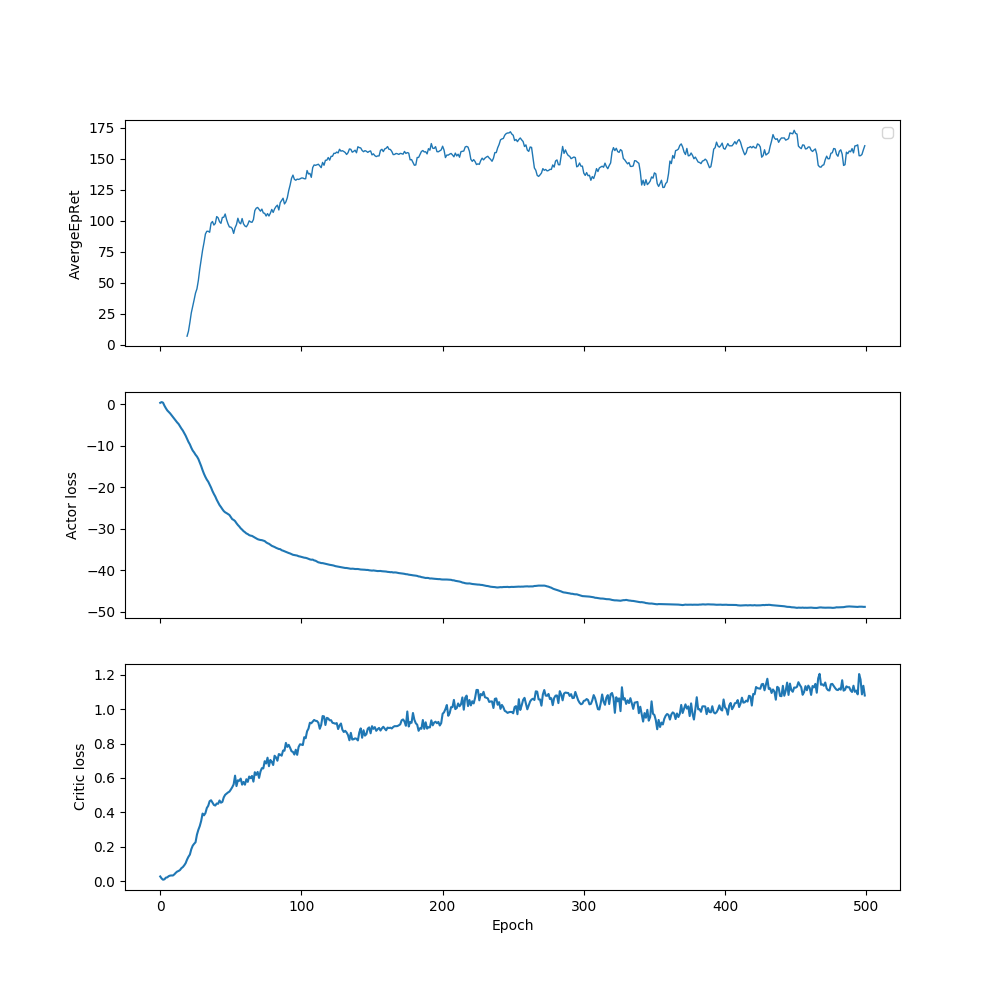

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


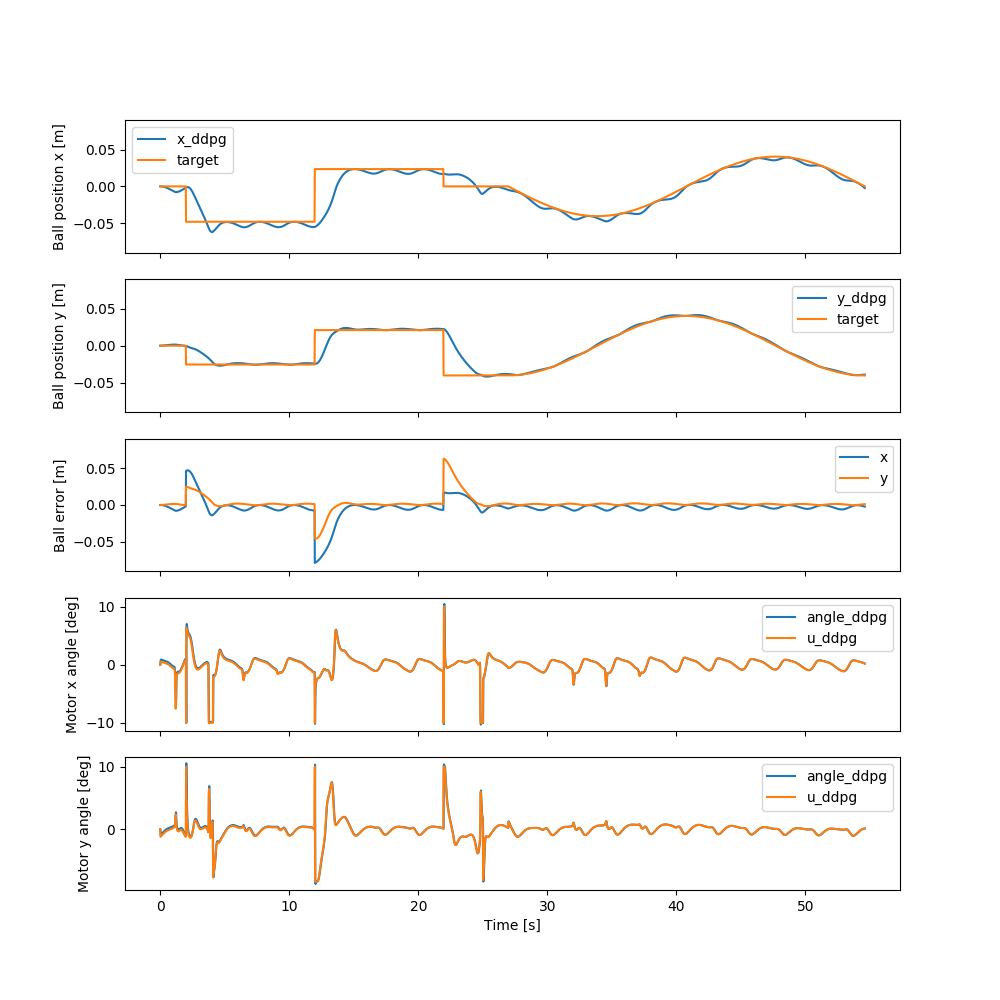

In [41]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	500,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fd450213908>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller_no_integral/exploratory_penality/lep_0.6_[200,100,50]_sigmoid_long/

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -34.8 |
|          StdEpRet |            15.1 |
|          MaxEpRet |           -14.7 |
|          MinEpRet |           -51.3 |
|  AverageTestEpRet |              65 |
|      StdTestEpRet |            18.2 |
|      MaxTestEpRet |             101 |
|      MinTestEpRet |            34.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.44 |
|          StdQVals |            3.23 |
|          MaxQVals |            12.4 |
|          MinQVals |           -1.68 |
|            LossPi |           -3.64 |
|             LossQ |          0.0441 |
|              Time |             111 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -40.6 |
|          StdEpRet |            15.2 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             184 |
|          StdEpRet |            1.34 |
|          MaxEpRet |             186 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            67.4 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |           -33.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            8.35 |
|          StdQVals |            7.91 |
|          MaxQVals |            26.2 |
|          MinQVals |           -5.24 |
|            LossPi |           -8.56 |
|             LossQ |           0.149 |
|              Time |             291 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |              96 |
|          StdEpRet |            88.2 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             165 |
|          StdEpRet |            39.3 |
|          MaxEpRet |             206 |
|          MinEpRet |             112 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            78.5 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -68.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            17.9 |
|          StdQVals |            13.6 |
|          MaxQVals |            38.1 |
|          MinQVals |           -17.6 |
|            LossPi |           -18.1 |
|             LossQ |           0.374 |
|              Time |             476 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             150 |
|          StdEpRet |            12.4 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             142 |
|          StdEpRet |            2.22 |
|          MaxEpRet |             145 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            59.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -36.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            26.2 |
|          StdQVals |              15 |
|          MaxQVals |            45.2 |
|          MinQVals |           -18.8 |
|            LossPi |           -26.4 |
|             LossQ |            0.54 |
|              Time |             653 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             110 |
|          StdEpRet |             120 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             157 |
|          StdEpRet |            26.7 |
|          MaxEpRet |             184 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             134 |
|      StdTestEpRet |            70.9 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |             -59 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            32.5 |
|          StdQVals |            15.2 |
|          MaxQVals |            48.9 |
|          MinQVals |           -7.61 |
|            LossPi |           -32.7 |
|             LossQ |           0.607 |
|              Time |             834 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            70.5 |
|          StdEpRet |            78.2 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             152 |
|          StdEpRet |            7.75 |
|          MaxEpRet |             160 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            48.4 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            9.11 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            35.9 |
|          StdQVals |            14.7 |
|          MaxQVals |            51.6 |
|          MinQVals |           -12.1 |
|            LossPi |           -36.1 |
|             LossQ |           0.656 |
|              Time |        1.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             126 |
|          StdEpRet |            46.7 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            92.2 |
|          StdEpRet |            87.2 |
|          MaxEpRet |             166 |
|          MinEpRet |           -30.3 |
|  AverageTestEpRet |             103 |
|      StdTestEpRet |            78.8 |
|      MaxTestEpRet |             187 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            37.7 |
|          StdQVals |            14.6 |
|          MaxQVals |            53.2 |
|          MinQVals |           -15.3 |
|            LossPi |           -37.9 |
|             LossQ |           0.711 |
|              Time |         1.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             176 |
|          StdEpRet |            22.6 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             182 |
|          StdEpRet |            9.27 |
|          MaxEpRet |             191 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            63.1 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |           -86.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            39.5 |
|          StdQVals |            14.6 |
|          MaxQVals |            54.7 |
|          MinQVals |             -18 |
|            LossPi |           -39.7 |
|             LossQ |           0.707 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            17.1 |
|          StdEpRet |             106 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |            53.4 |
|          StdEpRet |            93.5 |
|          MaxEpRet |             184 |
|          MinEpRet |           -31.8 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            55.6 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |           -28.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            40.7 |
|          StdQVals |            14.9 |
|          MaxQVals |            56.1 |
|          MinQVals |           -22.1 |
|            LossPi |           -40.9 |
|             LossQ |           0.748 |
|              Time |        1.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             152 |
|          StdEpRet |            23.6 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            73.6 |
|          StdEpRet |              56 |
|          MaxEpRet |             130 |
|          MinEpRet |            17.6 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            30.1 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |            98.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            41.6 |
|          StdQVals |            14.8 |
|          MaxQVals |            56.2 |
|          MinQVals |           -24.6 |
|            LossPi |           -41.8 |
|             LossQ |           0.745 |
|              Time |        1.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             -10 |
|          StdEpRet |              65 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             194 |
|          StdEpRet |            13.9 |
|          MaxEpRet |             209 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            62.2 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |           -17.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            42.1 |
|          StdQVals |            14.6 |
|          MaxQVals |            56.7 |
|          MinQVals |           -19.6 |
|            LossPi |           -42.3 |
|             LossQ |           0.672 |
|              Time |        1.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             111 |
|          StdEpRet |              43 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             148 |
|          StdEpRet |            57.1 |
|          MaxEpRet |             205 |
|          MinEpRet |            90.9 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |              65 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |          -0.494 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            42.7 |
|          StdQVals |            14.1 |
|          MaxQVals |            56.9 |
|          MinQVals |           -12.7 |
|            LossPi |           -42.8 |
|             LossQ |           0.791 |
|              Time |        2.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            74.5 |
|          StdEpRet |            58.7 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             124 |
|          StdEpRet |            52.2 |
|          MaxEpRet |             171 |
|          MinEpRet |            51.3 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            56.1 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            12.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            42.8 |
|          StdQVals |              14 |
|          MaxQVals |            56.6 |
|          MinQVals |           -11.2 |
|            LossPi |             -43 |
|             LossQ |           0.776 |
|              Time |        2.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             166 |
|          StdEpRet |            38.9 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            96.2 |
|          StdEpRet |             141 |
|          MaxEpRet |             238 |
|          MinEpRet |           -45.1 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            67.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -62.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            43.2 |
|          StdQVals |            13.9 |
|          MaxQVals |            56.9 |
|          MinQVals |           -16.3 |
|            LossPi |           -43.3 |
|             LossQ |            0.76 |
|              Time |        2.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             163 |
|          StdEpRet |            7.99 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             173 |
|          StdEpRet |            20.7 |
|          MaxEpRet |             201 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             129 |
|      StdTestEpRet |            95.4 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |            -112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            43.5 |
|          StdQVals |              14 |
|          MaxQVals |              57 |
|          MinQVals |           -15.4 |
|            LossPi |           -43.7 |
|             LossQ |           0.813 |
|              Time |        2.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             173 |
|          StdEpRet |            14.1 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            91.4 |
|          StdEpRet |             116 |
|          MaxEpRet |             207 |
|          MinEpRet |           -24.4 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |             105 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            -113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            43.6 |
|          StdQVals |            14.3 |
|          MaxQVals |            56.7 |
|          MinQVals |           -19.2 |
|            LossPi |           -43.7 |
|             LossQ |           0.858 |
|              Time |        2.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |            97.2 |
|          StdEpRet |             122 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             189 |
|          StdEpRet |            9.85 |
|          MaxEpRet |             198 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            97.5 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -69.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            43.7 |
|          StdQVals |            14.4 |
|          MaxQVals |            56.7 |
|          MinQVals |           -25.2 |
|            LossPi |           -43.8 |
|             LossQ |           0.861 |
|              Time |           3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             189 |
|          StdEpRet |            19.9 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             155 |
|          StdEpRet |              18 |
|          MaxEpRet |             173 |
|          MinEpRet |             137 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            36.7 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            72.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            44.4 |
|          StdQVals |            13.7 |
|          MaxQVals |            56.7 |
|          MinQVals |           -16.3 |
|            LossPi |           -44.5 |
|             LossQ |           0.788 |
|              Time |        3.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             133 |
|          StdEpRet |              22 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             119 |
|          StdEpRet |            25.7 |
|          MaxEpRet |             144 |
|          MinEpRet |            83.5 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            77.8 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |           -67.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            44.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            56.6 |
|          MinQVals |           -16.6 |
|            LossPi |           -44.7 |
|             LossQ |           0.887 |
|              Time |        3.36e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             156 |
|          StdEpRet |            38.6 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             158 |
|          StdEpRet |            35.3 |
|          MaxEpRet |             193 |
|          MinEpRet |             122 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            64.1 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |           -19.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |              45 |
|          StdQVals |            13.5 |
|          MaxQVals |            56.7 |
|          MinQVals |           -20.2 |
|            LossPi |           -45.1 |
|             LossQ |           0.884 |
|              Time |        3.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             178 |
|          StdEpRet |            18.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             132 |
|          StdEpRet |            77.2 |
|          MaxEpRet |             241 |
|          MinEpRet |            68.4 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            74.8 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            45.1 |
|          StdQVals |            13.5 |
|          MaxQVals |            56.8 |
|          MinQVals |           -16.3 |
|            LossPi |           -45.2 |
|             LossQ |           0.896 |
|              Time |        3.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             134 |
|          StdEpRet |            64.6 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             163 |
|          StdEpRet |            33.9 |
|          MaxEpRet |             197 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |              73 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |           -74.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            45.3 |
|          StdQVals |            13.6 |
|          MaxQVals |            56.9 |
|          MinQVals |           -21.4 |
|            LossPi |           -45.4 |
|             LossQ |           0.938 |
|              Time |        3.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             136 |
|          StdEpRet |            15.3 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             178 |
|          StdEpRet |            44.4 |
|          MaxEpRet |             220 |
|          MinEpRet |             116 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            79.1 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |           -69.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            45.6 |
|          StdQVals |            13.5 |
|          MaxQVals |            56.7 |
|          MinQVals |           -25.2 |
|            LossPi |           -45.8 |
|             LossQ |           0.952 |
|              Time |        4.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             185 |
|          StdEpRet |            36.3 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             167 |
|          StdEpRet |            9.88 |
|          MaxEpRet |             177 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            56.9 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |            9.22 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            13.5 |
|          MaxQVals |            56.4 |
|          MinQVals |           -24.3 |
|            LossPi |             -46 |
|             LossQ |           0.894 |
|              Time |        4.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |              90 |
|          StdEpRet |            80.1 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             128 |
|          StdEpRet |            35.2 |
|          MaxEpRet |             173 |
|          MinEpRet |            86.9 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            56.5 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |              21 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            45.8 |
|          StdQVals |            13.8 |
|          MaxQVals |            56.6 |
|          MinQVals |           -28.3 |
|            LossPi |           -45.9 |
|             LossQ |           0.913 |
|              Time |        4.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             185 |
|          StdEpRet |            27.1 |


---------------------------------------
|             Epoch |             257 |
|      AverageEpRet |             147 |
|          StdEpRet |            36.3 |
|          MaxEpRet |             183 |
|          MinEpRet |             110 |
|  AverageTestEpRet |             184 |
|      StdTestEpRet |            28.2 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |             120 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.83e+05 |
|      AverageQVals |            45.9 |
|          StdQVals |            13.8 |
|          MaxQVals |            56.5 |
|          MinQVals |           -29.5 |
|            LossPi |             -46 |
|             LossQ |           0.889 |
|              Time |        4.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             258 |
|      AverageEpRet |             178 |
|          StdEpRet |            6.81 |


---------------------------------------
|             Epoch |             267 |
|      AverageEpRet |             153 |
|          StdEpRet |            39.8 |
|          MaxEpRet |             182 |
|          MinEpRet |            97.1 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            40.8 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            98.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.94e+05 |
|      AverageQVals |            46.1 |
|          StdQVals |            13.8 |
|          MaxQVals |            56.8 |
|          MinQVals |           -30.8 |
|            LossPi |           -46.2 |
|             LossQ |           0.893 |
|              Time |        4.92e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             268 |
|      AverageEpRet |             168 |
|          StdEpRet |            48.6 |


---------------------------------------
|             Epoch |             277 |
|      AverageEpRet |             176 |
|          StdEpRet |            9.65 |
|          MaxEpRet |             186 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |            27.8 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |             112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.05e+05 |
|      AverageQVals |            46.7 |
|          StdQVals |            13.3 |
|          MaxQVals |            57.2 |
|          MinQVals |           -29.7 |
|            LossPi |           -46.8 |
|             LossQ |           0.915 |
|              Time |        5.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             278 |
|      AverageEpRet |             173 |
|          StdEpRet |            30.9 |


---------------------------------------
|             Epoch |             287 |
|      AverageEpRet |             116 |
|          StdEpRet |             102 |
|          MaxEpRet |             197 |
|          MinEpRet |           -28.4 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            35.1 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |             121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.16e+05 |
|      AverageQVals |            47.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            57.4 |
|          MinQVals |           -24.4 |
|            LossPi |           -47.7 |
|             LossQ |            0.97 |
|              Time |        5.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             288 |
|      AverageEpRet |             160 |
|          StdEpRet |              23 |


---------------------------------------
|             Epoch |             297 |
|      AverageEpRet |            75.2 |
|          StdEpRet |            42.2 |
|          MaxEpRet |             117 |
|          MinEpRet |              33 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            63.9 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |           -59.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.27e+05 |
|      AverageQVals |            47.9 |
|          StdQVals |              12 |
|          MaxQVals |            57.2 |
|          MinQVals |           -18.7 |
|            LossPi |             -48 |
|             LossQ |            1.05 |
|              Time |        5.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             298 |
|      AverageEpRet |             181 |
|          StdEpRet |            23.4 |


---------------------------------------
|             Epoch |             307 |
|      AverageEpRet |             166 |
|          StdEpRet |            61.1 |
|          MaxEpRet |             225 |
|          MinEpRet |            82.1 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |             102 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            -103 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.38e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |            11.9 |
|          MaxQVals |            57.3 |
|          MinQVals |           -20.6 |
|            LossPi |           -48.3 |
|             LossQ |            1.05 |
|              Time |        5.64e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             308 |
|      AverageEpRet |             129 |
|          StdEpRet |            68.7 |


---------------------------------------
|             Epoch |             317 |
|      AverageEpRet |            65.5 |
|          StdEpRet |            97.6 |
|          MaxEpRet |             163 |
|          MinEpRet |           -32.1 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            72.1 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |           -74.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.49e+05 |
|      AverageQVals |            48.4 |
|          StdQVals |            11.5 |
|          MaxQVals |            57.2 |
|          MinQVals |           -22.1 |
|            LossPi |           -48.5 |
|             LossQ |            1.02 |
|              Time |        5.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             318 |
|      AverageEpRet |             126 |
|          StdEpRet |             143 |


---------------------------------------
|             Epoch |             327 |
|      AverageEpRet |             187 |
|          StdEpRet |             9.5 |
|          MaxEpRet |             200 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |            89.8 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |           -92.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.6e+05 |
|      AverageQVals |            48.5 |
|          StdQVals |            11.3 |
|          MaxQVals |            57.3 |
|          MinQVals |           -24.4 |
|            LossPi |           -48.6 |
|             LossQ |           0.932 |
|              Time |           6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             328 |
|      AverageEpRet |            88.3 |
|          StdEpRet |             112 |


---------------------------------------
|             Epoch |             337 |
|      AverageEpRet |             159 |
|          StdEpRet |              18 |
|          MaxEpRet |             177 |
|          MinEpRet |             141 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            68.8 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |           -90.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.71e+05 |
|      AverageQVals |            48.5 |
|          StdQVals |            11.4 |
|          MaxQVals |            57.3 |
|          MinQVals |             -31 |
|            LossPi |           -48.6 |
|             LossQ |               1 |
|              Time |        6.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             338 |
|      AverageEpRet |             172 |
|          StdEpRet |               7 |


---------------------------------------
|             Epoch |             347 |
|      AverageEpRet |             147 |
|          StdEpRet |            64.2 |
|          MaxEpRet |             200 |
|          MinEpRet |            56.3 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |              65 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           0.774 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.82e+05 |
|      AverageQVals |            48.9 |
|          StdQVals |            10.8 |
|          MaxQVals |            57.4 |
|          MinQVals |           -28.6 |
|            LossPi |             -49 |
|             LossQ |           0.991 |
|              Time |        6.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             348 |
|      AverageEpRet |             132 |
|          StdEpRet |            16.8 |


---------------------------------------
|             Epoch |             357 |
|      AverageEpRet |             177 |
|          StdEpRet |            21.3 |
|          MaxEpRet |             198 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |            61.7 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -22.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.93e+05 |
|      AverageQVals |              49 |
|          StdQVals |            10.8 |
|          MaxQVals |            57.4 |
|          MinQVals |           -28.5 |
|            LossPi |           -49.1 |
|             LossQ |           0.949 |
|              Time |        6.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             358 |
|      AverageEpRet |             201 |
|          StdEpRet |            23.5 |


---------------------------------------
|             Epoch |             367 |
|      AverageEpRet |             169 |
|          StdEpRet |            11.8 |
|          MaxEpRet |             185 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            75.5 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |           -85.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.04e+05 |
|      AverageQVals |            49.4 |
|          StdQVals |            10.5 |
|          MaxQVals |            58.1 |
|          MinQVals |           -38.6 |
|            LossPi |           -49.5 |
|             LossQ |            0.97 |
|              Time |        6.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             368 |
|      AverageEpRet |             165 |
|          StdEpRet |            23.1 |


---------------------------------------
|             Epoch |             377 |
|      AverageEpRet |             172 |
|          StdEpRet |            32.8 |
|          MaxEpRet |             205 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             120 |
|      StdTestEpRet |              82 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |             -56 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.15e+05 |
|      AverageQVals |            49.5 |
|          StdQVals |            10.7 |
|          MaxQVals |              58 |
|          MinQVals |             -23 |
|            LossPi |           -49.6 |
|             LossQ |           0.975 |
|              Time |         6.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             378 |
|      AverageEpRet |             114 |
|          StdEpRet |            21.9 |


---------------------------------------
|             Epoch |             387 |
|      AverageEpRet |             126 |
|          StdEpRet |              50 |
|          MaxEpRet |             164 |
|          MinEpRet |              55 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |              84 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |           -71.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.26e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |            11.2 |
|          MaxQVals |            57.9 |
|          MinQVals |             -27 |
|            LossPi |           -49.3 |
|             LossQ |            1.01 |
|              Time |        7.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             388 |
|      AverageEpRet |             122 |
|          StdEpRet |             120 |


---------------------------------------
|             Epoch |             397 |
|      AverageEpRet |             175 |
|          StdEpRet |            20.3 |
|          MaxEpRet |             195 |
|          MinEpRet |             154 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            71.8 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |           -74.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.37e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |            11.7 |
|          MaxQVals |            57.9 |
|          MinQVals |           -27.6 |
|            LossPi |           -49.3 |
|             LossQ |           0.982 |
|              Time |        7.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             398 |
|      AverageEpRet |             169 |
|          StdEpRet |            53.3 |


---------------------------------------
|             Epoch |             407 |
|      AverageEpRet |             147 |
|          StdEpRet |            80.6 |
|          MaxEpRet |             233 |
|          MinEpRet |            39.1 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |             104 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -89.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.48e+05 |
|      AverageQVals |            49.2 |
|          StdQVals |            11.6 |
|          MaxQVals |              58 |
|          MinQVals |           -29.9 |
|            LossPi |           -49.3 |
|             LossQ |            1.01 |
|              Time |        7.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             408 |
|      AverageEpRet |            71.5 |
|          StdEpRet |             105 |


---------------------------------------
|             Epoch |             417 |
|      AverageEpRet |             171 |
|          StdEpRet |              31 |
|          MaxEpRet |             202 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |            52.6 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |            39.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.59e+05 |
|      AverageQVals |            49.1 |
|          StdQVals |            11.5 |
|          MaxQVals |            58.1 |
|          MinQVals |           -32.4 |
|            LossPi |           -49.2 |
|             LossQ |            1.05 |
|              Time |        7.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             418 |
|      AverageEpRet |             179 |
|          StdEpRet |              18 |


---------------------------------------
|             Epoch |             427 |
|      AverageEpRet |             115 |
|          StdEpRet |              64 |
|          MaxEpRet |             194 |
|          MinEpRet |            36.9 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |            69.5 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         4.7e+05 |
|      AverageQVals |            49.3 |
|          StdQVals |            11.2 |
|          MaxQVals |              58 |
|          MinQVals |           -21.8 |
|            LossPi |           -49.4 |
|             LossQ |            1.02 |
|              Time |        8.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             428 |
|      AverageEpRet |             109 |
|          StdEpRet |             131 |


---------------------------------------
|             Epoch |             437 |
|      AverageEpRet |           -67.9 |
|          StdEpRet |           0.812 |
|          MaxEpRet |           -67.1 |
|          MinEpRet |           -68.7 |
|  AverageTestEpRet |             109 |
|      StdTestEpRet |             106 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.81e+05 |
|      AverageQVals |            49.6 |
|          StdQVals |            10.5 |
|          MaxQVals |              58 |
|          MinQVals |           -16.9 |
|            LossPi |           -49.7 |
|             LossQ |            0.95 |
|              Time |        8.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             438 |
|      AverageEpRet |             107 |
|          StdEpRet |            90.1 |


---------------------------------------
|             Epoch |             447 |
|      AverageEpRet |            89.1 |
|          StdEpRet |             139 |
|          MaxEpRet |             231 |
|          MinEpRet |           -99.2 |
|  AverageTestEpRet |             162 |
|      StdTestEpRet |            46.6 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |            49.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.92e+05 |
|      AverageQVals |            49.1 |
|          StdQVals |              11 |
|          MaxQVals |            57.8 |
|          MinQVals |           -17.1 |
|            LossPi |           -49.1 |
|             LossQ |            1.04 |
|              Time |        8.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             448 |
|      AverageEpRet |             209 |
|          StdEpRet |            53.6 |


---------------------------------------
|             Epoch |             457 |
|      AverageEpRet |             177 |
|          StdEpRet |            13.1 |
|          MaxEpRet |             190 |
|          MinEpRet |             164 |
|  AverageTestEpRet |             137 |
|      StdTestEpRet |            78.4 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |           -57.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.03e+05 |
|      AverageQVals |            48.8 |
|          StdQVals |            11.5 |
|          MaxQVals |            57.6 |
|          MinQVals |           -19.9 |
|            LossPi |           -48.8 |
|             LossQ |           0.991 |
|              Time |        8.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             458 |
|      AverageEpRet |             121 |
|          StdEpRet |            10.6 |


---------------------------------------
|             Epoch |             467 |
|      AverageEpRet |             182 |
|          StdEpRet |            23.9 |
|          MaxEpRet |             207 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             117 |
|      StdTestEpRet |             102 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |            -123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.14e+05 |
|      AverageQVals |            48.6 |
|          StdQVals |            11.8 |
|          MaxQVals |            57.8 |
|          MinQVals |           -18.8 |
|            LossPi |           -48.7 |
|             LossQ |            1.02 |
|              Time |        9.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             468 |
|      AverageEpRet |            69.3 |
|          StdEpRet |            74.4 |


---------------------------------------
|             Epoch |             477 |
|      AverageEpRet |             212 |
|          StdEpRet |            5.94 |
|          MaxEpRet |             218 |
|          MinEpRet |             207 |
|  AverageTestEpRet |             155 |
|      StdTestEpRet |            95.6 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.25e+05 |
|      AverageQVals |            48.5 |
|          StdQVals |            12.3 |
|          MaxQVals |            57.8 |
|          MinQVals |           -25.7 |
|            LossPi |           -48.6 |
|             LossQ |           0.963 |
|              Time |        9.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             478 |
|      AverageEpRet |            81.9 |
|          StdEpRet |             144 |


---------------------------------------
|             Epoch |             487 |
|      AverageEpRet |             176 |
|          StdEpRet |            18.9 |
|          MaxEpRet |             198 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            83.2 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             -50 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.36e+05 |
|      AverageQVals |            48.2 |
|          StdQVals |            12.9 |
|          MaxQVals |              58 |
|          MinQVals |           -27.8 |
|            LossPi |           -48.3 |
|             LossQ |           0.941 |
|              Time |        9.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             488 |
|      AverageEpRet |             200 |
|          StdEpRet |              20 |


---------------------------------------
|             Epoch |             497 |
|      AverageEpRet |             143 |
|          StdEpRet |            8.14 |
|          MaxEpRet |             151 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             120 |
|      StdTestEpRet |            86.7 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |           -83.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.47e+05 |
|      AverageQVals |            48.5 |
|          StdQVals |            12.9 |
|          MaxQVals |            58.5 |
|          MinQVals |           -30.4 |
|            LossPi |           -48.6 |
|             LossQ |           0.987 |
|              Time |        1.02e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             498 |
|      AverageEpRet |             124 |
|          StdEpRet |             121 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0004338182579473875


<IPython.core.display.Javascript object>


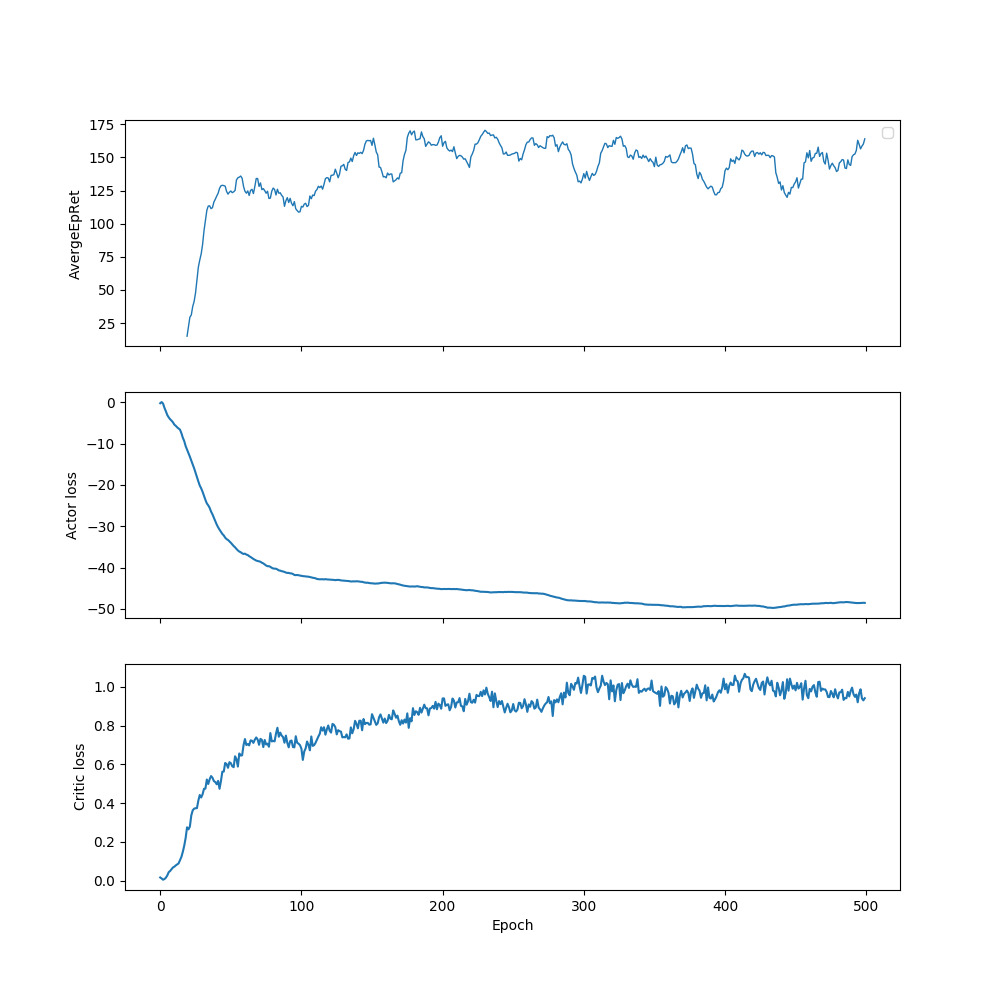

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


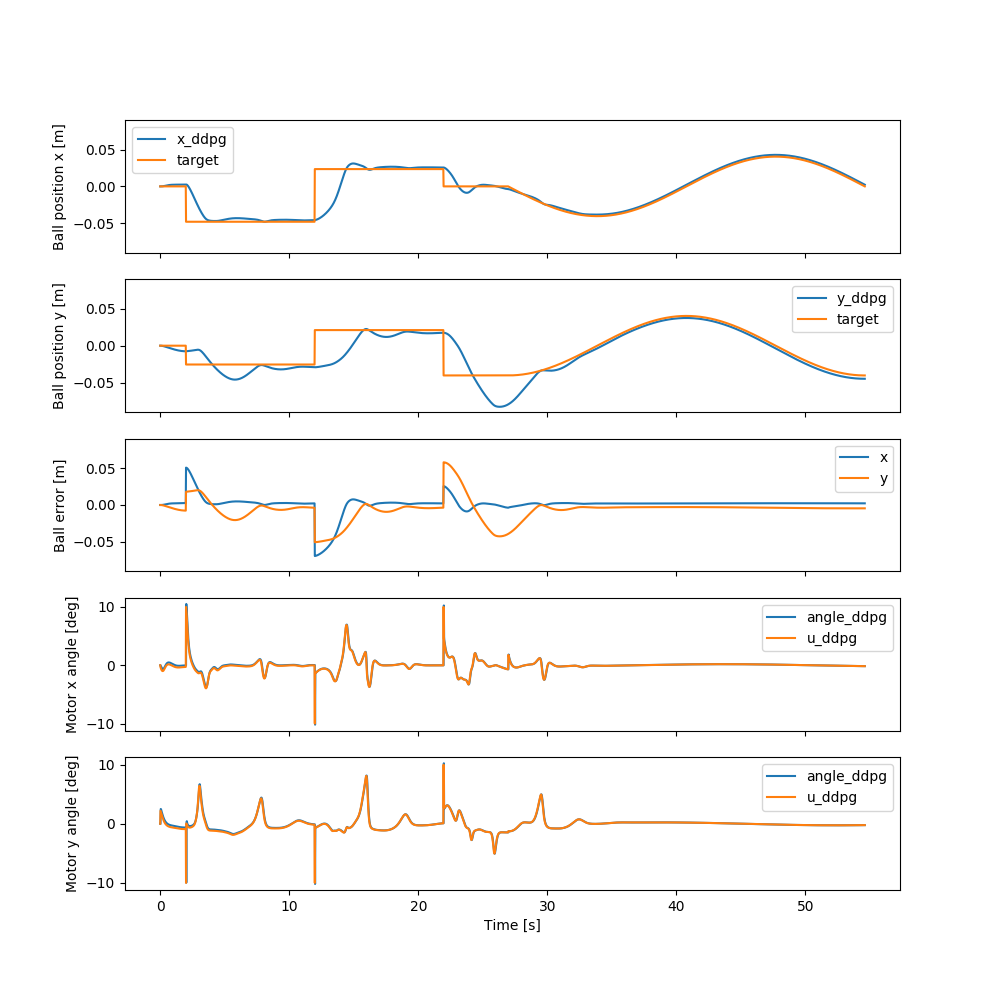

In [42]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00022008285148698134


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


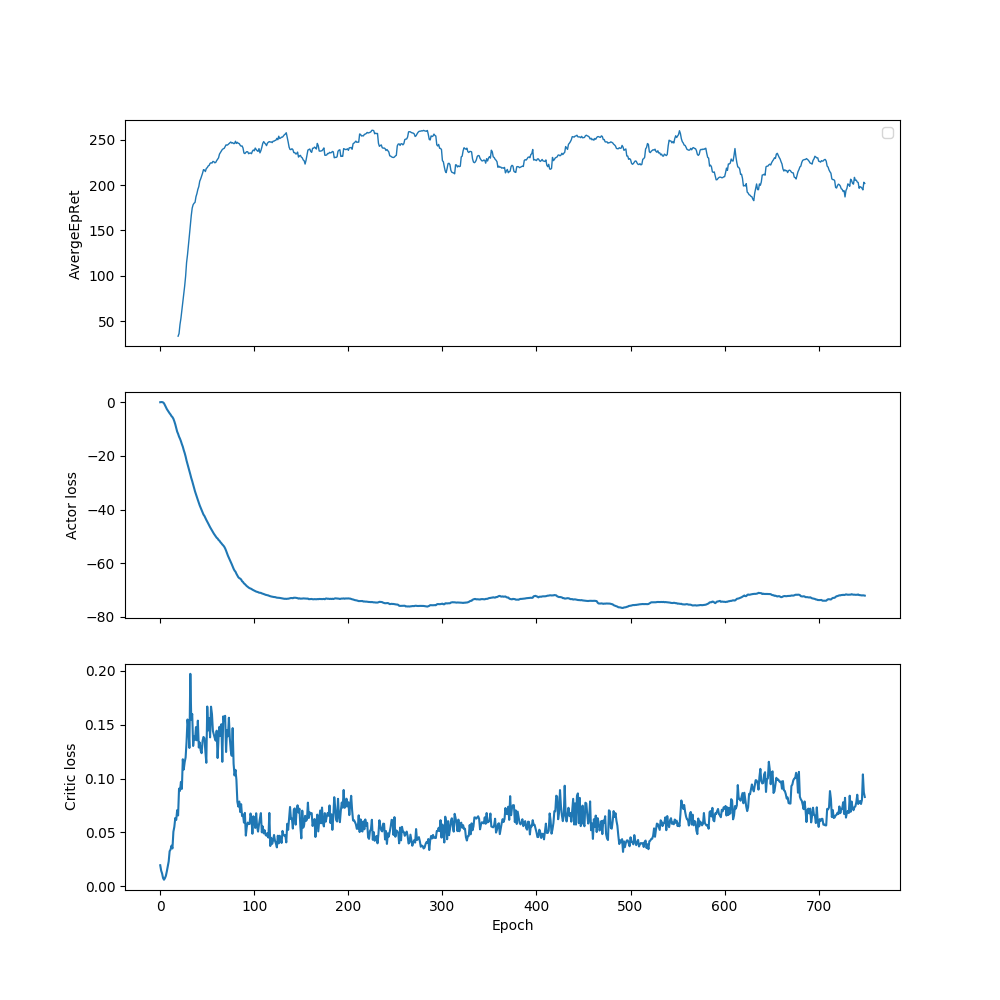

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


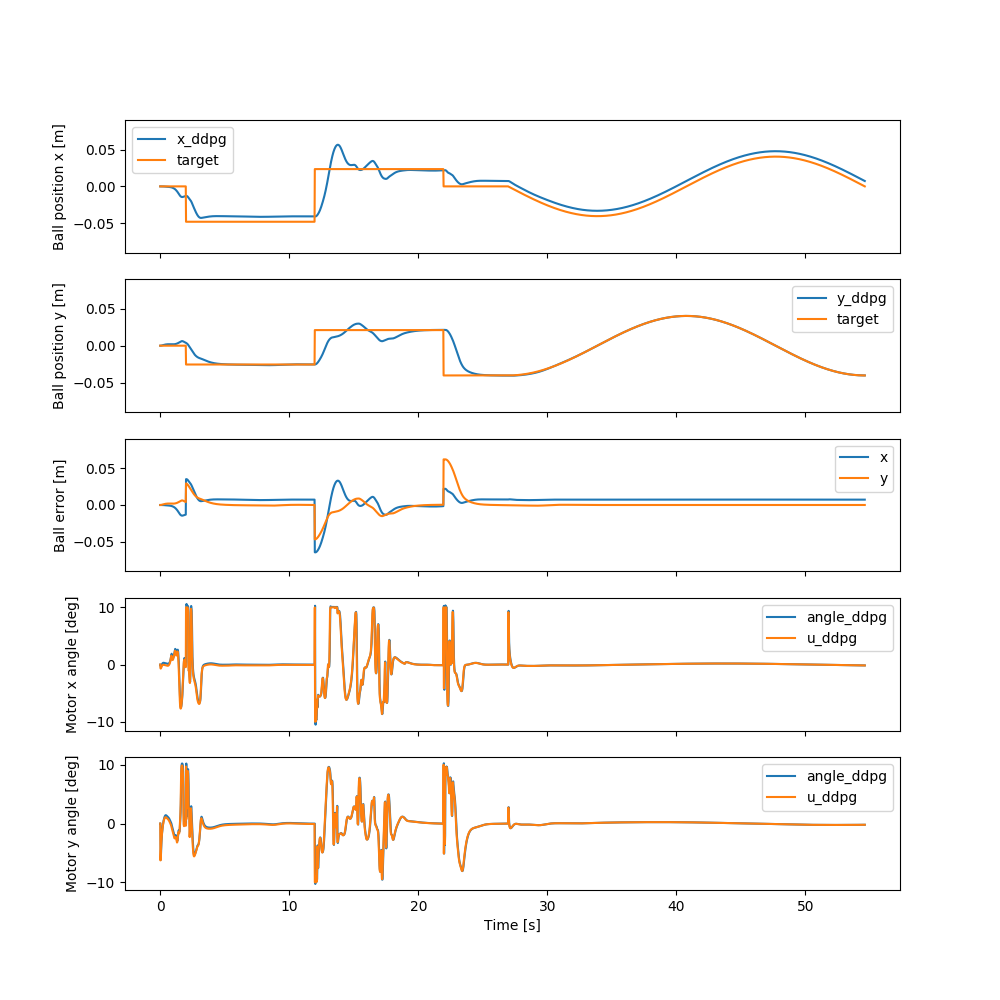

In [25]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,200,100]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0003703732055775561


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


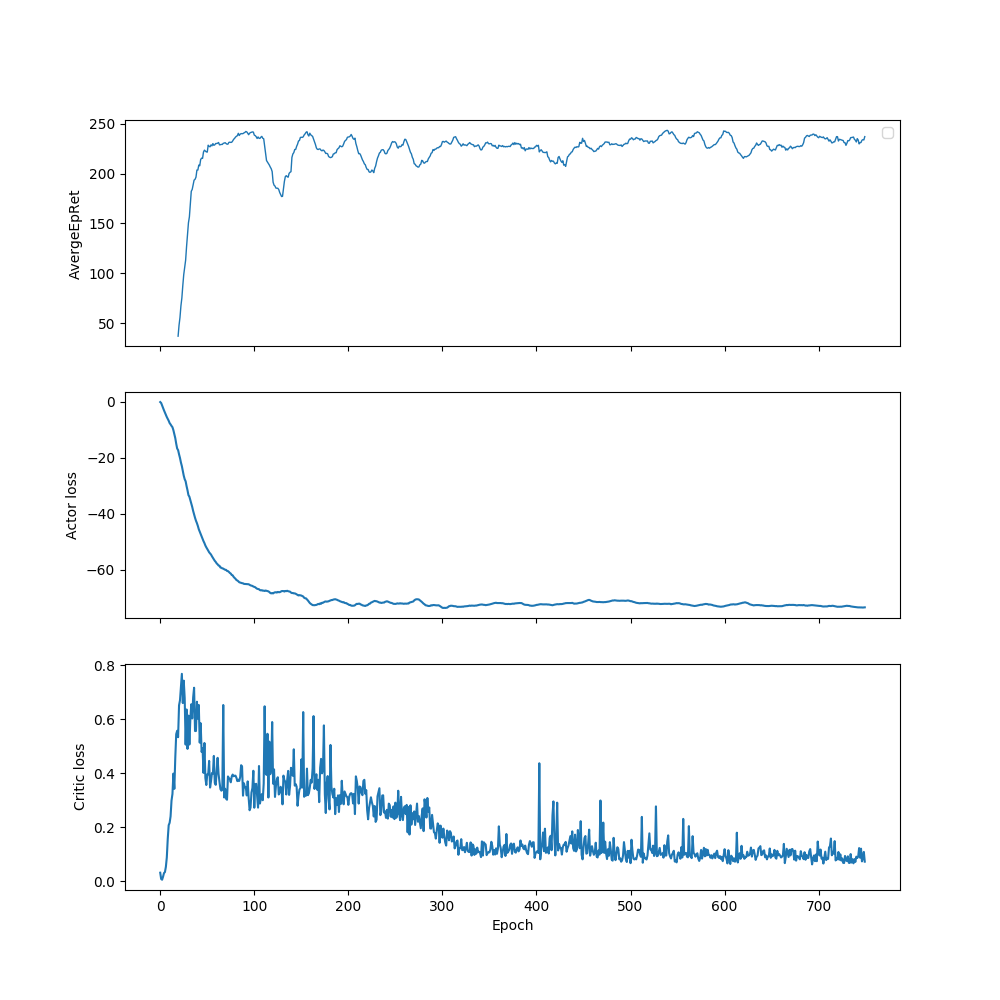

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


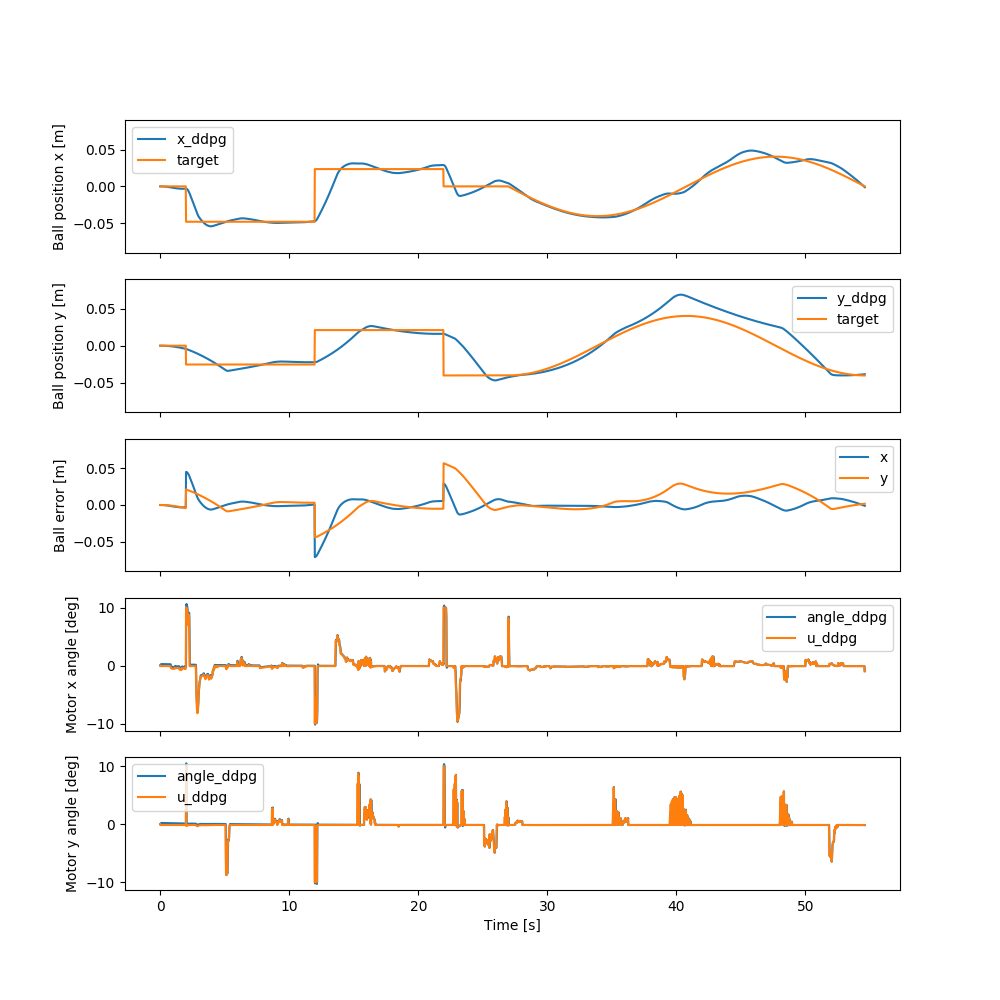

In [26]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.ReLU
name='lep_0.6_[200,200,100]_relu_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00030203275924854873


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


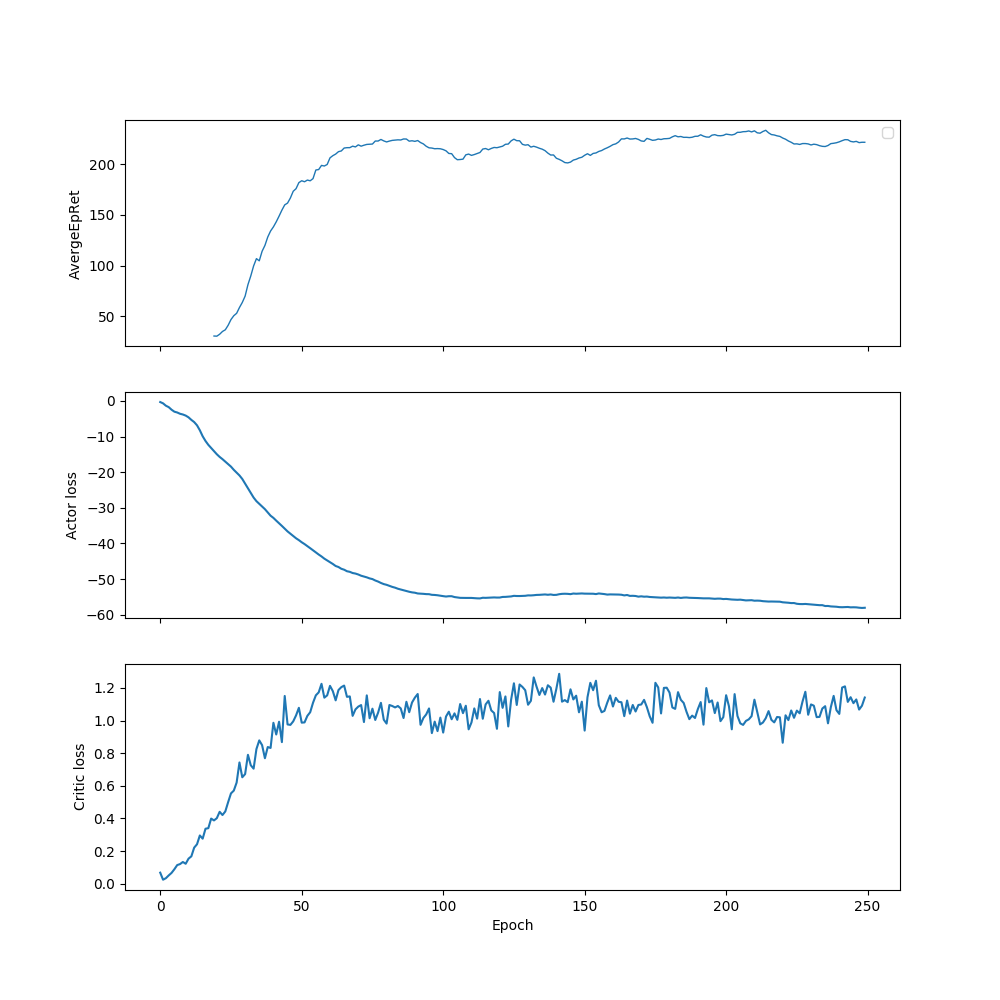

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


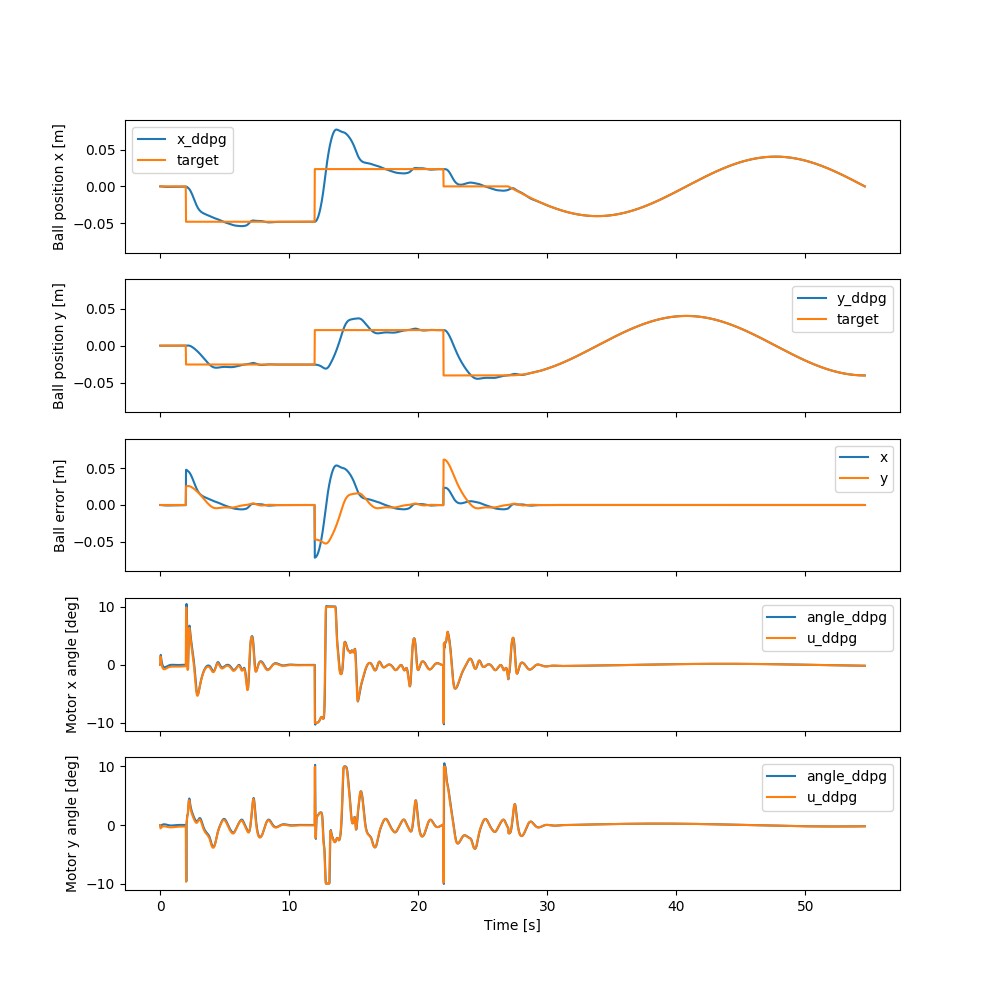

In [27]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([ 0.06156502, -0.0393634 ], dtype=float32), array([0.06620638, 0.04865773], dtype=float32), array([ 0.00240318, -0.00041171], dtype=float32))
MSE : -0.0002272941133593117


<IPython.core.display.Javascript object>


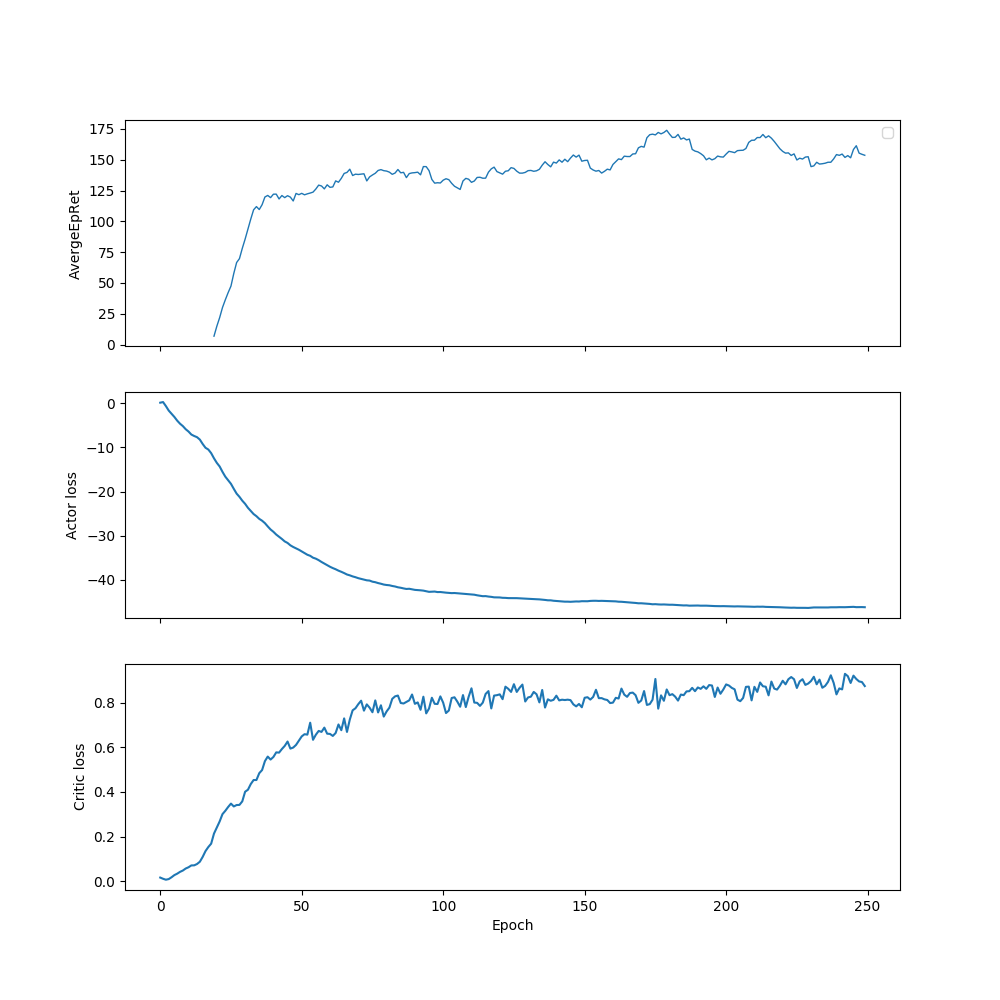

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


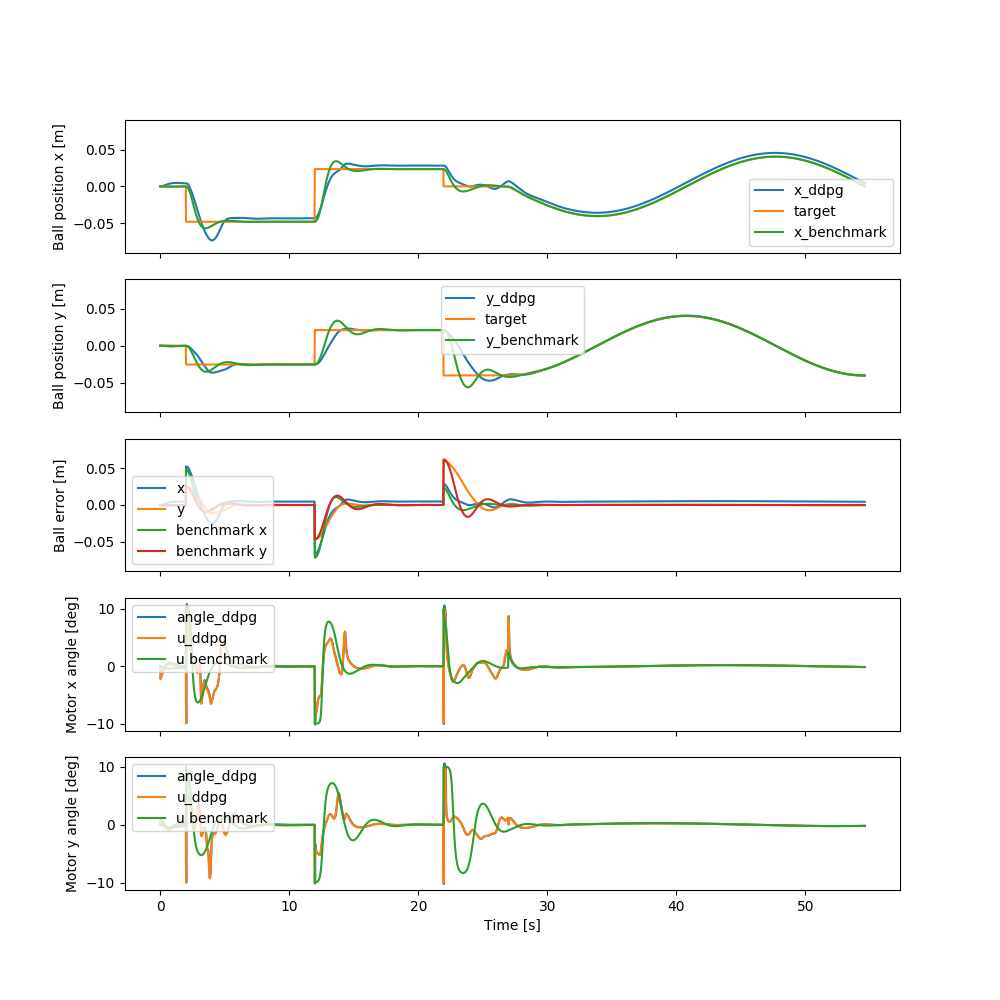

MSE ddpg -0.0002272941133593117
MSE benchmark 0.0001483028


In [58]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=True)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.01739953, -0.02648569], dtype=float32), array([-0.00853358,  0.01625128], dtype=float32), array([0.00240704, 0.00235126], dtype=float32))
MSE : -25218.73358266635


<IPython.core.display.Javascript object>


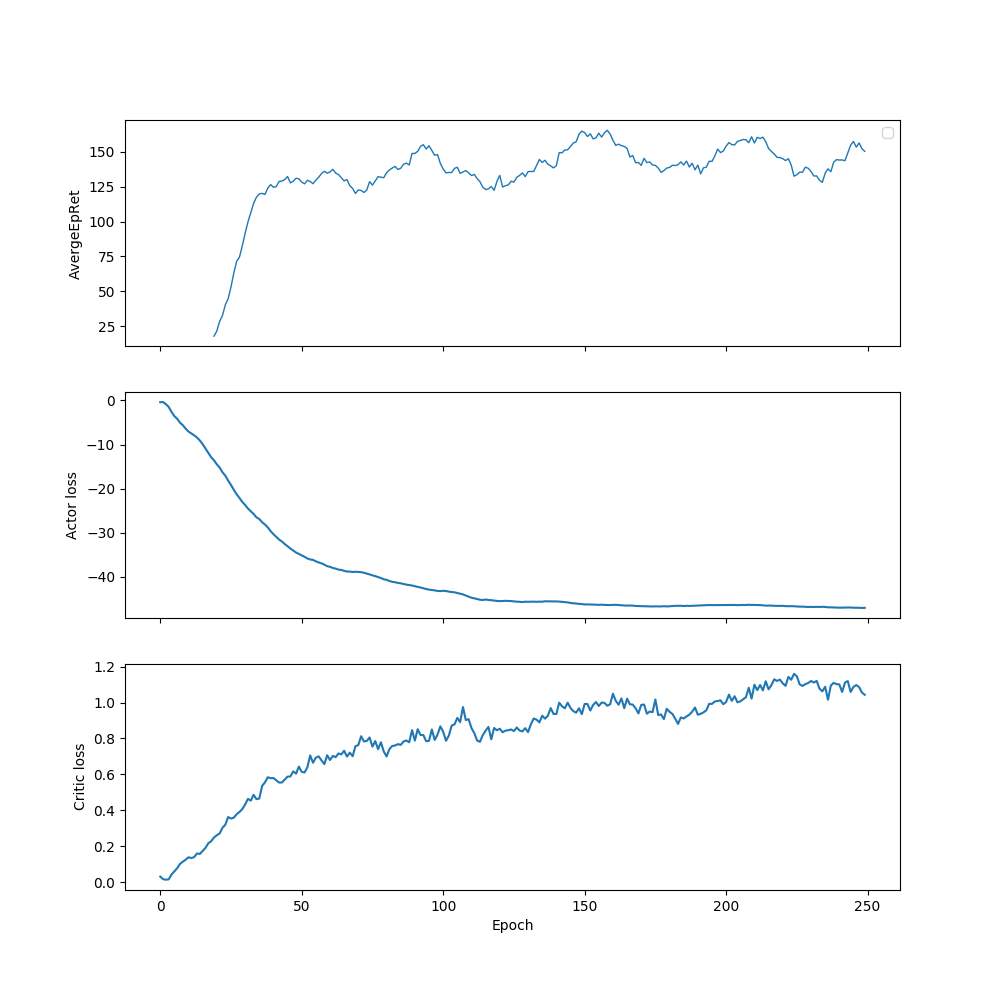

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


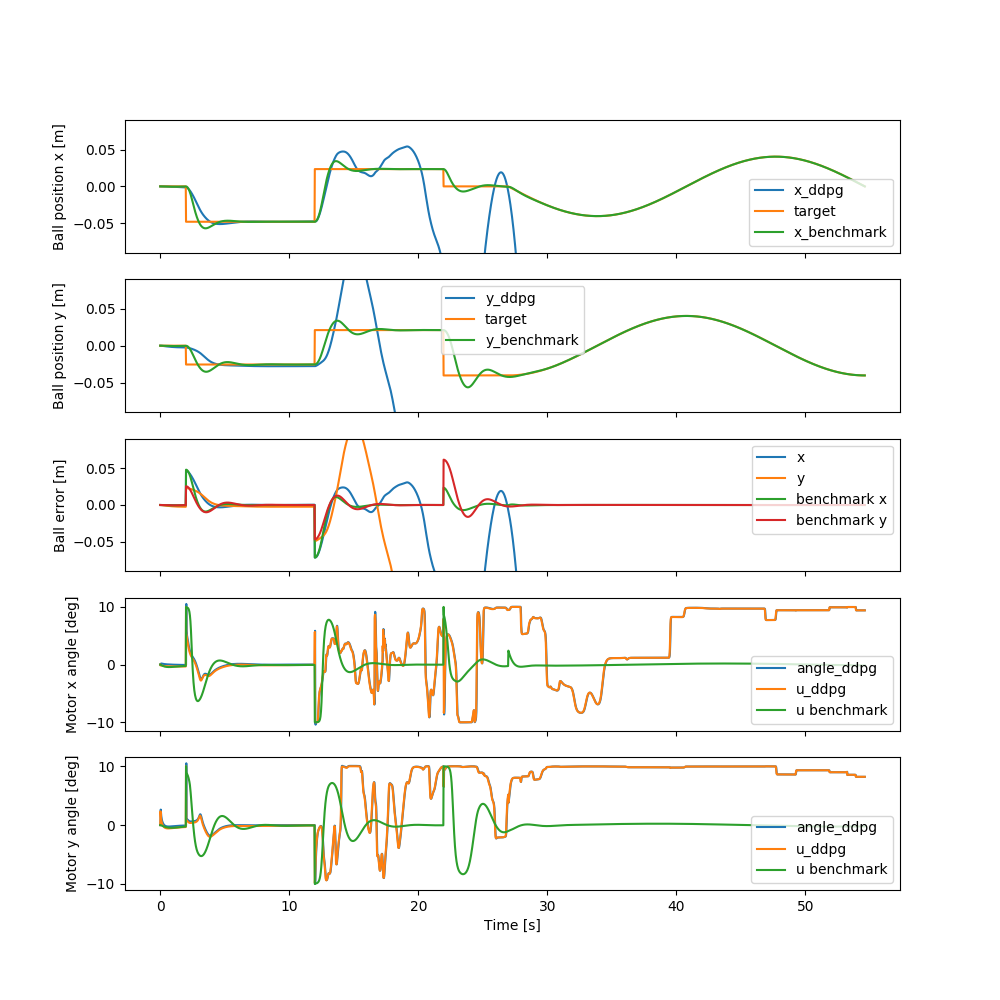

In [56]:
env = BBEnvNoIntegral
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=True)